In [1]:
from bitcoinrpc.authproxy import AuthServiceProxy, JSONRPCException
import seaborn as sns
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np  
from functools import lru_cache
rpc_connection = AuthServiceProxy("http://%s:%s@127.0.0.1:8332"%("moises", "moises123"),timeout=100000)

In [159]:
import funcoes as f

#Put the $ sign in front of the y-axis labels
import matplotlib.ticker as ticker
def currency_formatter(x, pos):
    return f"${x:,.0f}"

def bytes_formatter(x, pos):
    return f"{x:,.0f} bytes"

def btc_formatter(x, pos):
    return f"{x:,.8f} BTC"

In [2]:
commands = [ [ "getblockhash", height] for height in range(100) ]
transactions_list = rpc_connection.batch_(commands)
transactions_list

['000000000019d6689c085ae165831e934ff763ae46a2a6c172b3f1b60a8ce26f',
 '00000000839a8e6886ab5951d76f411475428afc90947ee320161bbf18eb6048',
 '000000006a625f06636b8bb6ac7b960a8d03705d1ace08b1a19da3fdcc99ddbd',
 '0000000082b5015589a3fdf2d4baff403e6f0be035a5d9742c1cae6295464449',
 '000000004ebadb55ee9096c9a2f8880e09da59c0d68b1c228da88e48844a1485',
 '000000009b7262315dbf071787ad3656097b892abffd1f95a1a022f896f533fc',
 '000000003031a0e73735690c5a1ff2a4be82553b2a12b776fbd3a215dc8f778d',
 '0000000071966c2b1d065fd446b1e485b2c9d9594acd2007ccbd5441cfc89444',
 '00000000408c48f847aa786c2268fc3e6ec2af68e8468a34a28c61b7f1de0dc6',
 '000000008d9dc510f23c2657fc4f67bea30078cc05a90eb89e84cc475c080805',
 '000000002c05cc2e78923c34df87fd108b22221ac6076c18f3ade378a4d915e9',
 '0000000097be56d606cdd9c54b04d4747e957d3608abe69198c661f2add73073',
 '0000000027c2488e2510d1acf4369787784fa20ee084c258b58d9fbd43802b5e',
 '000000005c51de2031a895adc145ee2242e919a01c6d61fb222a54a54b4d3089',
 '0000000080f17a0c5a67f663a9bc9969

In [15]:
#rpc_connection = AuthServiceProxy("http://%s:%s@127.0.0.1:8332"%("moises", "moises123"))
blocks = rpc_connection.batch_([ [ "getblock", h ] for h in transactions_list ])
blocks[0]

{'hash': '000000000019d6689c085ae165831e934ff763ae46a2a6c172b3f1b60a8ce26f',
 'confirmations': 802260,
 'height': 0,
 'version': 1,
 'versionHex': '00000001',
 'merkleroot': '4a5e1e4baab89f3a32518a88c31bc87f618f76673e2cc77ab2127b7afdeda33b',
 'time': 1231006505,
 'mediantime': 1231006505,
 'nonce': 2083236893,
 'bits': '1d00ffff',
 'difficulty': 1,
 'chainwork': '0000000000000000000000000000000000000000000000000000000100010001',
 'nTx': 1,
 'nextblockhash': '00000000839a8e6886ab5951d76f411475428afc90947ee320161bbf18eb6048',
 'strippedsize': 285,
 'size': 285,
 'weight': 1140,
 'tx': ['4a5e1e4baab89f3a32518a88c31bc87f618f76673e2cc77ab2127b7afdeda33b']}

In [110]:
block_times = [ block["time"] for block in blocks ]

In [111]:
print(block_times)

[1231006505, 1231469665, 1231469744, 1231470173, 1231470988, 1231471428, 1231471789, 1231472369, 1231472743, 1231473279, 1231473952, 1231474360, 1231474888, 1231475020, 1231475589, 1231562746, 1231562758, 1231563791, 1231564334, 1231564974, 1231565995, 1231566553, 1231567467, 1231567611, 1231568277, 1231568646, 1231570450, 1231570573, 1231601457, 1231601503, 1231602122, 1231602736, 1231603171, 1231603939, 1231604338, 1231605153, 1231605789, 1231606762, 1231607488, 1231607511, 1231608208, 1231608903, 1231609153, 1231609477, 1231610361, 1231611068, 1231611793, 1231612888, 1231613140, 1231613802, 1231614698, 1231615503, 1231616363, 1231617190, 1231617386, 1231618509, 1231618848, 1231619676, 1231620564, 1231620928, 1231621959, 1231622445, 1231623224, 1231623880, 1231624107, 1231624503, 1231625020, 1231626072, 1231626618, 1231626979, 1231627646, 1231628459, 1231629194, 1231630288, 1231631189, 1231631822, 1231632554, 1231633184, 1231635654, 1231645607, 1231646077, 1231646456, 1231647491, 123

In [ ]:
first_transaction = rpc_connection.getrawtransaction('2674c8a46b75e5a5e3287a34d7999a1e5e6f052be36f63f3cb483ec148c9b86c', True)


In [ ]:
print(first_transaction.keys())

dict_keys(['txid', 'hash', 'version', 'size', 'vsize', 'weight', 'locktime', 'vin', 'vout', 'hex', 'blockhash', 'confirmations', 'time', 'blocktime'])


# Análise exploratória da blockchain do Bitcoin

## Análise de blocos

#### getblockhash

Comando busca o hash do último bloco que foi validado:

Confira aqui [https://www.blockchain.com/explorer/assets/btc]

In [89]:
best_block_hash = rpc_connection.getbestblockhash()
print(best_block_hash)

000000000000000000037802ddf61e814c49d4df7ac4ca57dbf92a8d060d9a30


#### Getblock

In [120]:
get_block = rpc_connection.getblock("ed25927576988e38e4cc8e4b19d1272c480f113fb605271b190df05aa983714e")
get_block

JSONRPCException: -5: Block not found

In [57]:
get_block

{'hash': '00000000c937983704a73af28acdec37b049d214adbda81d7e2a3dd146f6ed09',
 'confirmations': 795288,
 'height': 1000,
 'version': 1,
 'versionHex': '00000001',
 'merkleroot': 'fe28050b93faea61fa88c4c630f0e1f0a1c24d0082dd0e10d369e13212128f33',
 'time': 1232346882,
 'mediantime': 1232344831,
 'nonce': 2595206198,
 'bits': '1d00ffff',
 'difficulty': 1,
 'chainwork': '000000000000000000000000000000000000000000000000000003e903e903e9',
 'nTx': 1,
 'previousblockhash': '0000000008e647742775a230787d66fdf92c46a48c896bfbc85cdc8acc67e87d',
 'nextblockhash': '00000000a2887344f8db859e372e7e4bc26b23b9de340f725afbf2edb265b4c6',
 'strippedsize': 216,
 'size': 216,
 'weight': 864,
 'tx': ['fe28050b93faea61fa88c4c630f0e1f0a1c24d0082dd0e10d369e13212128f33']}

In [55]:
get_block.keys()

dict_keys(['hash', 'confirmations', 'height', 'version', 'versionHex', 'merkleroot', 'time', 'mediantime', 'nonce', 'bits', 'difficulty', 'chainwork', 'nTx', 'previousblockhash', 'nextblockhash', 'strippedsize', 'size', 'weight', 'tx'])

In [56]:
get_block.values()

dict_values(['00000000c937983704a73af28acdec37b049d214adbda81d7e2a3dd146f6ed09', 795288, 1000, 1, '00000001', 'fe28050b93faea61fa88c4c630f0e1f0a1c24d0082dd0e10d369e13212128f33', 1232346882, 1232344831, 2595206198, '1d00ffff', 1, '000000000000000000000000000000000000000000000000000003e903e903e9', 1, '0000000008e647742775a230787d66fdf92c46a48c896bfbc85cdc8acc67e87d', '00000000a2887344f8db859e372e7e4bc26b23b9de340f725afbf2edb265b4c6', 216, 216, 864, ['fe28050b93faea61fa88c4c630f0e1f0a1c24d0082dd0e10d369e13212128f33']])

O que é cada um desses atributos de uma transação?

blockweight foram implementados na segwit e é uma forma de restrição (do tamanho do bloco?);

Blockweight = strippedsize*3 + size;

Blockweight (non segwit blocks) = 4*size;

Confirmations é o número de blocos que foram incluidos na blockchain depois desse bloco. Normalmente lojas só vão aceitar seu pagamento como válido depois de 6 "confirmations" para resolver o problema do gasto duplo. Esse problema já foi resolvido?;

Chainwork é a quantidade de hashs (estimados) necessários para reproduzir  blockchain desde sua horigem até esse bloco. Vale o bloco que tem a maior chainwork;

difficulty é o valor que a dificuldade está aumentando ou diminuindo nesse bloco;

bits é o target que ajuda a calcular a dificuldade;

Time é a hora que o minerador começou a fazer o sha256(sha256(header)), sendo que o time tem que ser maior que a média de tempo dos 11 blocos minerados anteriormente e os full nodes só aceitaram -no máximo- blocos minerados com 2 horas a frente do relógio deles;

nonce se não for encontrado um dos 32-bit valores que satisfaça a dificuldade então o time é atualizado assim como a merkle root;
 
nTx é o número de trasações contidas nesse bloco

mediantime é a média de tempo (time) dos 11 blocos minerados anteriores a ele;

#### Getblockchaininfo

Informações do bloco mais recente


In [66]:
get_blockchain_info = rpc_connection.getblockchaininfo()

In [69]:
get_blockchain_info

{'chain': 'main',
 'blocks': 796315,
 'headers': 796315,
 'bestblockhash': '000000000000000000037802ddf61e814c49d4df7ac4ca57dbf92a8d060d9a30',
 'difficulty': Decimal('52350439455487.47'),
 'time': 1687986986,
 'mediantime': 1687981087,
 'verificationprogress': Decimal('0.9999989081629271'),
 'initialblockdownload': False,
 'chainwork': '00000000000000000000000000000000000000004d1df583f2ab7ae3a7e5bb44',
 'size_on_disk': 558140230555,
 'pruned': False,
 'warnings': ''}

#### getblockcount

Retorna a altura (height) do bloco mais longo (que tenha o maior chainwork)

In [71]:
get_blockchain_info = rpc_connection.getblockcount()
get_blockchain_info

796315

#### Filtertype

Não funciona, mas deveria retornar as informações de um bloco que satisfizessem um filtro

In [112]:
%get_block_filter = rpc_connection.getblockfilter("00000000c937983704a73af28acdec37b049d214adbda81d7e2a3dd146f6ed09", "chainwork")
%get_block_filter

UsageError: Line magic function `%get_block_filter` not found.


#### getblockhash

Retorna o hash do bloco especificado pelo seu índice (height);

In [105]:
get_block_hash = rpc_connection.getblockhash(100000)
get_block_hash

'000000000003ba27aa200b1cecaad478d2b00432346c3f1f3986da1afd33e506'

#### getblockheader

Retorna o cabeçalho de um bloco;

In [112]:
get_block_header = rpc_connection.getblockheader("00000000000000000004835f7cab3b0c04d54ee669bbcb7d4ac74765dab45f5a")
get_block_header

{'hash': '00000000000000000004835f7cab3b0c04d54ee669bbcb7d4ac74765dab45f5a',
 'confirmations': 94,
 'height': 796223,
 'version': 536977408,
 'versionHex': '2001a000',
 'merkleroot': '61a414e0ff1b778713434494c52761d2c7d01c2cb70bcaefe85a3f2056ece492',
 'time': 1687918054,
 'mediantime': 1687910412,
 'nonce': 214966359,
 'bits': '1705606d',
 'difficulty': Decimal('52350439455487.47'),
 'chainwork': '00000000000000000000000000000000000000004d0cd91a7a47ceb11c460080',
 'nTx': 2985,
 'previousblockhash': '00000000000000000004ccb63b3bb7f4f4ce0b8eb69ed80edc38380f552cc832',
 'nextblockhash': '00000000000000000003c4448fd5febf208c71f945e9641b57826f2caf27a27f'}

#### getblockstats

Mostra as principais estatísticas de um bloco;

feerate_percentiles = 10th percentile, 25th percentile, 50th percentile, 75th percentile, 90th percentile;

ins = número de inputs (excluindo coinbase);

outs = número de outputs;

subsidy = número de bitcoins criados no bloco (coinbase);

swtotal_size = tamanho total de todas as transações segwit do bloco;

swtotal_weight = peso total de todas transações segwit do bloco;

swtxs = número de transações segwit no bloco;

total_out = total de outputs, sem contar coinbase e reward (subsidy + totalfee);

total_size = tamanho total de todas as transações não coinbase;

total_wheight = peso total de todas as transações não coinbase;

utxo_increase = o aumento no número de utxos;

utxo_size_inc = o aumento no tamanho do index de utxo????



In [145]:
get_block_stats = rpc_connection.batch_([["getblockstats",600000]]) 
get_block_stats

[{'avgfee': 1956,
  'avgfeerate': 5,
  'avgtxsize': 452,
  'blockhash': '00000000000000000007316856900e76b4f7a9139cfbfba89842c8d196cd5f91',
  'feerate_percentiles': [1, 1, 2, 3, 8],
  'height': 600000,
  'ins': 3761,
  'maxfee': 201144,
  'maxfeerate': 344,
  'maxtxsize': 66300,
  'medianfee': 250,
  'mediantime': 1571440177,
  'mediantxsize': 283,
  'minfee': 111,
  'minfeerate': 1,
  'mintxsize': 189,
  'outs': 4120,
  'subsidy': 1250000000,
  'swtotal_size': 457492,
  'swtotal_weight': 1197064,
  'swtxs': 1234,
  'time': 1571443461,
  'total_out': 339799010258,
  'total_size': 870088,
  'total_weight': 2847448,
  'totalfee': 3764047,
  'txs': 1925,
  'utxo_increase': 359,
  'utxo_size_inc': 84708,
  'utxo_increase_actual': -668,
  'utxo_size_inc_actual': -49375}]

#### getchaintips

Retorna os tips da rede principal e de redes orfãs da blockchain do bitocin;

O que são os tips?????

In [147]:
get_chain_tips = rpc_connection.getchaintips()
get_chain_tips

[{'height': 796332,
  'hash': '000000000000000000016dfd39143827ced636c54d6a39030dbc8796b340f5ca',
  'branchlen': 0,
  'status': 'active'},
 {'height': 795426,
  'hash': '000000000000000000045d66a7991b54de7e11776eed27e34df24a59b7de370e',
  'branchlen': 1,
  'status': 'headers-only'}]

## Análise de Transações

#### listunspent

Lista todas as utxos que a carteira que estou usando possui;


In [154]:
list_unspent = rpc_connection.listunspent()
list_unspent

[]

#### gettxoutsetinfo

height = height do bloco corrente

bestblock = o bloco na "tip" da blockchain, ou seja, o bloco mais atual da cadeia mais longa.

txouts = número de unspent transactions outputs;

bogosize = número sobre utxo que não serve para nada (literalmente);

total_amount = ?

disk_size = o tamanhanho estimado de espaço ocupado pelo conjunto de dados;

transactions = número de transações com unspent outputs;

In [4]:
 #bem demorado pra rodar
get_tx_set_info = rpc_connection.gettxoutsetinfo()
get_tx_set_info 

{'height': 796340,
 'bestblock': '00000000000000000004ed8095ca3405c0e550dc41f9b866321c6eef989f4356',
 'txouts': 106431301,
 'bogosize': 8053537467,
 'hash_serialized_2': 'e82f6ecbd581d4522f43a1a33354b69ef17e1846f47f00567a866d94c0247c56',
 'total_amount': Decimal('19414411.87349650'),
 'transactions': 67807171,
 'disk_size': 6762027716}

#### gettxout

Retorna os detalhes de uma utxo; 
Não aparece nada pois a carteira que estou usando não possui nenhuma utxo;  

In [17]:
get_tx_out = rpc_connection.gettxout("e354114e82829046edf99f881793e6da1a8c48f67176b9a6c8a94030765ff942",2)
get_tx_out

In [18]:
print(get_tx_out)

None


#### getaddressinfo 

Retorna algumas informações (não tão relevantes de um endereço público)

scriptPubKey =  The hex-encoded scriptPubKey generated by the address.

ismine = o endereço é meu?

solvable = se é possivel gastar o saldo desse endereço (ignorando a possibilidade de perda das chaves privadas);

iswatchonly = se o endereço é watchonly (apenas para visualização de saldo, sem poder realizar assinaturas);

isscript = se a chave é um script;

iswitness = se o endereço é um witnessadress;

ischange = se o endereço foi utilizado como troco (tenho que ver se isso ainda funciona);


In [23]:
get_address_info = rpc_connection.getaddressinfo("13XSrVkweo5Dzm3yuykFw4P63N63MA6bTd")
get_address_info

{'address': '13XSrVkweo5Dzm3yuykFw4P63N63MA6bTd',
 'scriptPubKey': '76a9141bb24fcdb9dbe71e837b89d866e8200004e6e03088ac',
 'ismine': False,
 'solvable': False,
 'iswatchonly': False,
 'isscript': False,
 'iswitness': False,
 'ischange': False,
 'labels': []}

## Transações

#### getrawtransaction

Preciso usar verbosity = 2 para obter a taxa de transação 

version = apenas as versões 1 e 2 são padrões, a diferença é que só é possível utilizar OP_CHECKSEQUENCEVERIFY com a verão 2;

size = 

vsize = virtual transaction size = transaction weight / 4 (arrendondado para o próximo inteiro);

weight = Base transaction size (exlui witness) * 3 + Total transaction size (inclui witness);

locktime = Número do bloco que a transação poderá ser realizada;

vin = array de inputs 

vout = o número do output para referênciar sua ordem, já que pode haver vários outputs;

vout : value = valor em BTC da transação




witness size = (4/3) * (total - vsize)


In [51]:
get_raw_transaction = rpc_connection.getrawtransaction("caf6cf2928a598611f3278832871b7d3adb5e251ccc32429f41f0c5fc1150778", 2)
get_raw_transaction

{'txid': 'caf6cf2928a598611f3278832871b7d3adb5e251ccc32429f41f0c5fc1150778',
 'hash': 'ac4467bef857d6a66b2ebfa56895794c26ebe38bc5cc667d3149fc479421a31d',
 'version': 2,
 'size': 226,
 'vsize': 144,
 'weight': 574,
 'locktime': 0,
 'vin': [{'txid': '5a05f5a0048c8cda90fdac5c21273d3da684d6858c3d1e64e6f7f511bebffc21',
   'vout': 1,
   'scriptSig': {'asm': '', 'hex': ''},
   'txinwitness': ['30450221008de93f17a840da88865ed2f2f3cc7e76897b1b01e8ac127d38ae5a2bdffa9a7c02203fef5bf1bf6510bc49a28fb971c49caa8a0034bca3d4322507b178e585251f4c01',
    '026e5628506ecd33242e5ceb5fdafe4d3066b5c0f159b3c05a621ef65f177ea286'],
   'prevout': {'generated': False,
    'height': 796357,
    'value': Decimal('4.81091464'),
    'scriptPubKey': {'asm': '0 f60834ef165253c571b11ce9fa74e46692fc5ec1',
     'desc': 'addr(bc1q7cyrfmck2ffu2ud3rn5l5a8yv6f0chkp0zpemf)#kcdfju3j',
     'hex': '0014f60834ef165253c571b11ce9fa74e46692fc5ec1',
     'address': 'bc1q7cyrfmck2ffu2ud3rn5l5a8yv6f0chkp0zpemf',
     'type': 'witness_v0_

In [52]:
get_raw_transaction["vout"]

[{'value': Decimal('0.00939180'),
  'n': 0,
  'scriptPubKey': {'asm': 'OP_DUP OP_HASH160 7b9135c12fa5e7a38cbea5ae0dfdfdde09704f5c OP_EQUALVERIFY OP_CHECKSIG',
   'desc': 'addr(1CGN4xm2ZZEYRPGQz1anekTM54YquvXUKB)#w7tnuy4d',
   'hex': '76a9147b9135c12fa5e7a38cbea5ae0dfdfdde09704f5c88ac',
   'address': '1CGN4xm2ZZEYRPGQz1anekTM54YquvXUKB',
   'type': 'pubkeyhash'}},
 {'value': Decimal('4.80115534'),
  'n': 1,
  'scriptPubKey': {'asm': '0 f60834ef165253c571b11ce9fa74e46692fc5ec1',
   'desc': 'addr(bc1q7cyrfmck2ffu2ud3rn5l5a8yv6f0chkp0zpemf)#kcdfju3j',
   'hex': '0014f60834ef165253c571b11ce9fa74e46692fc5ec1',
   'address': 'bc1q7cyrfmck2ffu2ud3rn5l5a8yv6f0chkp0zpemf',
   'type': 'witness_v0_keyhash'}}]

In [3]:
get_info = rpc_connection.listtransactions("*", 20, 100)
get_info

[]

## 1 Análise dos dados getblockstats
 link: https://developer.bitcoin.org/reference/rpc/getblockstats.html

In [4]:
# Get blockchain stats data base via sqlite3

conn = sqlite3.connect("bitcoin_blockchain.db")
df_blockstats = pd.read_sql("select * from blockchain", conn)

# Convertendo os dados de hora de unix time para GMT
df_blockstats["GMT"] = pd.to_datetime(df_blockstats["time"], unit="s")
df_blockstats["year"] = df_blockstats["GMT"].dt.year

# Convertendo os dados de avgfee de sotoshis para btc
df_blockstats["avgfee_btc"] = df_blockstats["avgfee"] / 100_000_000
df_blockstats["maxfee_btc"] = df_blockstats["maxfee"] / 100_000_000
df_blockstats["minfee_btc"] = df_blockstats["minfee"] / 100_000_000
# Subsidy em BTC
df_blockstats["subsidy_btc"] = df_blockstats["subsidy"] / 100_000_000

# Exclud columns with values in satoshis
#df_blockstats = df_blockstats.drop(columns=["subsidy", "avgfee"])

# Convert dataframe column blockhash (hexadecimal) to decimal

df_blockstats['blockhash_decimal'] = df_blockstats['blockhash'].apply(lambda x: int(x, 16))

# convert feerate_percentiles (string) to number 
df_blockstats["feerate_percentiles"] = df_blockstats["feerate_percentiles"].apply(lambda x: eval(x))

In [183]:
#seleciona periodo a ser utilizado no grafico
@lru_cache(maxsize=None) #decorator para melhorar a performance salvando o resultado em cache
def trimma_data(data_inicio, data_fim):
    #data = df_blockstats[(df_blockstats['GMT'] >= data_inicio) & (df_blockstats['GMT'] <= data_fim)]
    #data = df_blockstats_daily[(df_blockstats_daily['GMT'] >= data_inicio) & (df_blockstats_daily['GMT'] <= data_fim)]
    data = df_blockstats_daily_mean[(df_blockstats_daily_mean['GMT'] >= data_inicio) & (df_blockstats_daily_mean['GMT'] <= data_fim)]
    
    return data

# Criação de gráficos para análise exploratória dos dados
 
def cria_scatterplot(data, titulo, x, y, cor = 'blue', data_inicio = '2009-01-09', data_fim = '2023-07-31', precisao= 4, log = False, second_y = None, ylabel = None):
    media_movel = 50
    sns.set(font_scale=1)
    #seleciona periodo a ser utilizado no grafico 
    data = trimma_data(data_inicio, data_fim)
    plt.figure(figsize=(20,10))
    plt.title(f"{titulo} de {data_inicio} até {data_fim}", fontsize=20)
    plt.xlabel(x, fontsize=20)
    plt.ylabel(y, fontsize=20)
    # plot a scatterplot
    if log:
        plt.yscale('log')
        plt.scatter(data[x], data[y], color=cor, s=1)
    else:
        plt.scatter(data[x], data[y], color=cor, s=1, alpha=0.5)
        plt.ticklabel_format(style='plain', axis='y')
    
    if second_y:
        plt.scatter(data[x], data[second_y], color="yellow", s=1, alpha=0.8)
        plt.ticklabel_format(style='plain', axis='y')
    # get the line of average and standard deviation
    media = data[y].mean()
    desvio = data[y].std()

    #limit the y axis by a value that is 2 standard deviations above the mean and 2 standard deviations below the mean
    plt.ylim(media - 2*desvio, media + 10*desvio)
    # plot the 100 day moving average with 1 standard deviation
    plt.plot(data[x], data[y].rolling(media_movel).mean(), color='red', linewidth=2, alpha=0.9)
    
    plt.fill_between(data[x],data[y].rolling(media_movel).mean() - data[y].rolling(media_movel).std(), data[y].rolling(media_movel).mean() + data[y].rolling(media_movel).std(),color = "orange",alpha=0.5)
    
    plt.legend([y,f'μ móvel {media_movel} blocos', f'σ móvel {media_movel} blocos'], loc='upper right', fontsize=15)
    ax = plt.gca()

    if ylabel == "bytes":    
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(bytes_formatter))
    elif ylabel == "USD":
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(currency_formatter))
    elif ylabel == "BTC":
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(btc_formatter))
        
    plt.show()


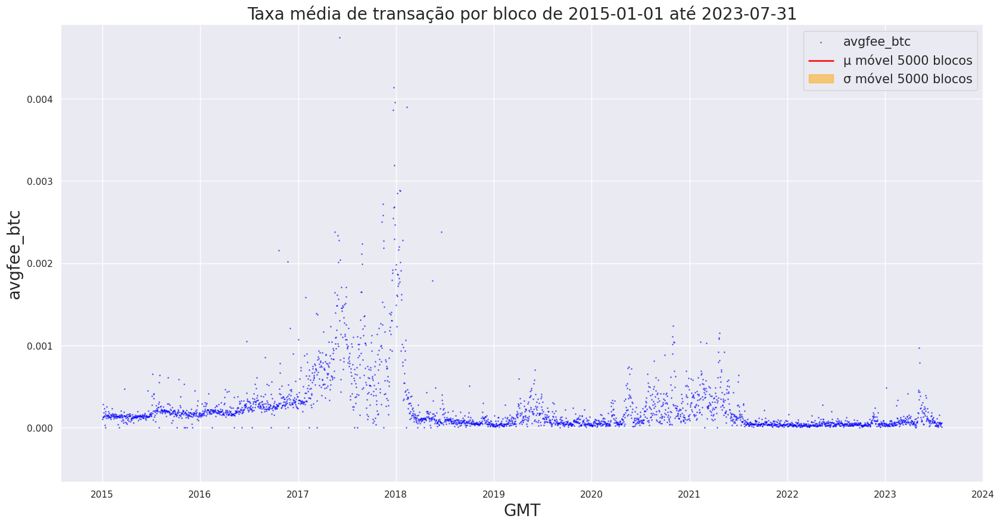

In [48]:
cria_scatterplot(data=df_blockstats, titulo="Taxa média de transação por bloco", x="GMT", y="avgfee_btc", data_inicio="2015-01-01", cor = "blue")

# por que existem esses picos?

In [29]:
# find the data type of each column so as not to plotwhat is not a number
df_blockstats.dtypes
for col in df_blockstats.columns:
    print(col, ':', df_blockstats[col].dtype)


index : int64
avgfee : int64
avgfeerate : int64
avgtxsize : int64
blockhash : object
feerate_percentiles : object
height : int64
ins : int64
maxfee : int64
maxfeerate : int64
maxtxsize : int64
medianfee : int64
mediantime : int64
mediantxsize : int64
minfee : int64
minfeerate : int64
mintxsize : int64
outs : int64
subsidy : int64
swtotal_size : int64
swtotal_weight : int64
swtxs : int64
time : int64
total_out : int64
total_size : int64
total_weight : int64
totalfee : int64
txs : int64
utxo_increase : int64
utxo_size_inc : int64
utxo_increase_actual : int64
utxo_size_inc_actual : int64
blockhash_decimal : object
GMT : datetime64[ns]
year : int32
avgfee_btc : float64
subsidy_btc : float64


In [30]:
# Cria um dicionário de descrições
desc = """ "avgfee" : n,                (numeric) Average fee in the block
  "avgfeerate" : n,            (numeric) Average feerate (in satoshis per virtual byte)
  "avgtxsize" : n,             (numeric) Average transaction size
  "blockhash" : "hex" n,         (string) The block hash (to check for potential reorgs)
  "feerate_percentiles" : n,[    (json array) Feerates at the 10th, 25th, 50th, 75th, and 90th percentile weight unit (in satoshis per virtual byte);(numeric) The 10th percentile feerate;(numeric) The 25th percentile feerate;(numeric) The 50th percentile feerate;(numeric) The 75th percentile feerate;(numeric) The 90th percentile feerate],
  "height" : n,                (numeric) The height of the block
  "ins" : n,                   (numeric) The number of inputs (excluding coinbase)
  "maxfee" : n,                (numeric) Maximum fee in the block
  "maxfeerate" : n,            (numeric) Maximum feerate (in satoshis per virtual byte)
  "maxtxsize" : n,             (numeric) Maximum transaction size
  "medianfee" : n,             (numeric) Truncated median fee in the block
  "mediantime" : n,            (numeric) The block median time past
  "mediantxsize" : n,          (numeric) Truncated median transaction size
  "minfee" : n,                (numeric) Minimum fee in the block
  "minfeerate" : n,            (numeric) Minimum feerate (in satoshis per virtual byte)
  "mintxsize" : n,             (numeric) Minimum transaction size
  "outs" : n,                  (numeric) The number of outputs
  "subsidy" : n,               (numeric) The block subsidy
  "swtotal_size" : n,          (numeric) Total size of all segwit transactions
  "swtotal_weight" : n,        (numeric) Total weight of all segwit transactions
  "swtxs" : n,                 (numeric) The number of segwit transactions
  "time" : n,                  (numeric) The block time
  "total_out" : n,             (numeric) Total amount in all outputs (excluding coinbase and thus reward [ie subsidy + totalfee])
  "total_size" : n,            (numeric) Total size of all non-coinbase transactions
  "total_weight" : n,          (numeric) Total weight of all non-coinbase transactions
  "totalfee" : n,              (numeric) The fee total
  "txs" : n,                   (numeric) The number of transactions (including coinbase)
  "utxo_increase" : n,         (numeric) The increase/decrease in the number of unspent outputs
  "utxo_size_inc" : n,          (numeric) The increase/decrease in size for the utxo index (not discounting op_return and similar)"""

desc = [ k.split('n,') for k in  desc.split('\n') ]
desc = { k[0]:k[1] for k in desc}#

# remove all the quotation marks from my string s
desc = {k.replace('"', ''): v for k, v in desc.items()}
desc = {k.replace(':', ''): v for k, v in desc.items()}
desc = {k.replace(' ', ''): v for k, v in desc.items()}
desc = {k: v.replace('  ', '') for k, v in desc.items()}
desc

{'avgfee': '(numeric) Average fee in the block',
 'avgfeerate': '(numeric) Average feerate (in satoshis per virtual byte)',
 'avgtxsize': ' (numeric) Average transaction size',
 'blockhashhex': ' (string) The block hash (to check for potential reorgs)',
 'feerate_percentiles': '[(json array) Feerates at the 10th, 25th, 50th, 75th, and 90th percentile weight unit (in satoshis per virtual byte);(numeric) The 10th percentile feerate;(numeric) The 25th percentile feerate;(numeric) The 50th percentile feerate;(numeric) The 75th percentile feerate;(numeric) The 90th percentile feerate],',
 'height': '(numeric) The height of the block',
 'ins': ' (numeric) The number of inputs (excluding coinbase)',
 'maxfee': '(numeric) Maximum fee in the block',
 'maxfeerate': '(numeric) Maximum feerate (in satoshis per virtual byte)',
 'maxtxsize': ' (numeric) Maximum transaction size',
 'medianfee': ' (numeric) Truncated median fee in the block',
 'mediantime': '(numeric) The block median time past',
 'me

(numeric) Average fee in the block


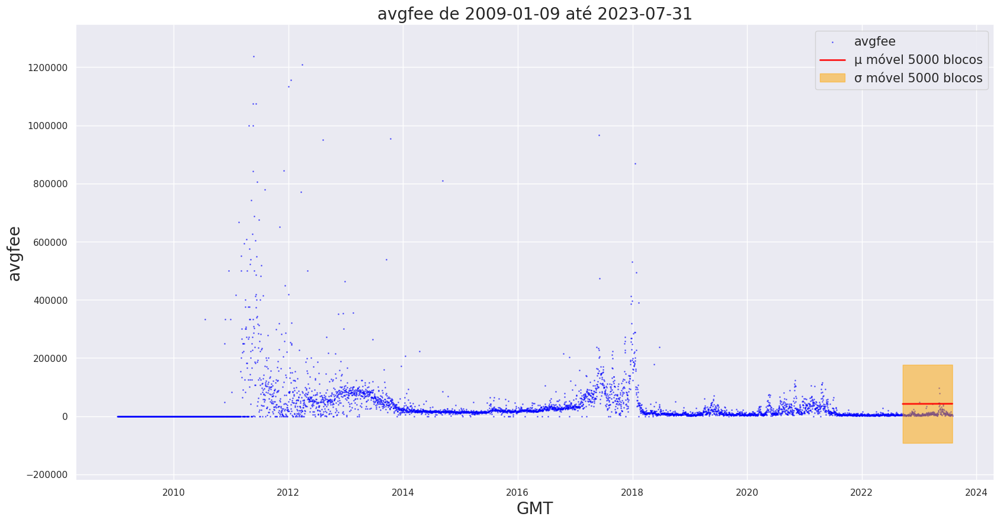

(numeric) Average feerate (in satoshis per virtual byte)


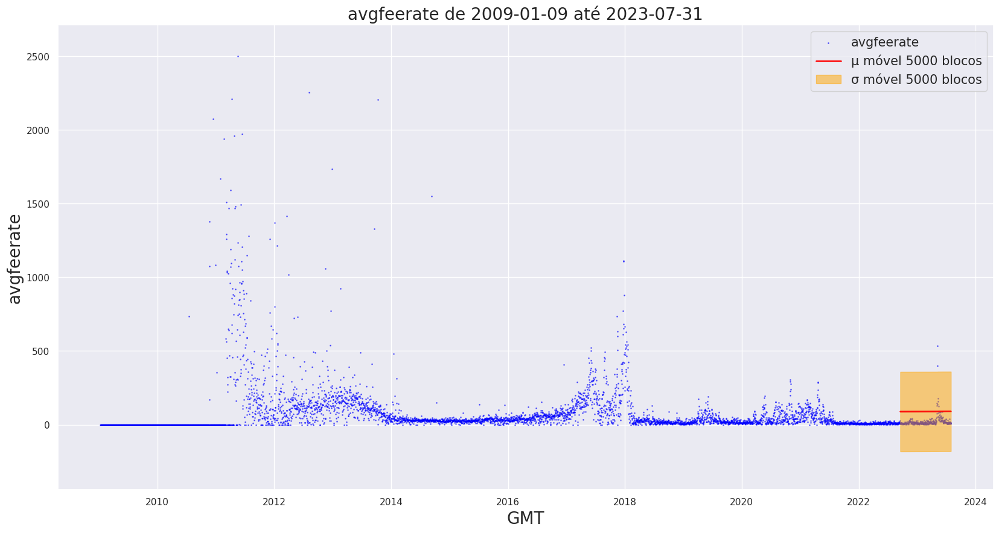

 (numeric) Average transaction size


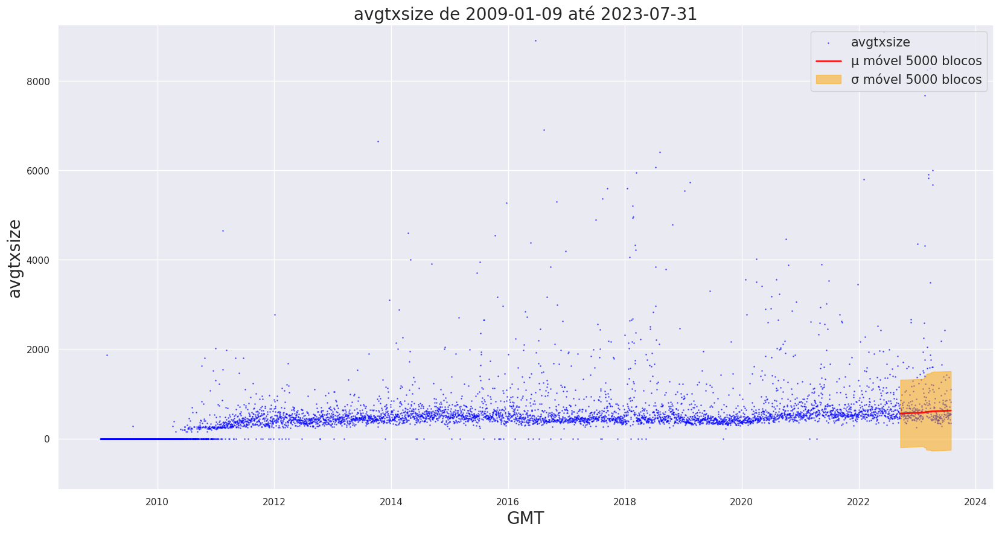

blockhash is a categorical variable
feerate_percentiles is a categorical variable
(numeric) The height of the block


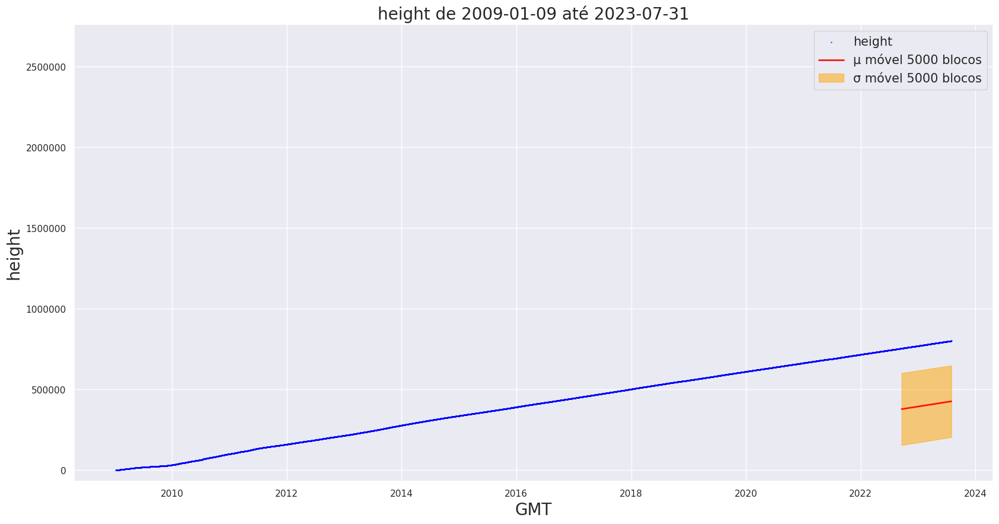

 (numeric) The number of inputs (excluding coinbase)


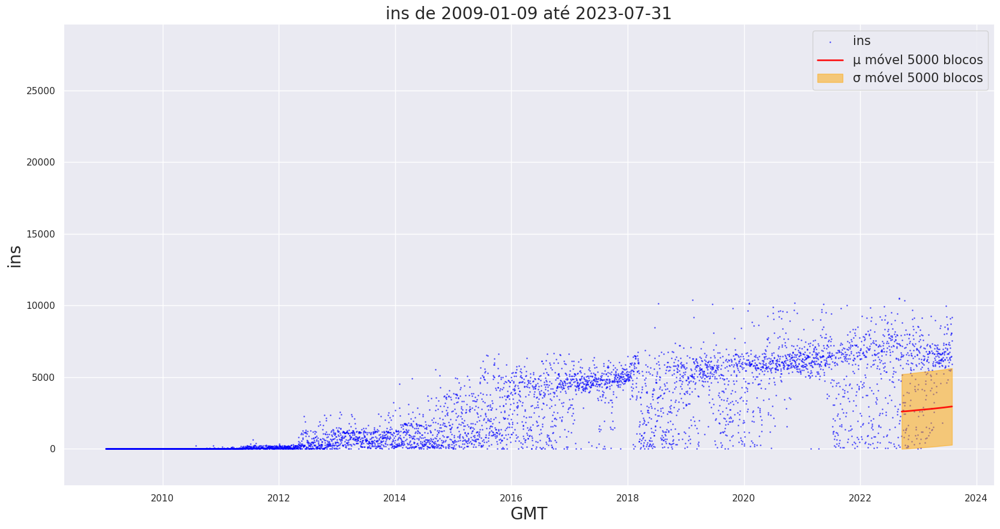

(numeric) Maximum fee in the block


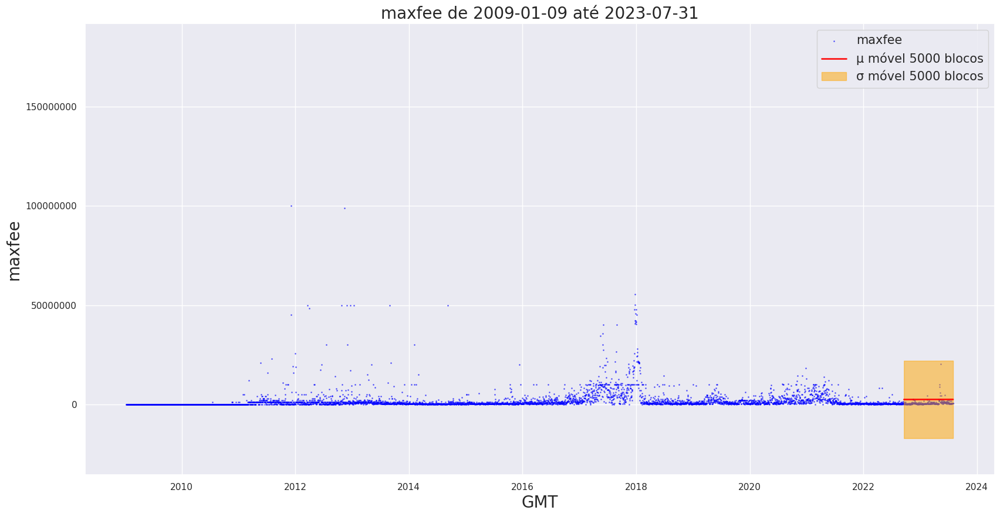

(numeric) Maximum feerate (in satoshis per virtual byte)


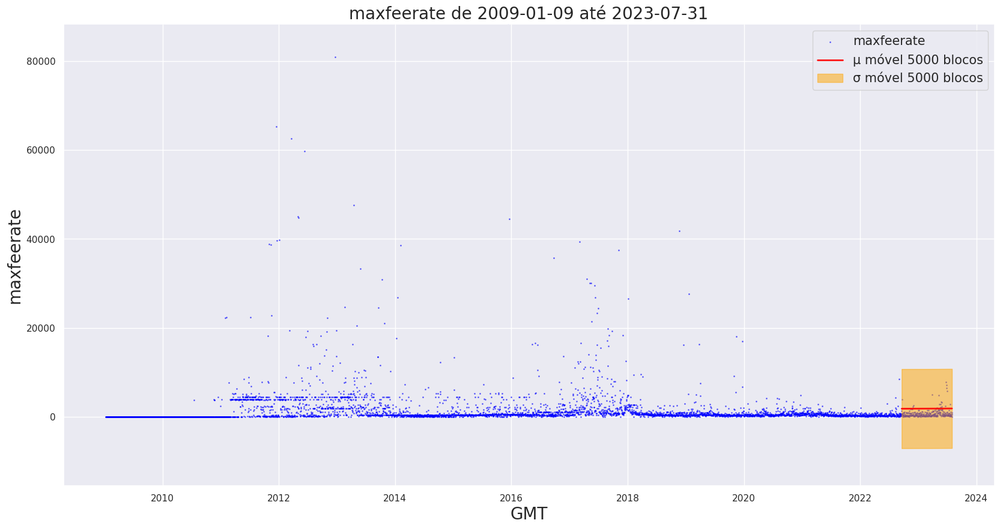

 (numeric) Maximum transaction size


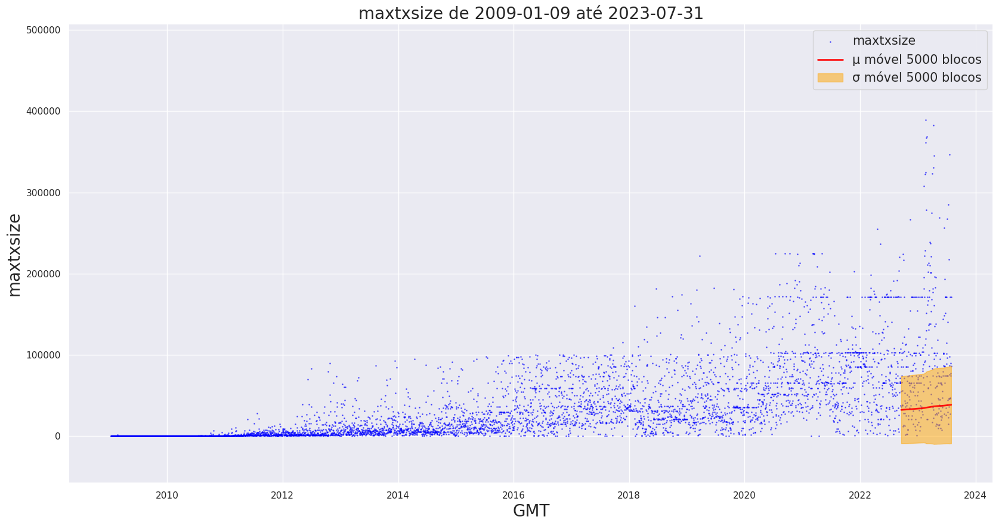

 (numeric) Truncated median fee in the block


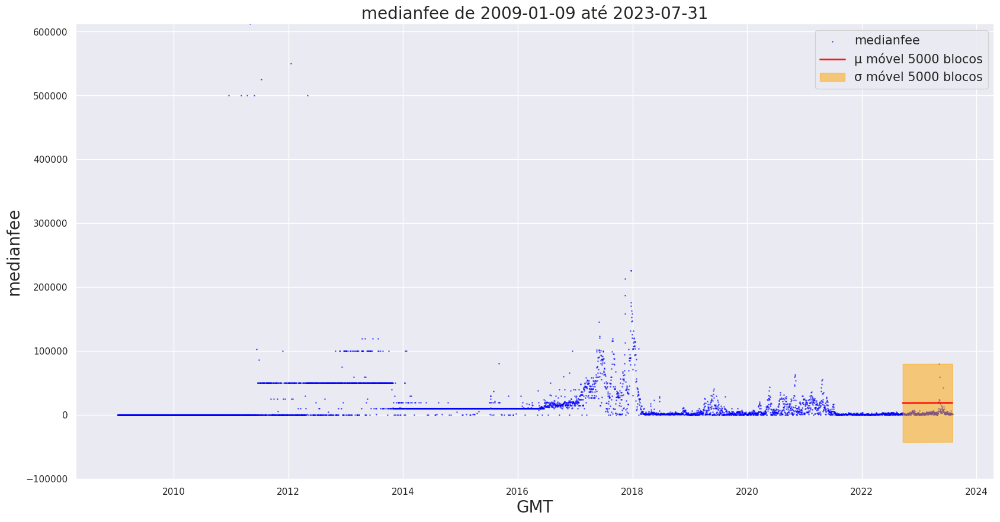

(numeric) The block median time past


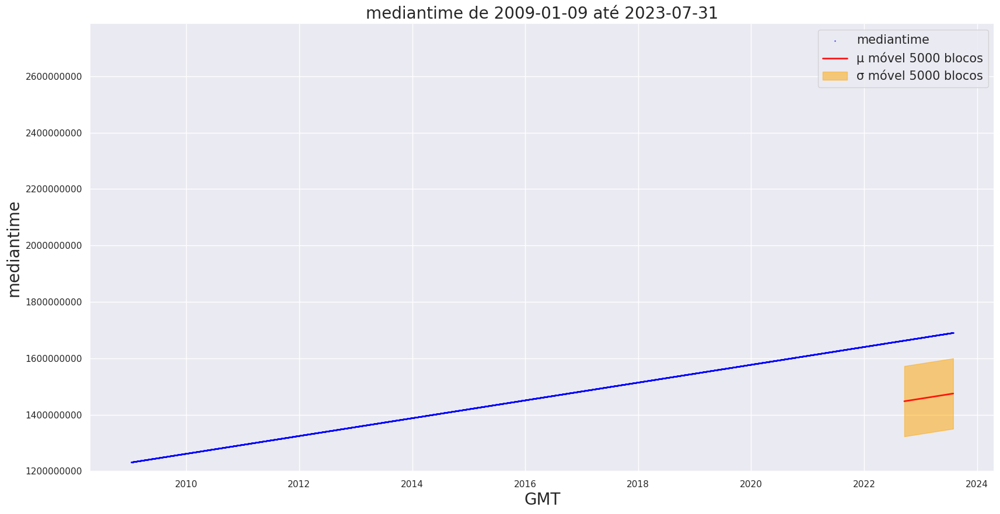

(numeric) Truncated median transaction size


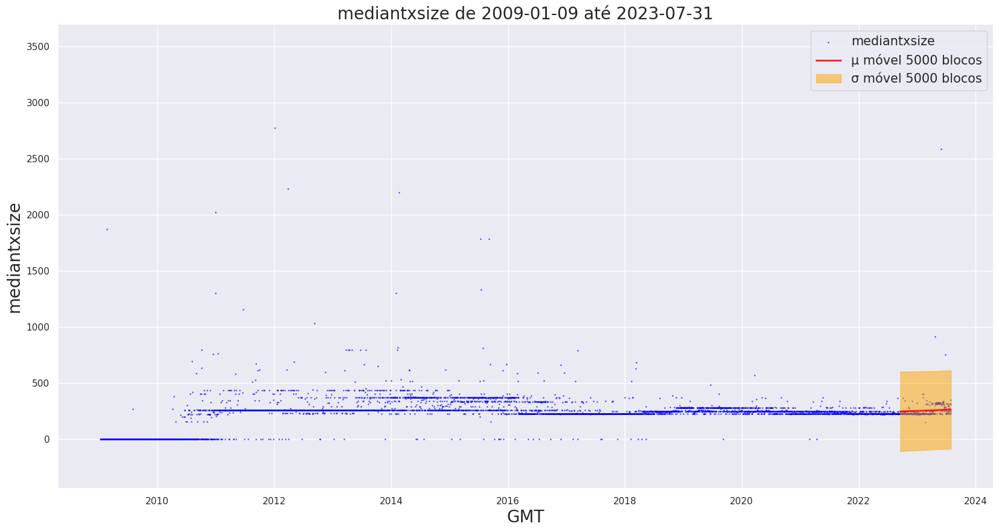

(numeric) Minimum fee in the block


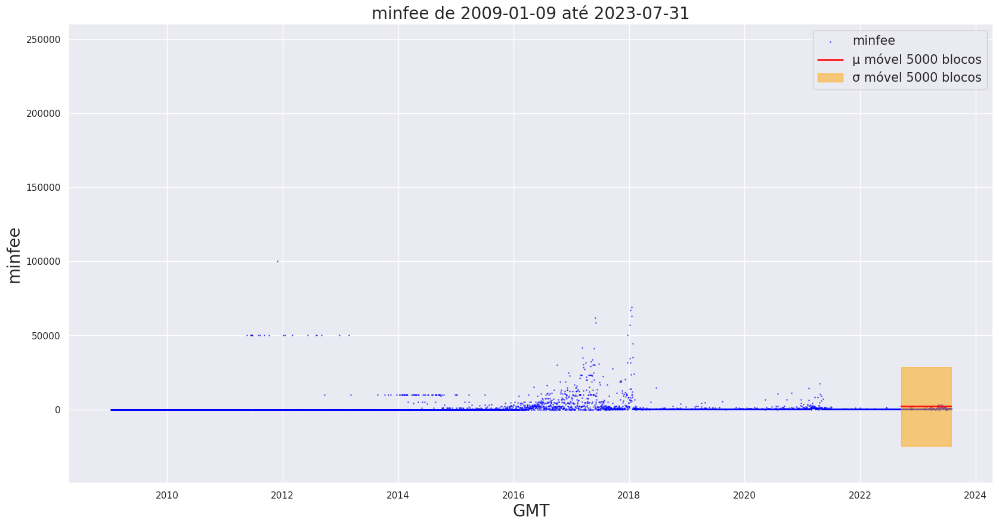

(numeric) Minimum feerate (in satoshis per virtual byte)


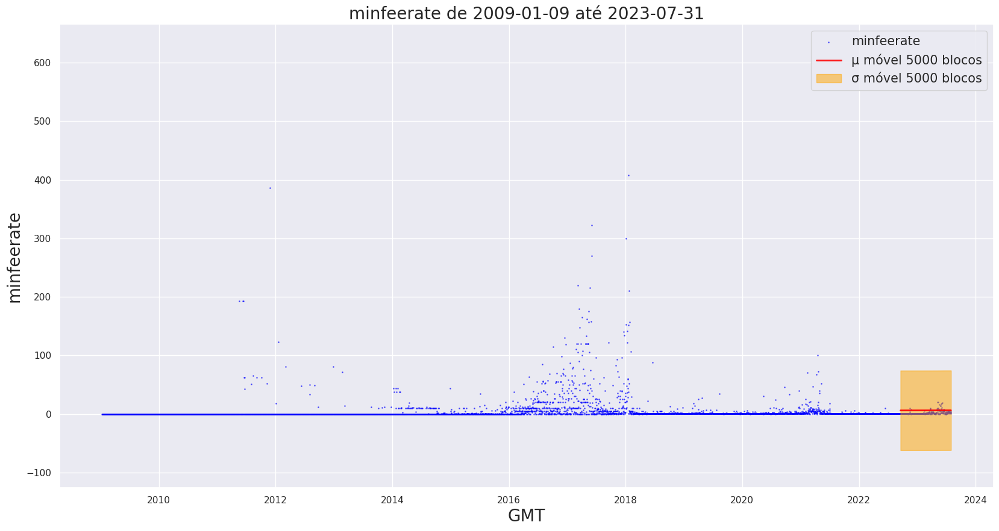

 (numeric) Minimum transaction size


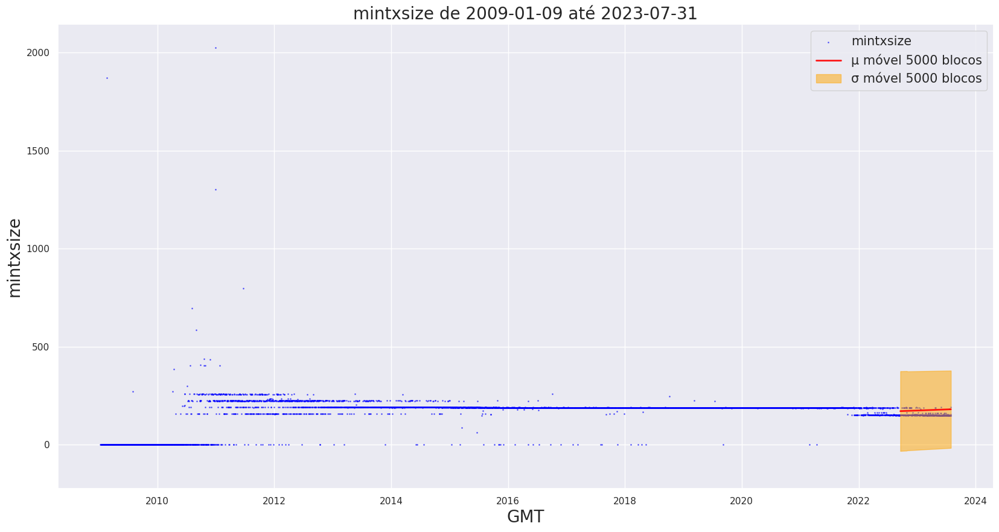

(numeric) The number of outputs


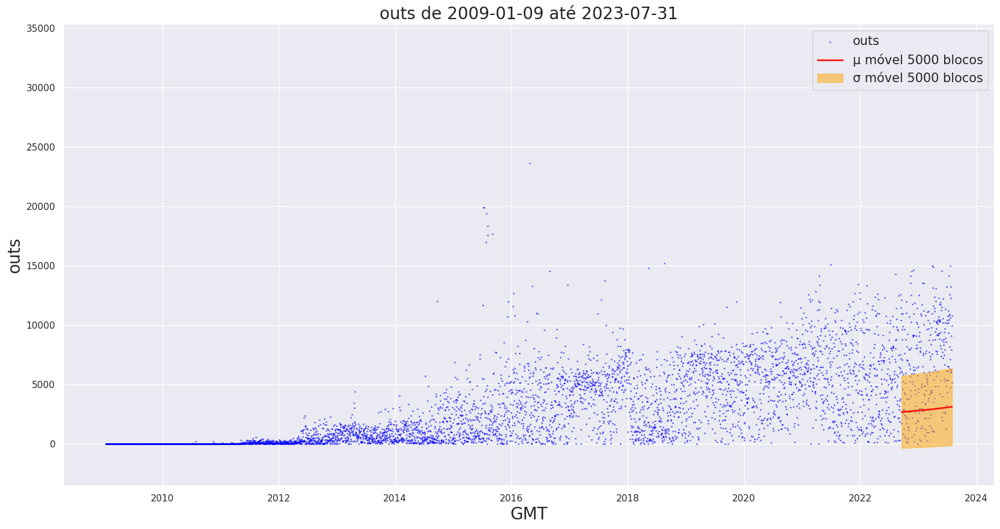

 (numeric) The block subsidy


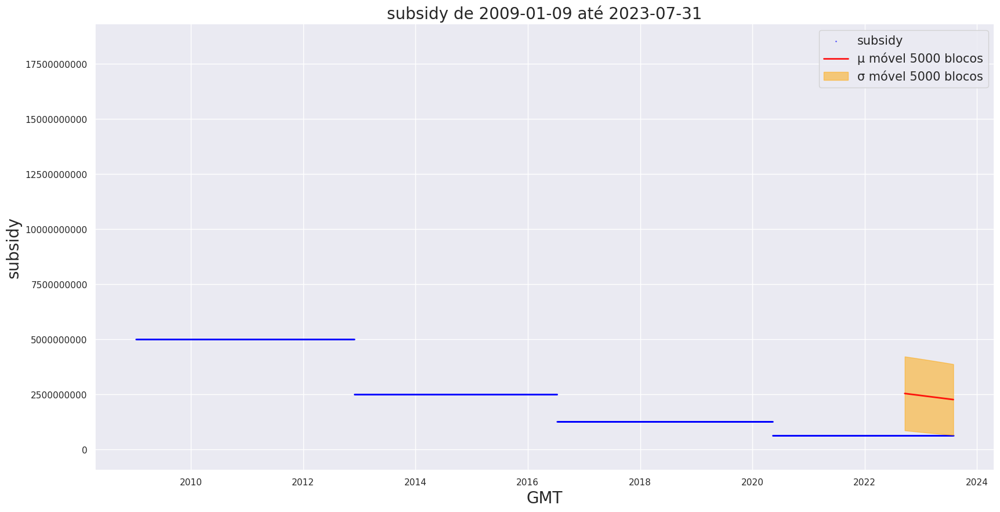

(numeric) Total size of all segwit transactions


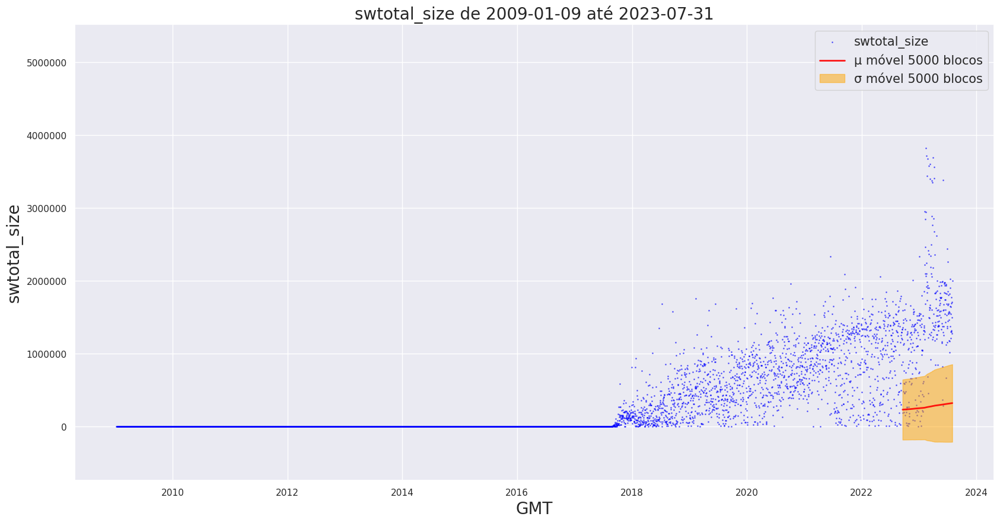

(numeric) Total weight of all segwit transactions


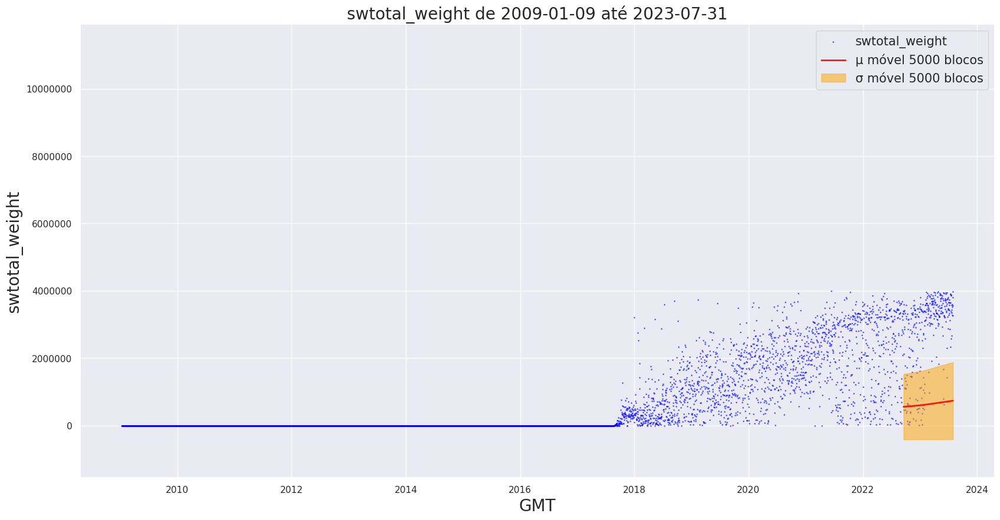

 (numeric) The number of segwit transactions


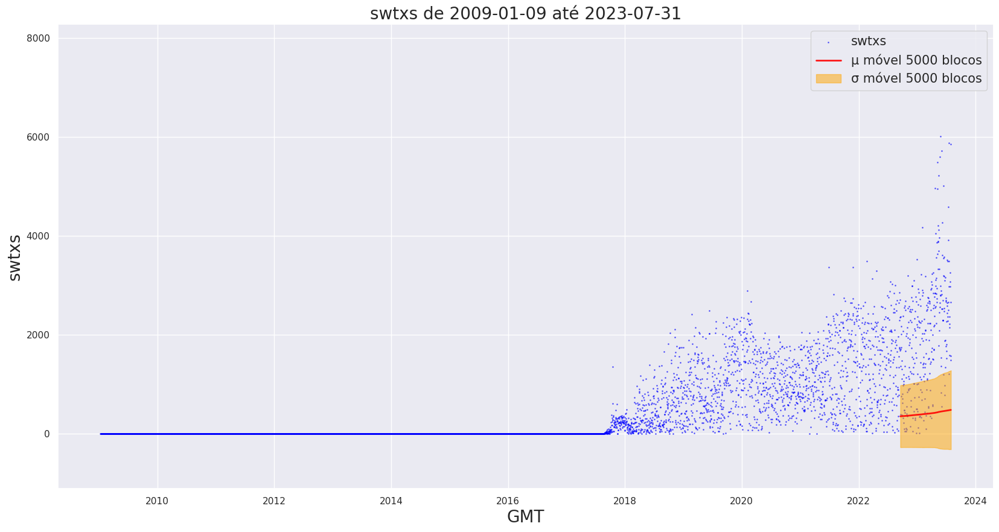

(numeric) The block time


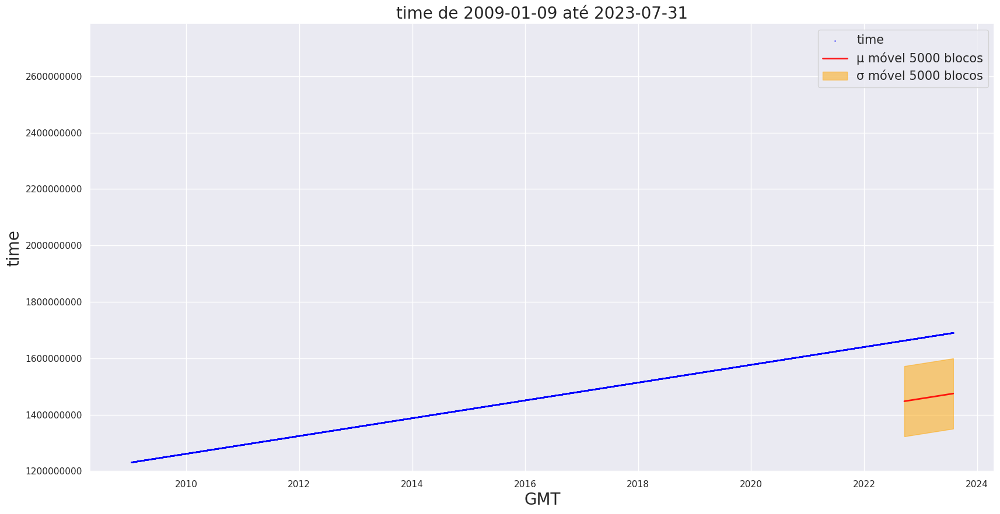

 (numeric) Total amount in all outputs (excluding coinbase and thus reward [ie subsidy + totalfee])


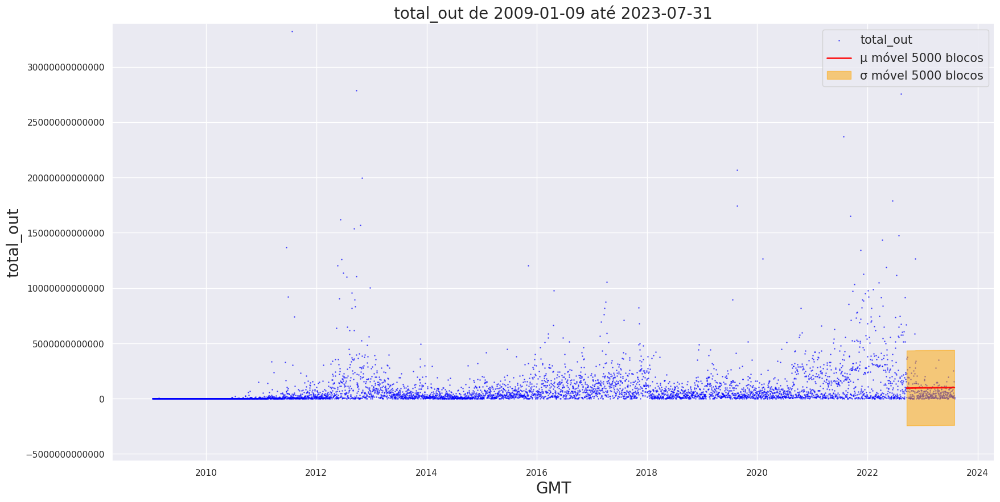

(numeric) Total size of all non-coinbase transactions


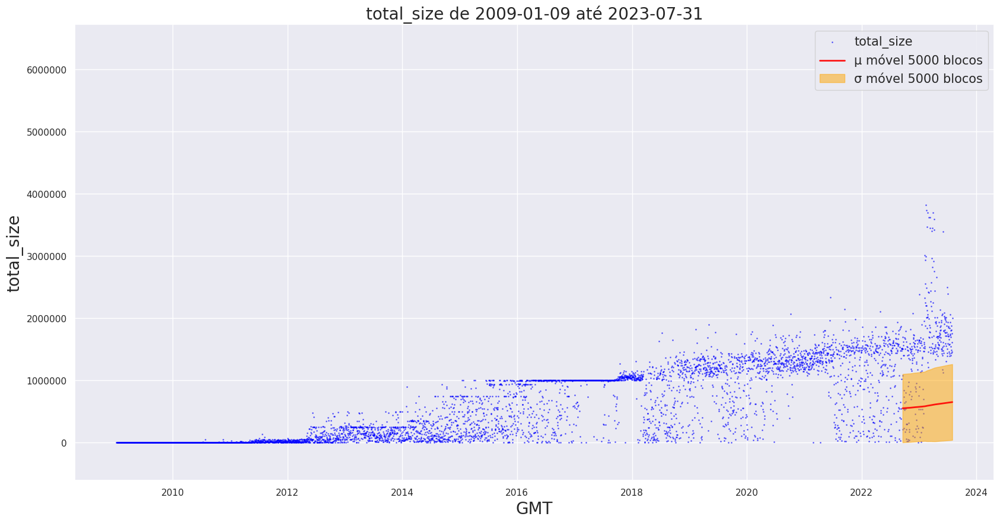

(numeric) Total weight of all non-coinbase transactions


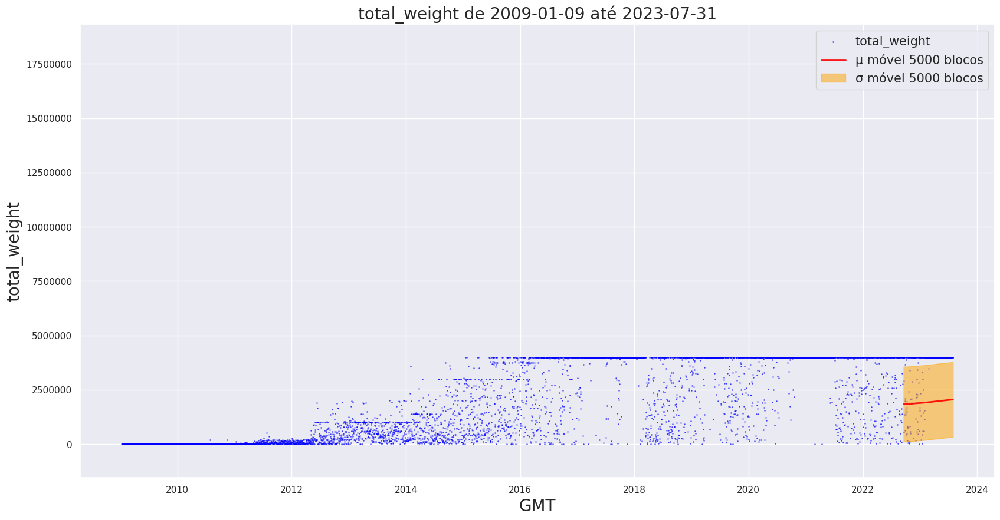

(numeric) The fee total


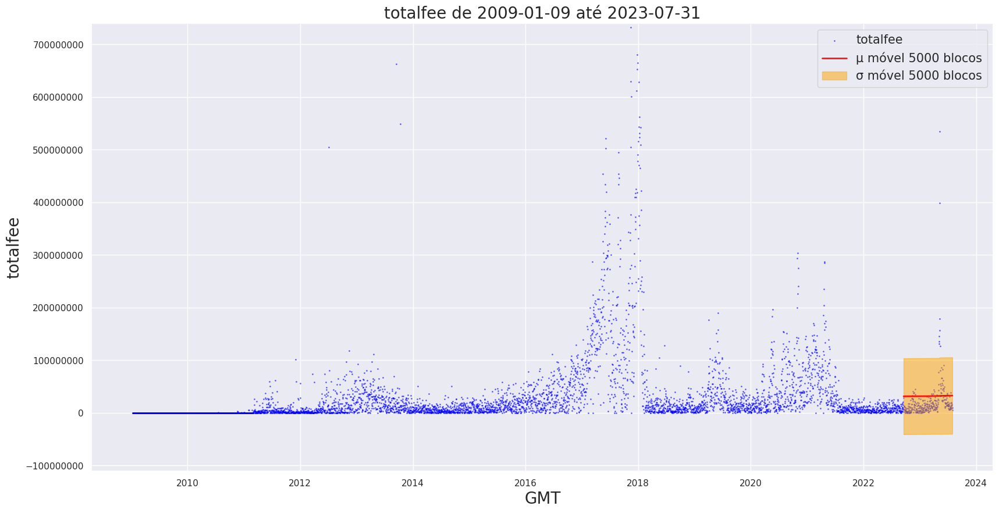

 (numeric) The number of transactions (including coinbase)


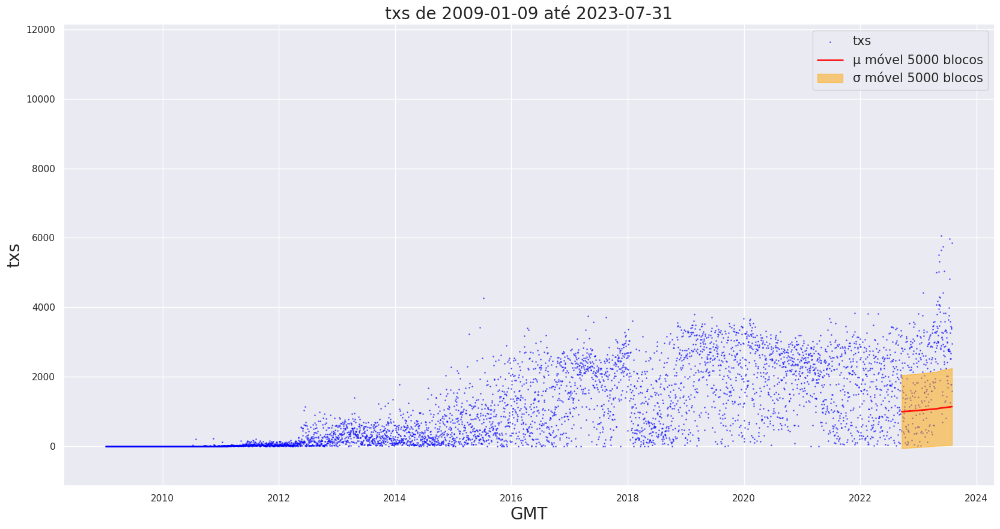

 (numeric) The increase/decrease in the number of unspent outputs


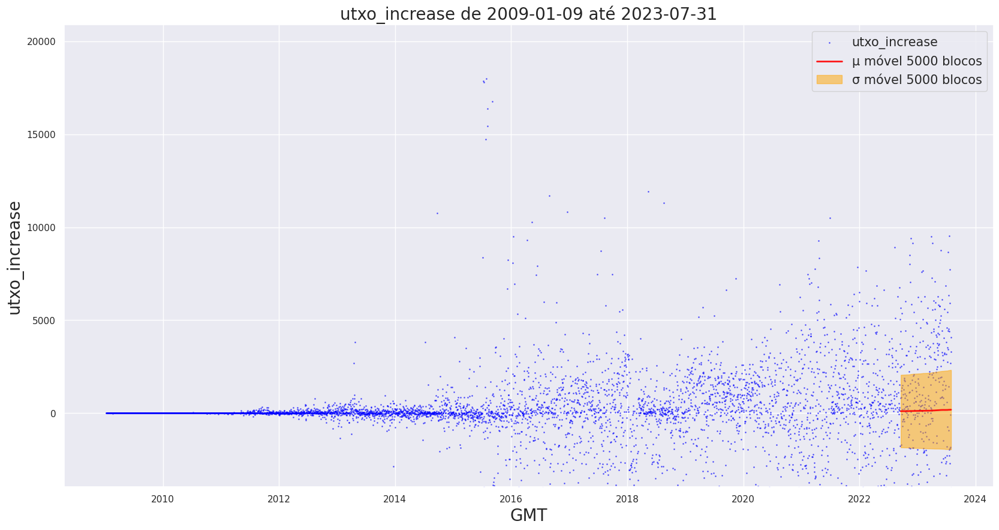

(numeric) The increase/decrease in size for the utxo index (not discounting op_return and similar)


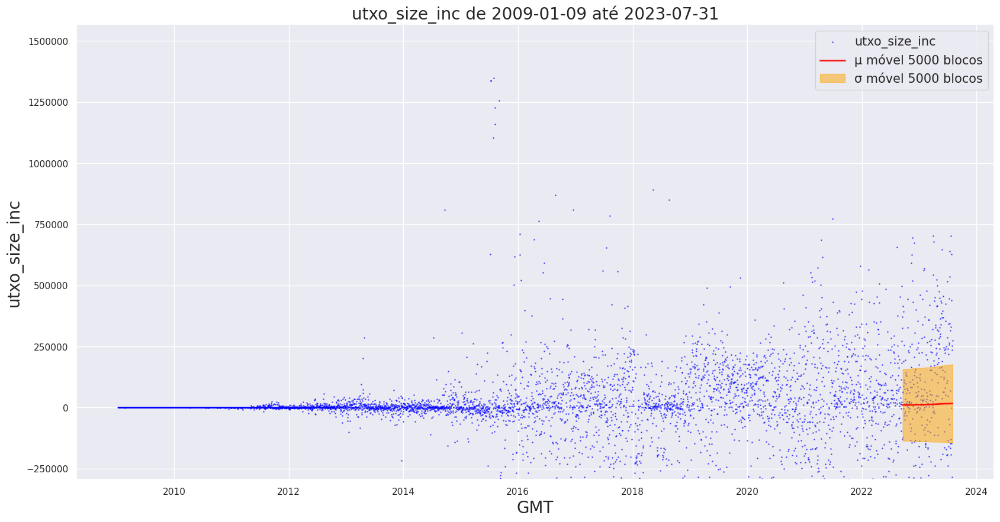

utxo_increase_actual


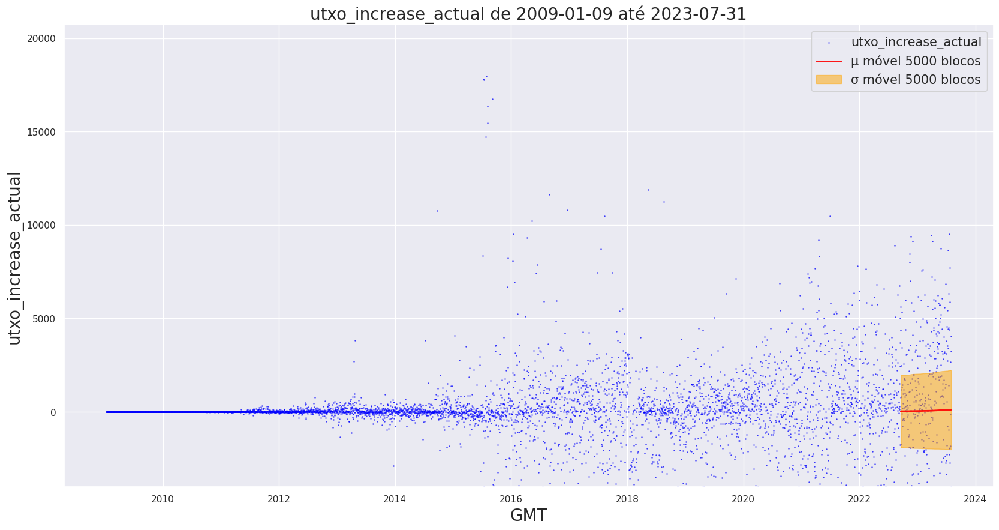

utxo_size_inc_actual


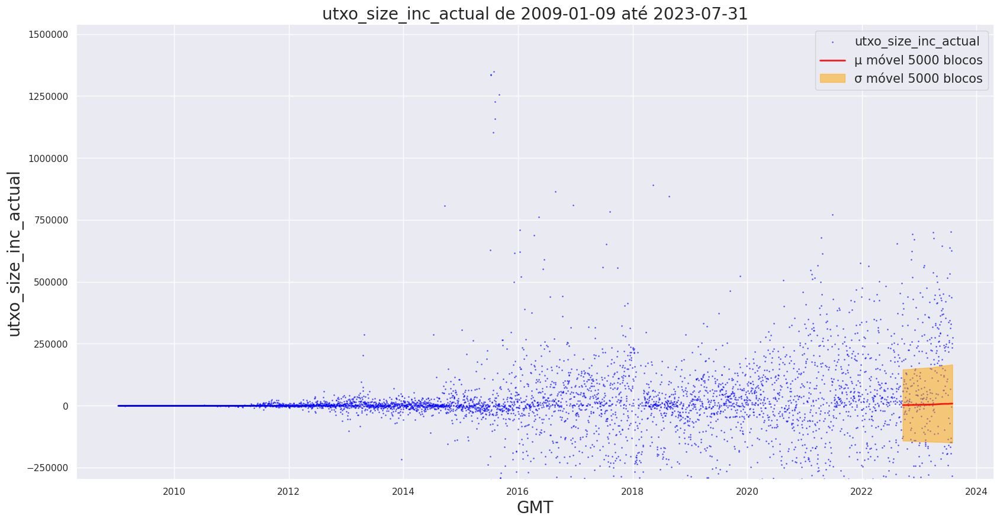

blockhash_decimal is a categorical variable
GMT is a categorical variable
year


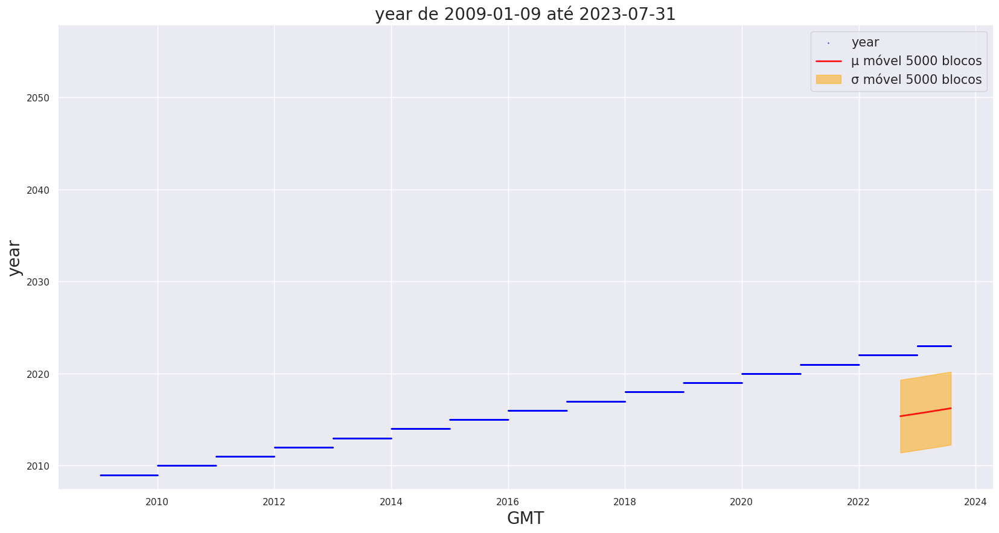

avgfee_btc


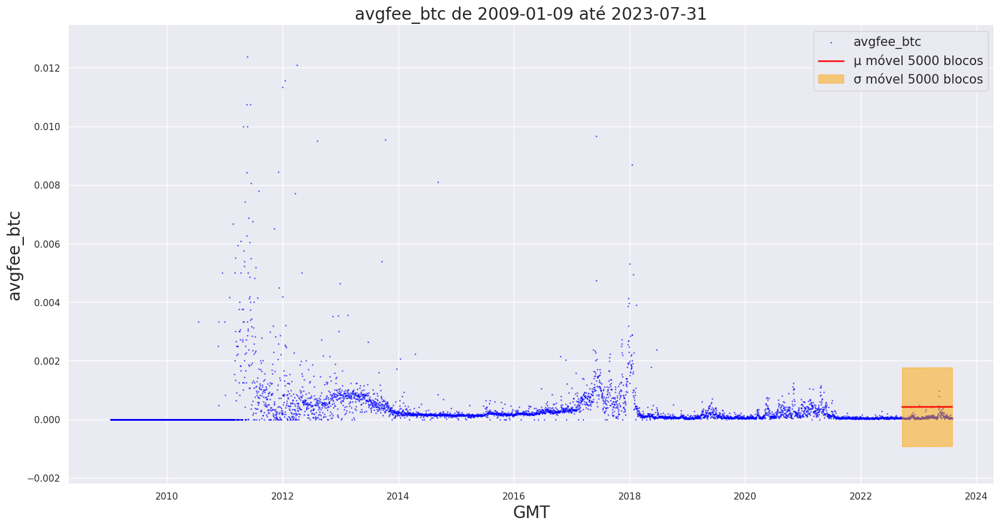

subsidy_btc


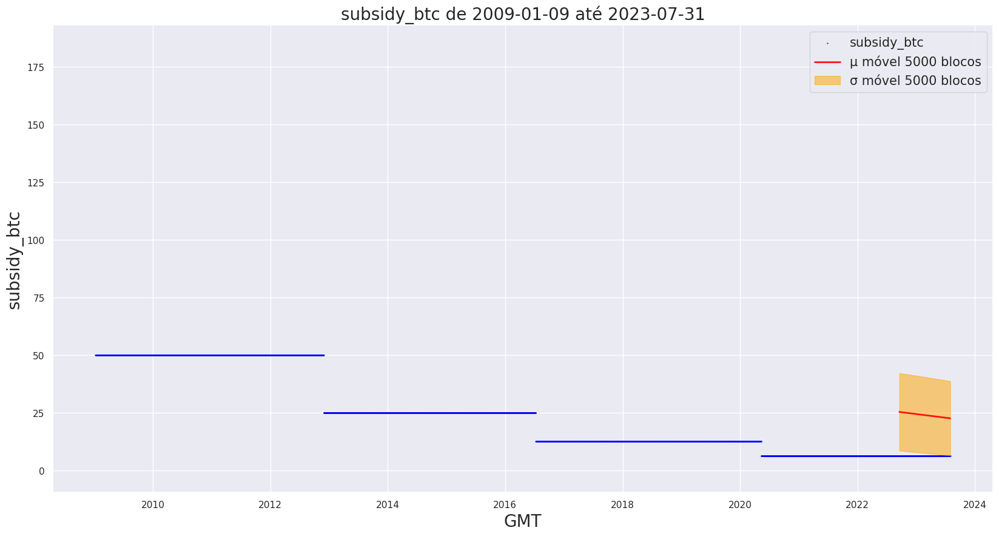

In [49]:
for i,col in enumerate(df_blockstats.columns):
    # find the data type of each column
    if df_blockstats[col].dtype == "object" :
        print(f"{col} is a categorical variable")
    elif col not in ["GMT", "index"]:
        # tenta printar a descrição de cada coluna
        try:
            print(f"{desc[col]}")
        except:
            print(f"{col}")
        cria_scatterplot(data=df_blockstats, titulo=f"{col}", x="GMT", y=col, precisao=0)


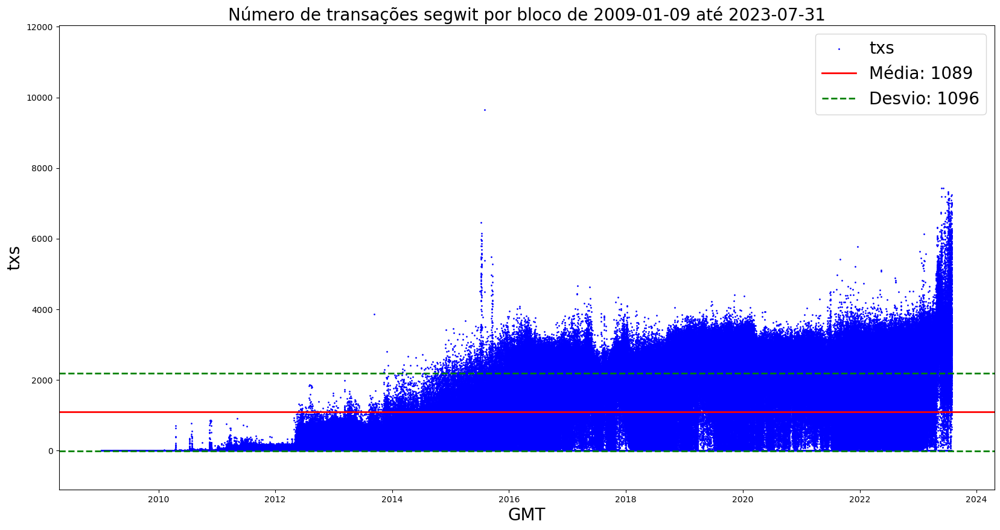

In [24]:
#The number of transactions (including coinbase)
cria_scatterplot(data=df_blockstats, titulo="Número de transações segwit por bloco", x="GMT", y="txs", precisao=0)

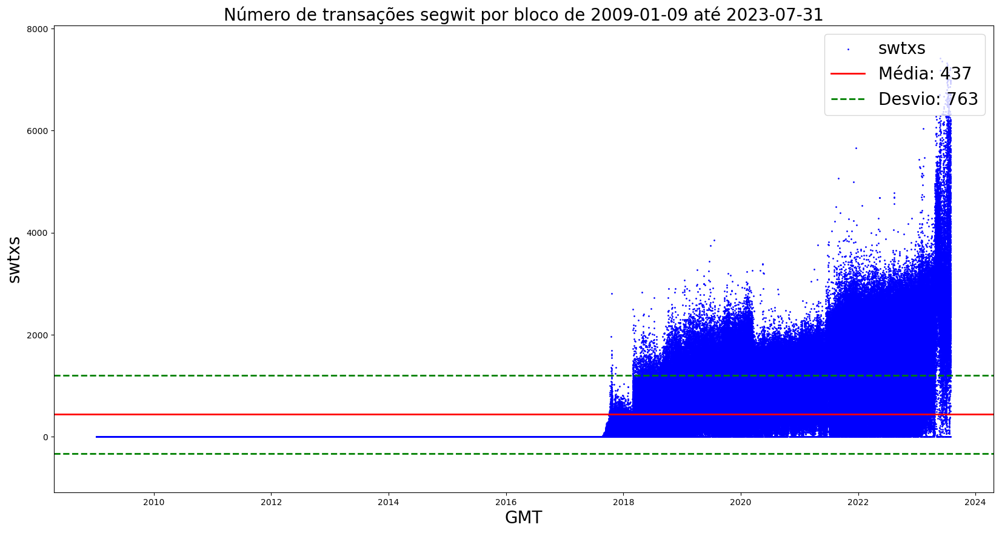

In [25]:
#The number of segwit transactions
cria_scatterplot(data=df_blockstats, titulo="Número de transações segwit por bloco", x="GMT", y="swtxs", precisao=0)
# Por que existem esses saltos?

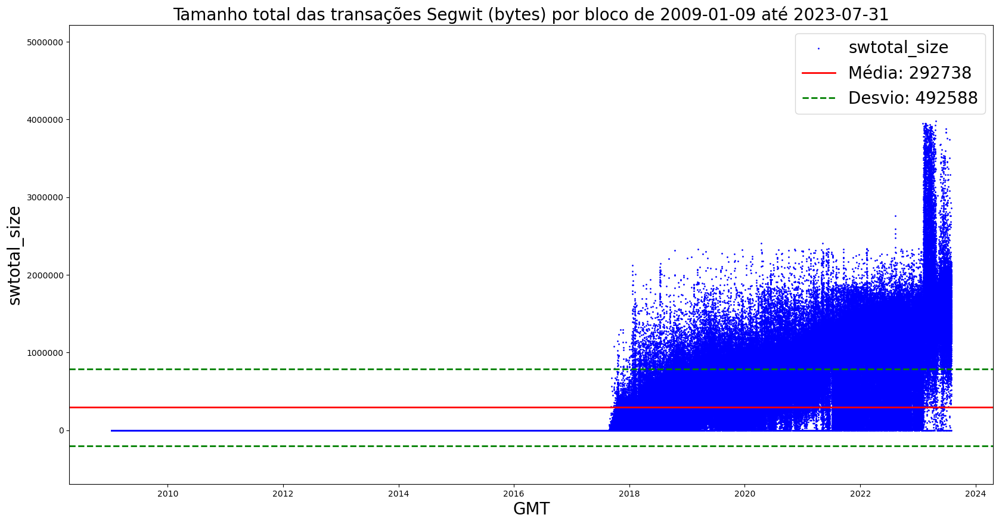

In [18]:
# Total size of all segwit transactions (bytes) per block
cria_scatterplot(data=df_blockstats, titulo="Tamanho total das transações Segwit (bytes) por bloco", x="GMT", y="swtotal_size", precisao=0)
#  O que aconteceu em 2023? Por que aumentou tanto?

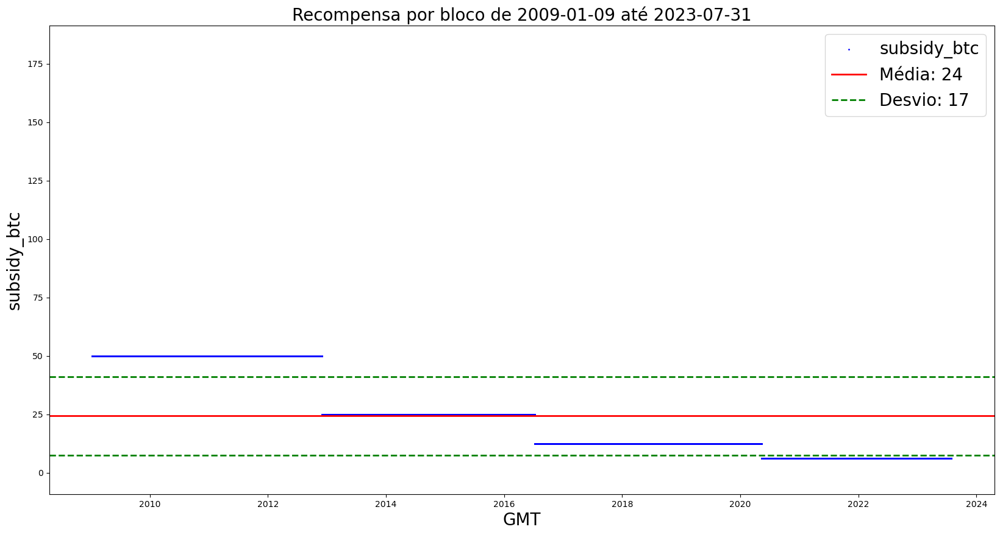

In [16]:
cria_scatterplot(data=df_blockstats, titulo="Recompensa por bloco", x="GMT", y="subsidy_btc", precisao=0)

/tmp/ipykernel_5774/1877653775.py:27: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(media - 2*desvio, media + 10*desvio)


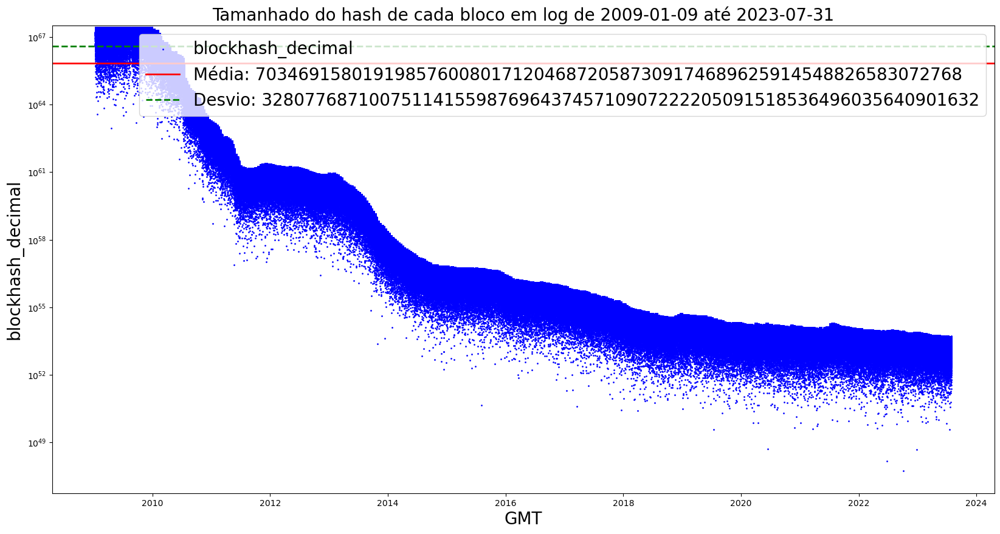

In [116]:
cria_scatterplot(data=df_blockstats, titulo="Tamanhado do hash de cada bloco em log", x="GMT", y="blockhash_decimal", precisao=0, log = True)

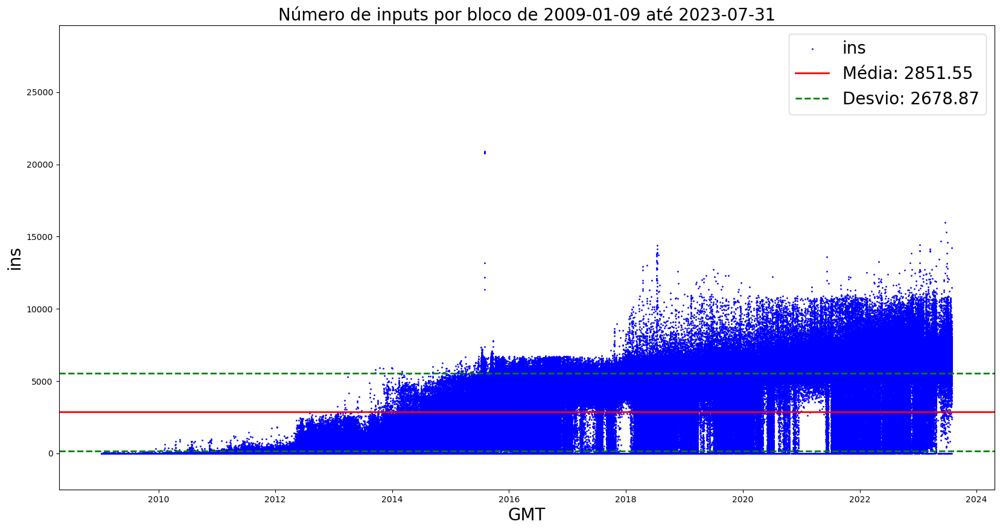

In [151]:
cria_scatterplot(data=df_blockstats, titulo="Número de inputs por bloco", x="GMT", y="ins", precisao=2)
# Em 2015 se chega a um limite mas volta a crescer no final de 2016 pela segwit
# Segregated Witness upgrade activated at block 477,120 (21 July 2017)
# não apresenta um padrão claro, apenas alguns picos;

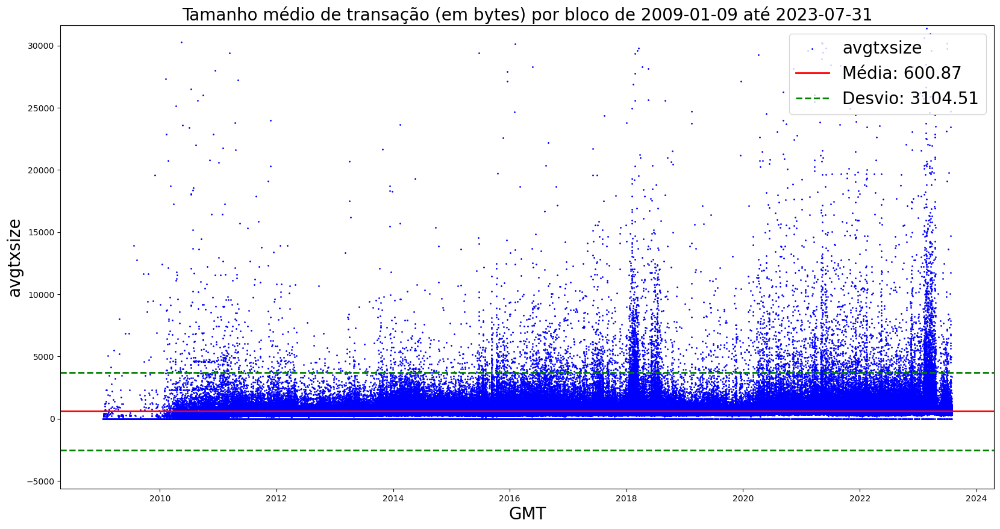

In [150]:
cria_scatterplot(data=df_blockstats, titulo="Tamanho médio de transação (em bytes) por bloco", x="GMT", y="avgtxsize", precisao=2)
# avgtxsize está em bytes;
# não apresenta um padrão claro, apenas alguns picos;

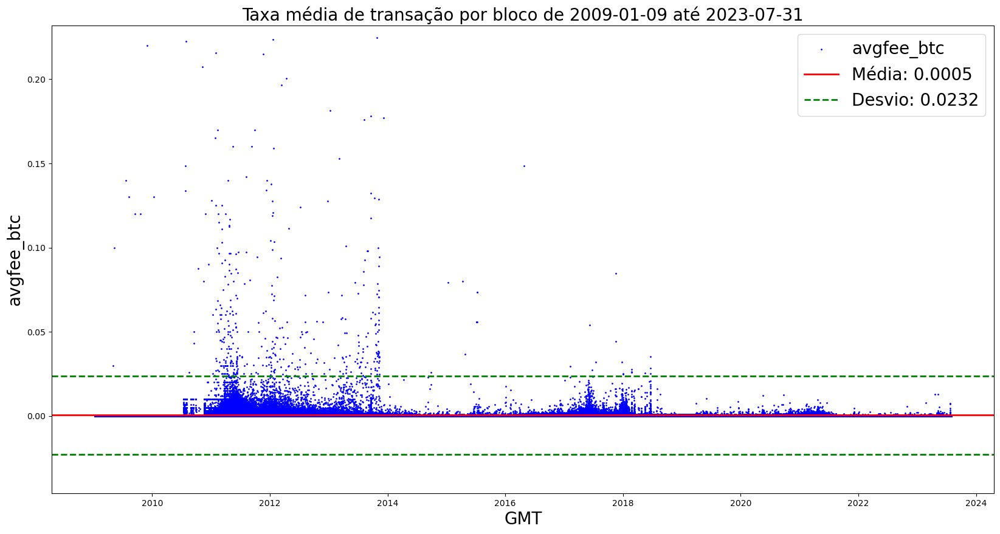

In [142]:
cria_scatterplot(data=df_blockstats, titulo="Taxa média de transação por bloco", x="GMT", y="avgfee_btc")
# Por que do pico em 2012?

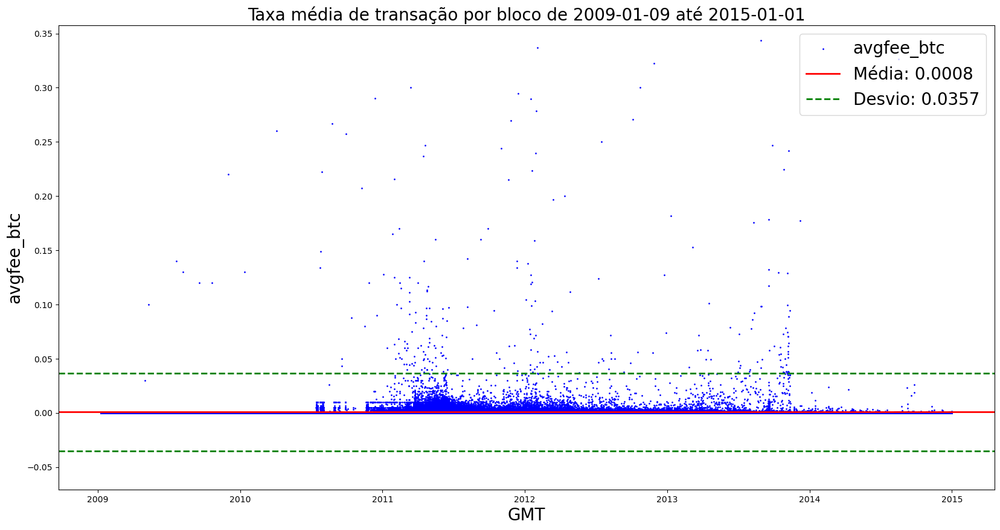

In [136]:
cria_scatterplot(data=df_blockstats, titulo="Taxa média de transação por bloco", x="GMT", y="avgfee_btc", data_fim="2015-01-01")

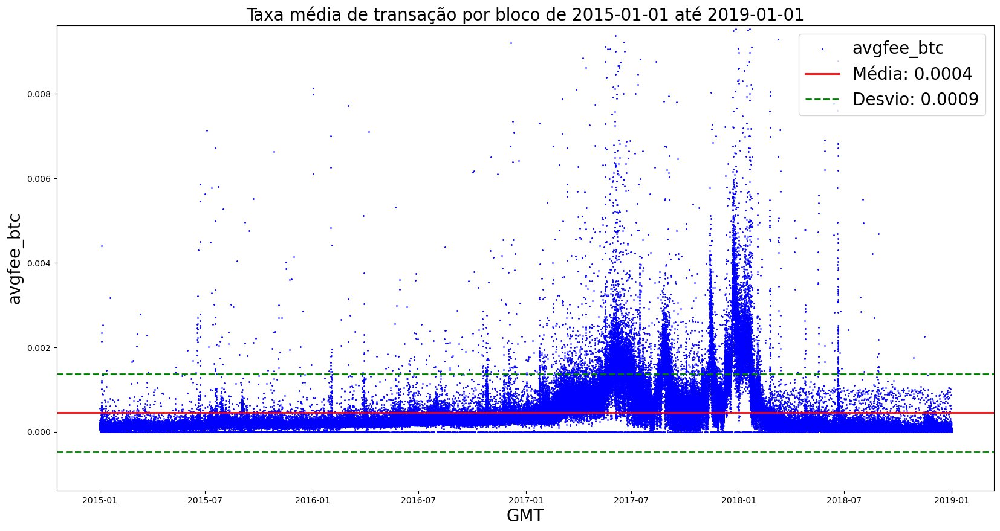

In [137]:
cria_scatterplot(data=df_blockstats, titulo="Taxa média de transação por bloco", x="GMT", y="avgfee_btc",data_inicio="2015-01-01" ,data_fim="2019-01-01")

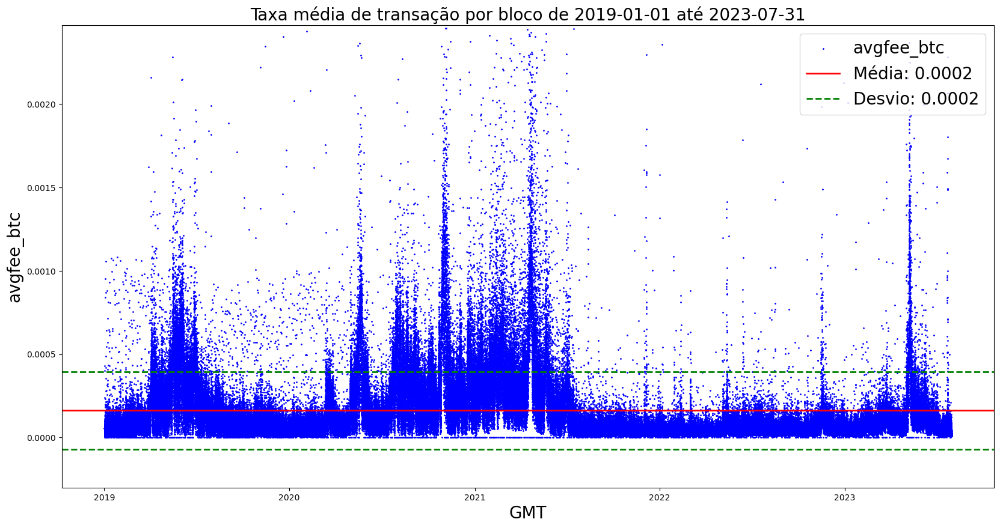

In [134]:
cria_scatterplot(data=df_blockstats, titulo="Taxa média de transação por bloco", x="GMT", y="avgfee_btc",data_inicio="2019-01-01" )

# por que existem esses picos?

In [118]:
df_blockstats.describe()

,index,avgfee,avgfeerate,avgtxsize,height,ins,maxfee,maxfeerate,maxtxsize,medianfee,...,totalfee,txs,utxo_increase,utxo_size_inc,utxo_increase_actual,utxo_size_inc_actual,GMT,year,avgfee_btc,subsidy_btc
count,800199.000000,8.001990e+05,8.001990e+05,800199.000000,800199.000000,800199.000000,8.001990e+05,8.001990e+05,8.001990e+05,8.001990e+05,...,8.001990e+05,800199.000000,800199.000000,8.001990e+05,800199.000000,8.001990e+05,800199,800199.000000,800199.000000,800199.000000
mean,499.000000,5.027758e+04,9.371248e+01,600.871384,400500.000000,2851.598864,2.498182e+06,2.173458e+03,3.608893e+04,2.154312e+04,...,3.357147e+07,1089.029406,207.629922,1.759483e+04,141.965392,1.074371e+04,2016-04-10 12:44:22.636586496,2015.785298,0.000503,24.274345
min,0.000000,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,1.000000,-20297.000000,-1.307644e+06,-20298.000000,-1.307732e+06,2009-01-09 02:54:25,2009.000000,0.000000,6.250000
25%,249.000000,4.767000e+03,1.000000e+01,381.000000,200250.500000,150.000000,1.270060e+05,2.240000e+02,2.781000e+03,6.750000e+02,...,1.902500e+06,66.000000,-122.000000,-8.361000e+03,-165.000000,-1.230000e+04,2012-09-24 03:17:11,2012.000000,0.000048,12.500000
50%,499.000000,1.584200e+04,2.900000e+01,480.000000,400500.000000,1996.000000,5.739860e+05,4.740000e+02,2.062600e+04,7.125000e+03,...,1.040741e+07,659.000000,3.000000,3.420000e+02,2.000000,1.590000e+02,2016-02-29 04:54:06,2016.000000,0.000158,25.000000
75%,749.000000,3.981400e+04,8.300000e+01,617.000000,600749.500000,5348.000000,1.734425e+06,1.327000e+03,5.646550e+04,1.685350e+04,...,3.158171e+07,2068.000000,524.000000,4.226700e+04,413.000000,3.080550e+04,2019-10-23 19:11:39,2019.000000,0.000398,50.000000
max,998.000000,1.718357e+09,1.143052e+06,999657.000000,800999.000000,20894.000000,2.912409e+10,4.933333e+07,3.969494e+06,1.550000e+08,...,2.915328e+10,12239.000000,22256.000000,1.701963e+06,22239.000000,1.701782e+06,2023-07-31 02:29:28,2023.000000,17.183569,50.000000
std,288.386495,2.315144e+06,1.890663e+03,3104.489681,231228.926932,2678.892880,5.839463e+07,8.556312e+04,4.539284e+04,3.474548e+05,...,9.202350e+07,1095.651456,2008.736532,1.500027e+05,1996.421657,1.483468e+05,NaN,4.120364,0.023151,16.713723


In [37]:
#reduzir o dataframe
sampled_df = df_blockstats.sample(frac=0.005, random_state=42)

In [10]:
sampled_df.columns

Index(['index', 'avgfee', 'avgfeerate', 'avgtxsize', 'blockhash',
       'feerate_percentiles', 'height', 'ins', 'maxfee', 'maxfeerate',
       'maxtxsize', 'medianfee', 'mediantime', 'mediantxsize', 'minfee',
       'minfeerate', 'mintxsize', 'outs', 'subsidy', 'swtotal_size',
       'swtotal_weight', 'swtxs', 'time', 'total_out', 'total_size',
       'total_weight', 'totalfee', 'txs', 'utxo_increase', 'utxo_size_inc',
       'utxo_increase_actual', 'utxo_size_inc_actual'],
      dtype='object')

In [7]:
sampled_df.dtype

AttributeError: 'DataFrame' object has no attribute 'dtype'

In [15]:
# the code below loop throw columns, if it is not a bumber then exclud it 
# and if it is a number then print the column name and the number of unique values in it
delet_colunms = []
for col in sampled_df.columns:
    print(col, sampled_df[col].dtype)
    if sampled_df[col].dtype == 'object':
        print(col, sampled_df[col].dtype)
        delet_colunms.append(col)

index int64
avgfee int64
avgfeerate int64
avgtxsize int64
blockhash object
blockhash object
feerate_percentiles object
feerate_percentiles object
height int64
ins int64
maxfee int64
maxfeerate int64
maxtxsize int64
medianfee int64
mediantime int64
mediantxsize int64
minfee int64
minfeerate int64
mintxsize int64
outs int64
subsidy int64
swtotal_size int64
swtotal_weight int64
swtxs int64
time int64
total_out int64
total_size int64
total_weight int64
totalfee int64
txs int64
utxo_increase int64
utxo_size_inc int64
utxo_increase_actual int64
utxo_size_inc_actual int64


In [16]:
delet_colunms

['blockhash', 'feerate_percentiles']

In [39]:

sampled_df.drop(delet_colunms,axis=1,inplace=True)

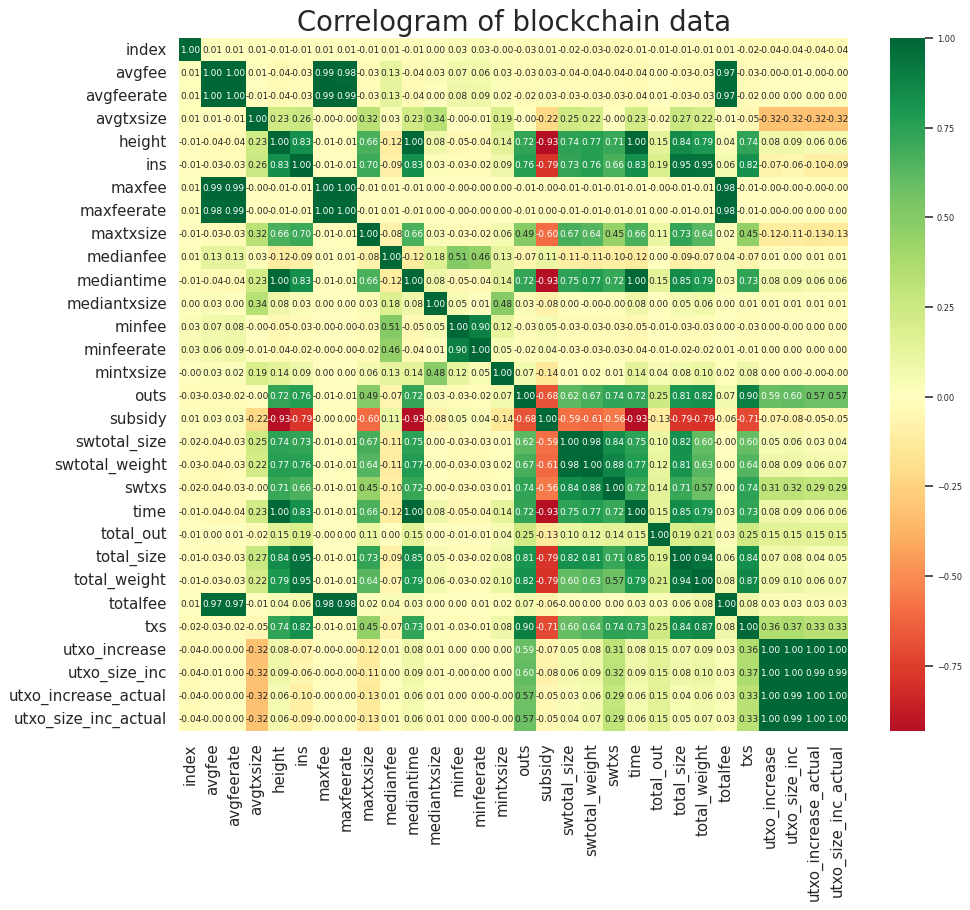

In [40]:
# lower the font of the numbers of correlation matrix
sns.set(font_scale=0.6)
plt.figure(figsize=(12,10), dpi= 90)
sns.heatmap(sampled_df.corr(), xticklabels=sampled_df.corr().columns, yticklabels=sampled_df.corr().columns, cmap='RdYlGn', center=0, annot=True, fmt=".2f")

# Decorations
plt.title('Correlogram of blockchain data', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

## Bitcoin price

https://buybitcoinworldwide.com/price/

https://bitcoinmagazine.com/guides/bitcoin-price-history

In [110]:
import yfinance as yf
# Pega os preços do BTC do yahoo finance
get = yf.Ticker("BTC-USD")

btc_price_data = yf.download("BTC-USD", start="2009-01-01")

# Concerta o cabeçalho
btc_price_data = btc_price_data.reset_index()

# Convert dates to Unix timestamps
btc_price_data["Date"] = pd.to_datetime(btc_price_data["Date"])
btc_price_data['numeric_date'] = (btc_price_data['Date'] - btc_price_data['Date'].min()).dt.days
btc_price_data["Date"] = btc_price_data["Date"].dt.date

[*********************100%***********************]  1 of 1 completed


In [160]:
btc_price_data.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100


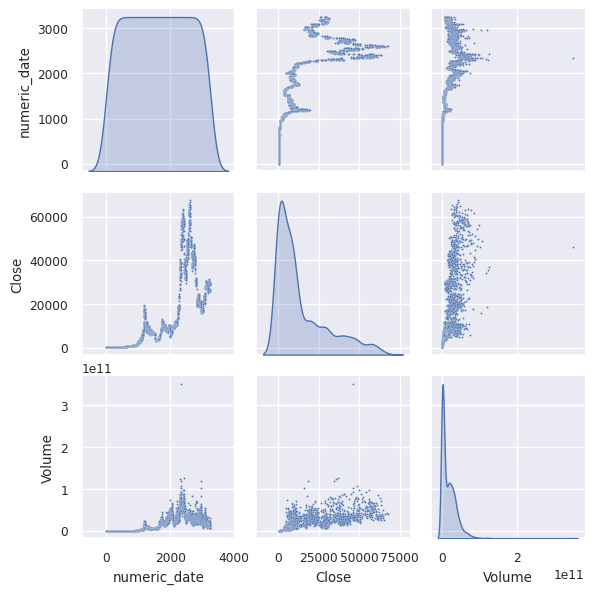

In [163]:
# Create a beatiful pairplot with btc_price_data[["UnixTimestamp", "Close", "Volume"]] with seaborn 
# plot pairplot with little dots (s=1) and alpha=0.5 and numerical values in the axis

sns.set(font_scale=0.8)
sns.pairplot(btc_price_data[["numeric_date", "Close", "Volume"]], diag_kind="kde", markers="o", height=2, aspect=1, plot_kws=dict(s=2, alpha=1))
plt.show()

I will not interpolate the data from news and stories about the bitcoin price since it is vague.

"Martti Malmi, known online as Sirius, sold 5,050 coins for $5.02, giving each Bitcoin a value of $0.0009 each."

It makes no sense to finde the correlation of one interpolated price to the rest of the data, it probably will mess with the real correlation that really exists from real price data from 2014;

In [ ]:
# Plots with the last blocks of the day
for i,col in enumerate(df_blockstats.columns):
    # find the data type of each column
    if df_blockstats[col].dtype == "object" :
        print(f"{col} is a categorical variable")
    elif col not in ["GMT", "index"]:
        # tenta printar a descrição de cada coluna
        try:
            print(f"{desc[col]}")
        except:
            print(f"{col}")
        cria_scatterplot(data=df_blockstats, titulo=f"{col}", x="GMT", y=col, precisao=0)


In [178]:
# get just one block per date from the dataframe df_blockstats (gets the last one of the day)
df_blockstats_daily_last_one = df_blockstats.copy()
df_blockstats_daily_last_one['GMT'] = pd.to_datetime(df_blockstats_daily_last_one['time'], unit='s')
df_blockstats_daily_last_one['GMT'] = df_blockstats_daily_last_one['GMT'].dt.date
df_blockstats_daily_last_one = df_blockstats_daily_last_one.drop_duplicates(subset=['GMT'], keep='last')
df_blockstats_daily_last_one = df_blockstats_daily_last_one.reset_index(drop=True)
df_blockstats_daily_last_one['GMT'] = pd.to_datetime(df_blockstats_daily_last_one['time'], unit='s')


# gets the average of the blocks of the day from the df_blockstats dataframe
# drop the columns feerate_percentiles and blockhash
df_blockstats_daily_mean = df_blockstats.copy()
df_blockstats_daily_mean = df_blockstats_daily_mean.drop(columns=["feerate_percentiles",'blockhash'])
df_blockstats_daily_mean['GMT'] = pd.to_datetime(df_blockstats_daily_mean['time'], unit='s')
df_blockstats_daily_mean['GMT'] = df_blockstats_daily_mean['GMT'].dt.date
df_blockstats_daily_mean = df_blockstats_daily_mean.groupby('GMT').mean()
df_blockstats_daily_mean = df_blockstats_daily_mean.reset_index()
df_blockstats_daily_mean['GMT'] = pd.to_datetime(df_blockstats_daily_mean['time'], unit='s')

In [180]:
def insert_price_btc_in_df_blockstats_daily(df_blockstats_daily, btc_price_data): 
    df_blockstats_daily["GMT"] = pd.to_datetime(df_blockstats_daily["GMT"], unit="s")
    df_blockstats_daily["GMT"] =df_blockstats_daily["GMT"].dt.date 

    btc_price_data['Date'] = pd.to_datetime(btc_price_data['Date'])
    btc_price_data['Date'] = btc_price_data['Date'].dt.date

    # merge the btc_price_data["Close"] with the date to the df_blockstats_daily dataframe on the column GMT
    df_blockstats_daily = df_blockstats_daily.merge(btc_price_data[["numeric_date", "Close", "Date"]], left_on="GMT", right_on="Date", how="left")
    
    df_blockstats_daily["avgfee_USD"] = df_blockstats_daily["avgfee_btc"] * df_blockstats_daily["Close"]
    

    df_blockstats_daily["maxfee_USD"] = df_blockstats_daily["maxfee_btc"] * df_blockstats_daily["Close"]

    df_blockstats_daily["minfee_USD"] = df_blockstats_daily["minfee_btc"] * df_blockstats_daily["Close"]

    df_blockstats_daily["GMT"] = pd.to_datetime(df_blockstats_daily["GMT"])
    return df_blockstats_daily

In [181]:
df_blockstats_daily_last_one = insert_price_btc_in_df_blockstats_daily(df_blockstats_daily_last_one, btc_price_data)
df_blockstats_daily_mean = insert_price_btc_in_df_blockstats_daily(df_blockstats_daily_mean, btc_price_data)

(numeric) Average fee in the block


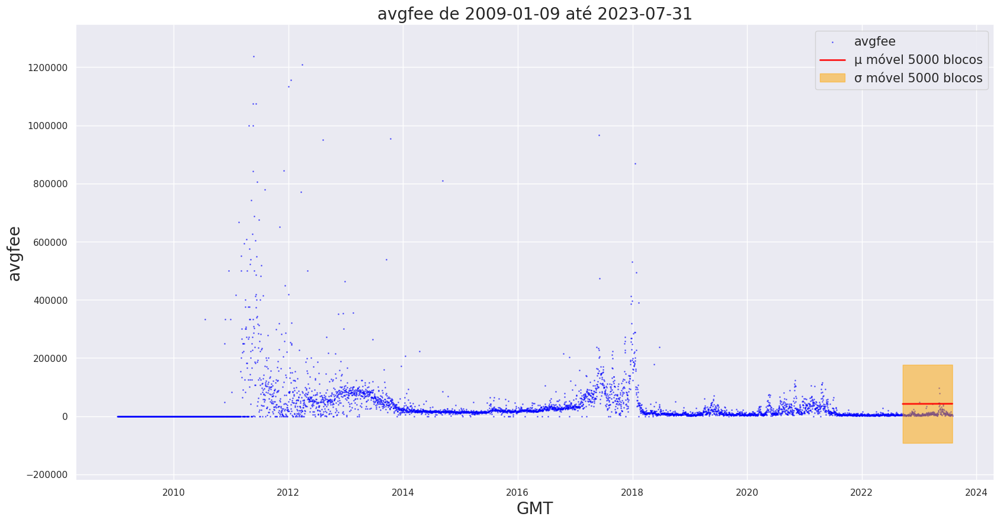

(numeric) Average feerate (in satoshis per virtual byte)


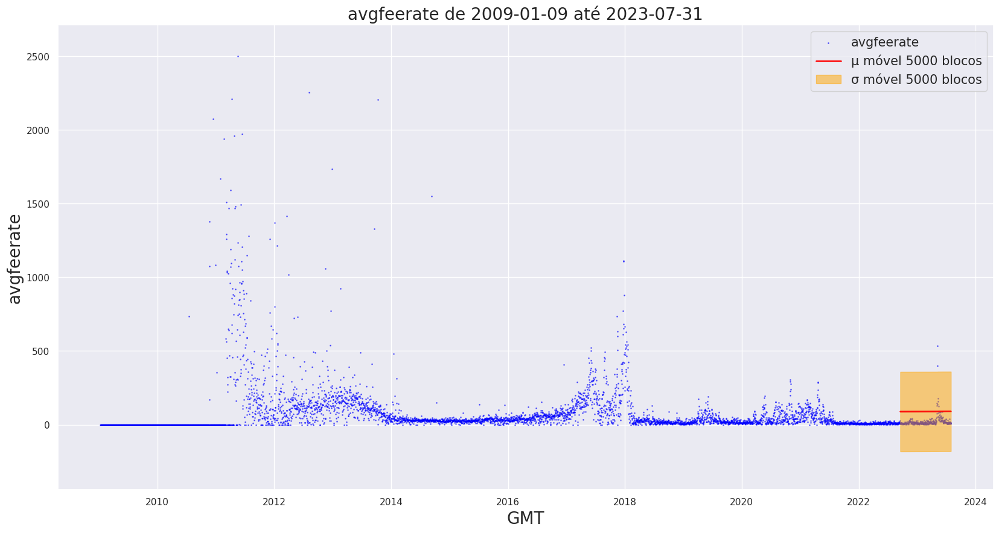

 (numeric) Average transaction size


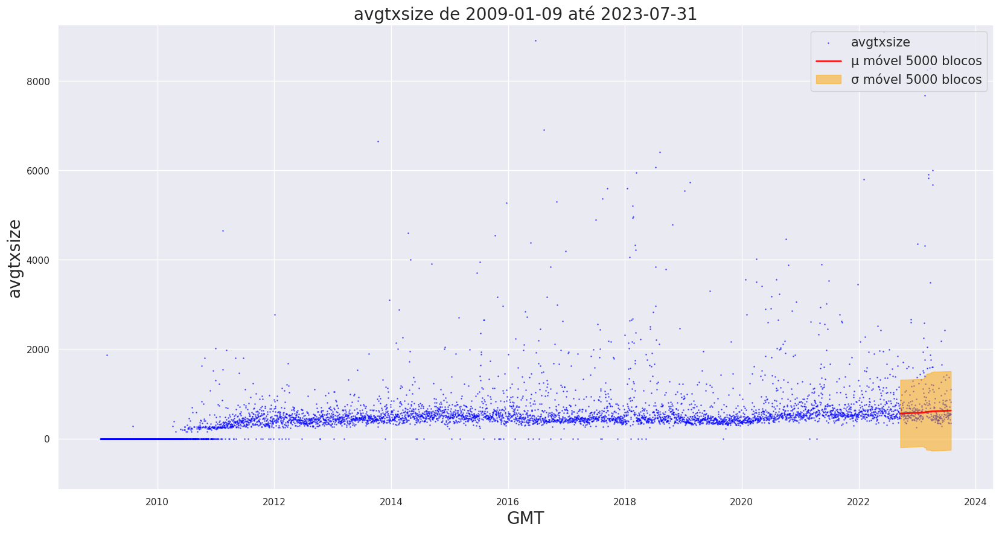

blockhash is a categorical variable
feerate_percentiles is a categorical variable
(numeric) The height of the block


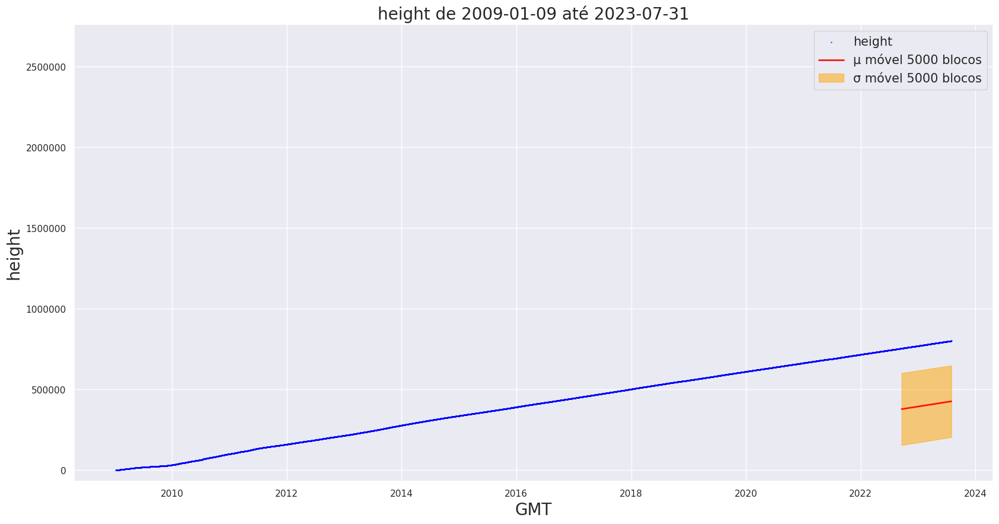

 (numeric) The number of inputs (excluding coinbase)


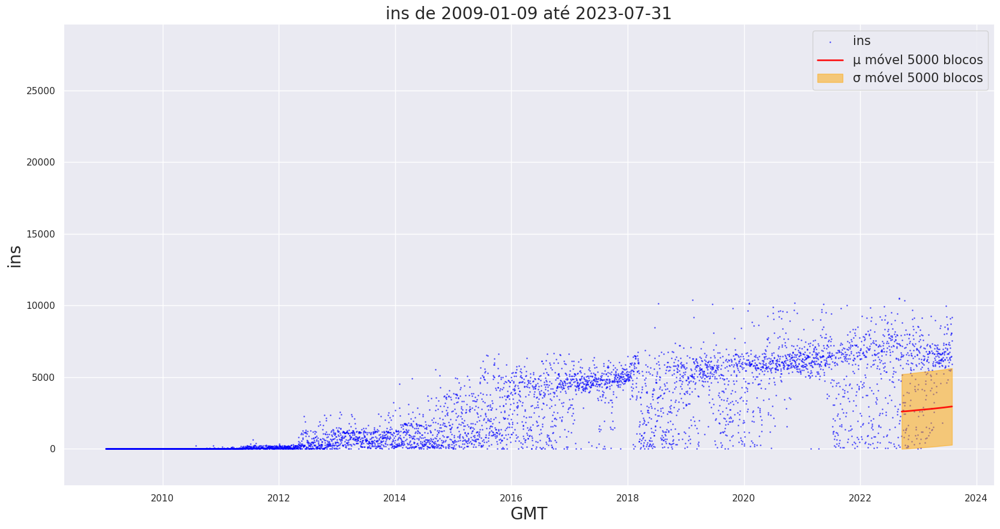

(numeric) Maximum fee in the block


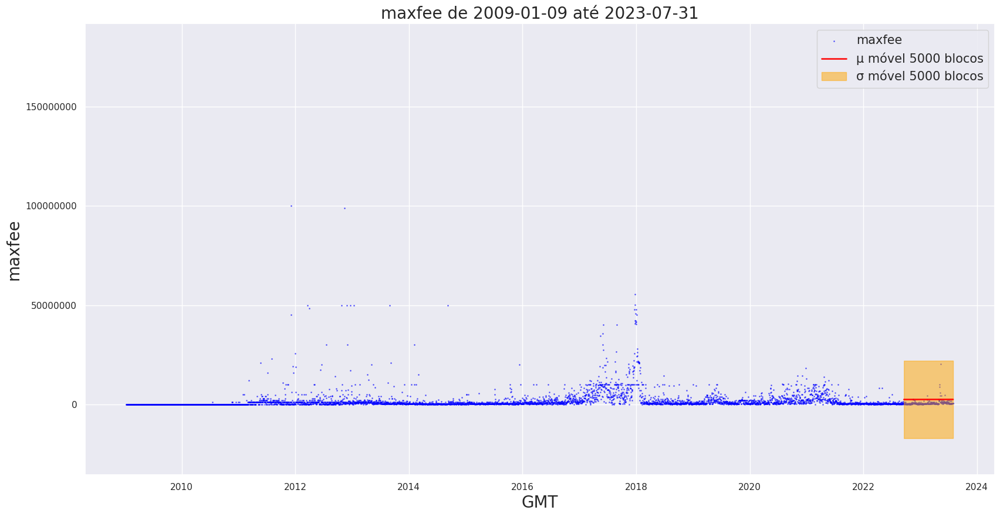

(numeric) Maximum feerate (in satoshis per virtual byte)


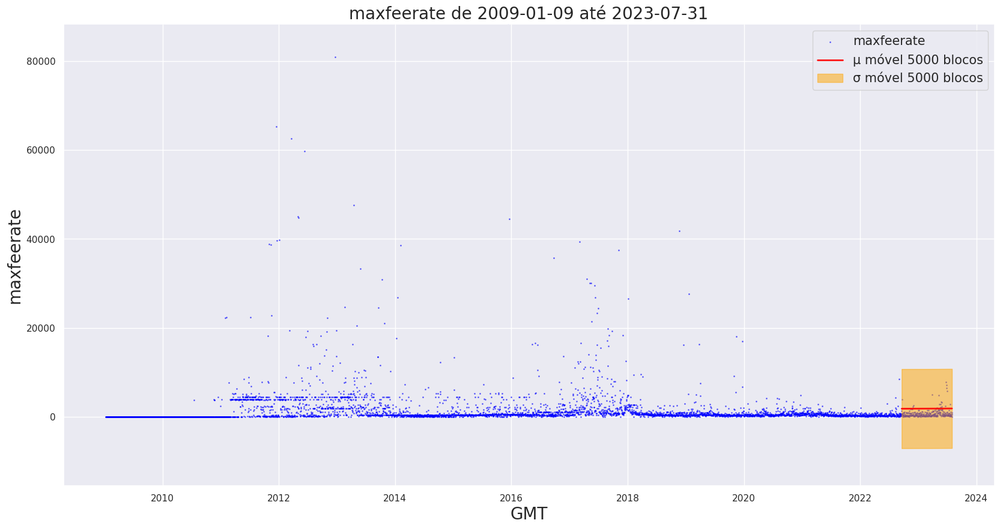

 (numeric) Maximum transaction size


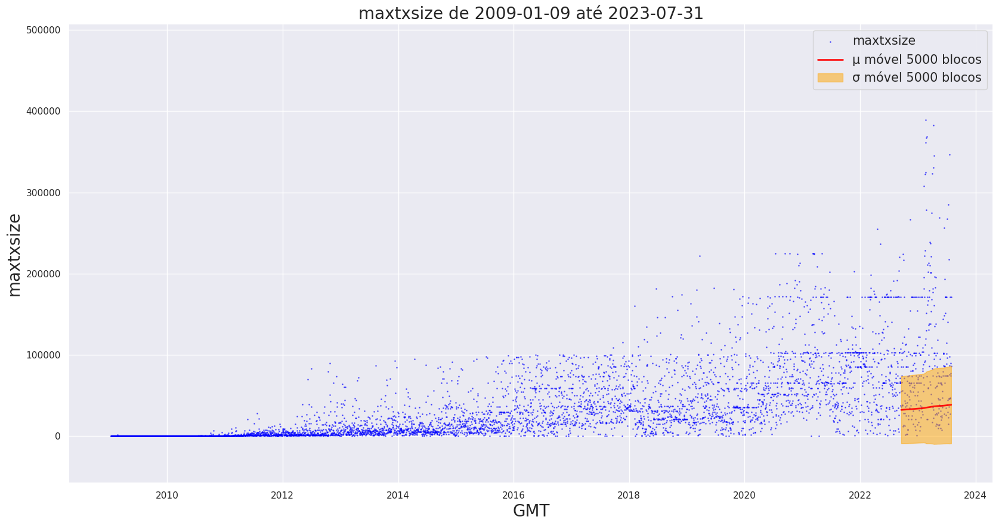

 (numeric) Truncated median fee in the block


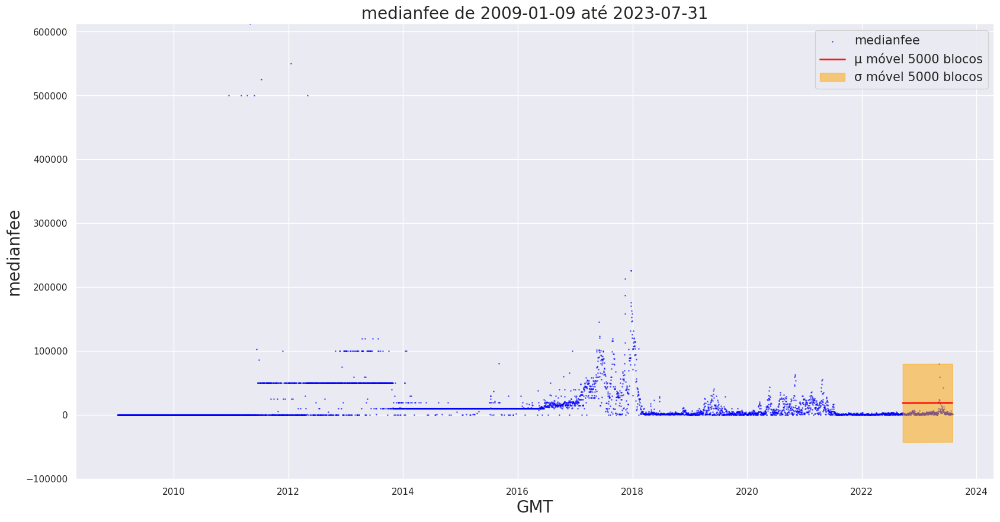

(numeric) The block median time past


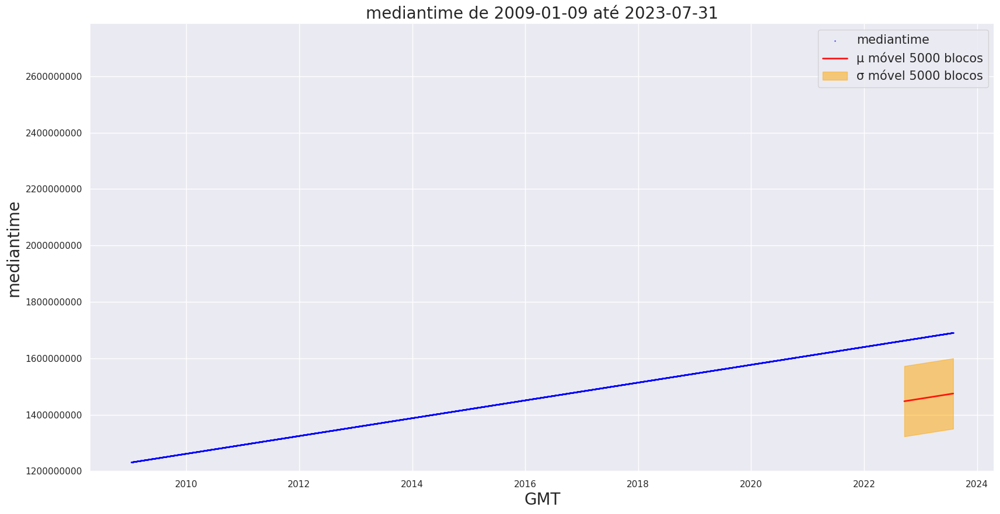

(numeric) Truncated median transaction size


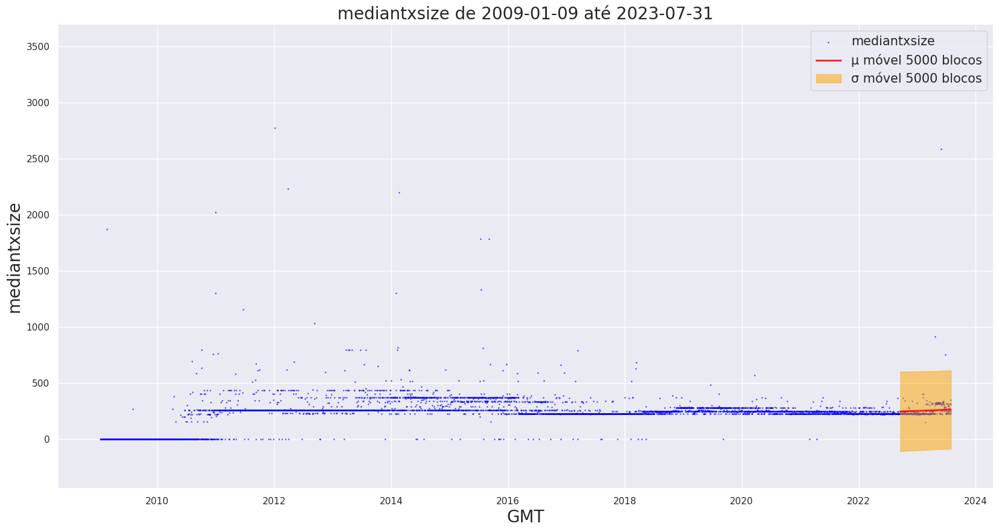

(numeric) Minimum fee in the block


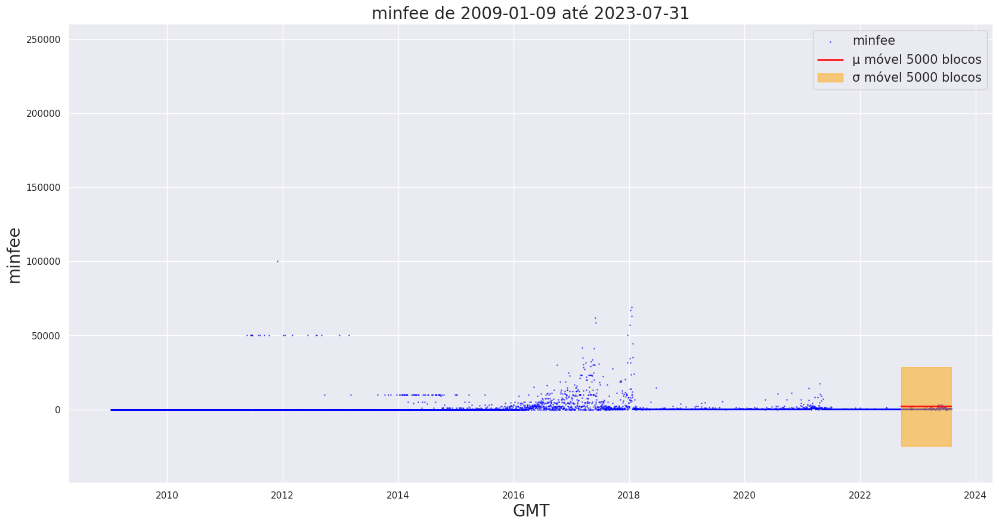

(numeric) Minimum feerate (in satoshis per virtual byte)


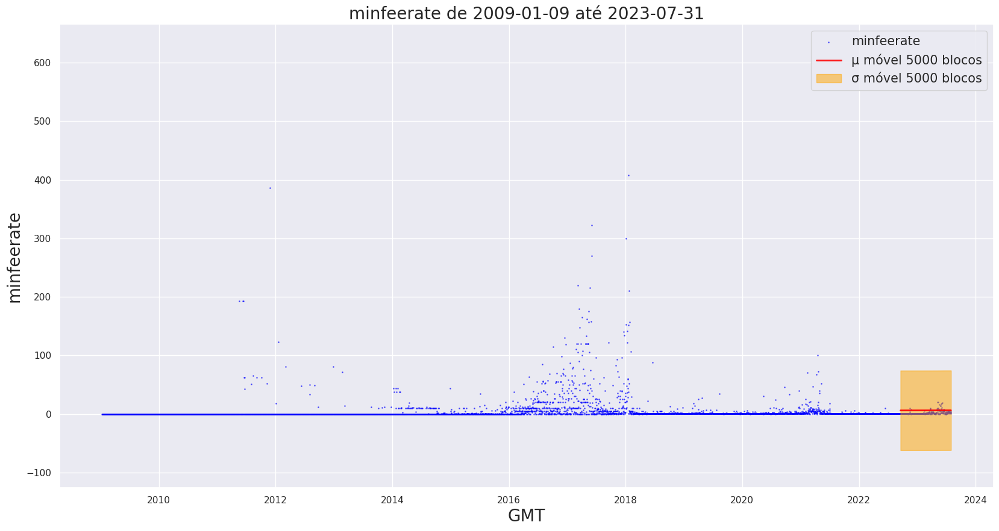

 (numeric) Minimum transaction size


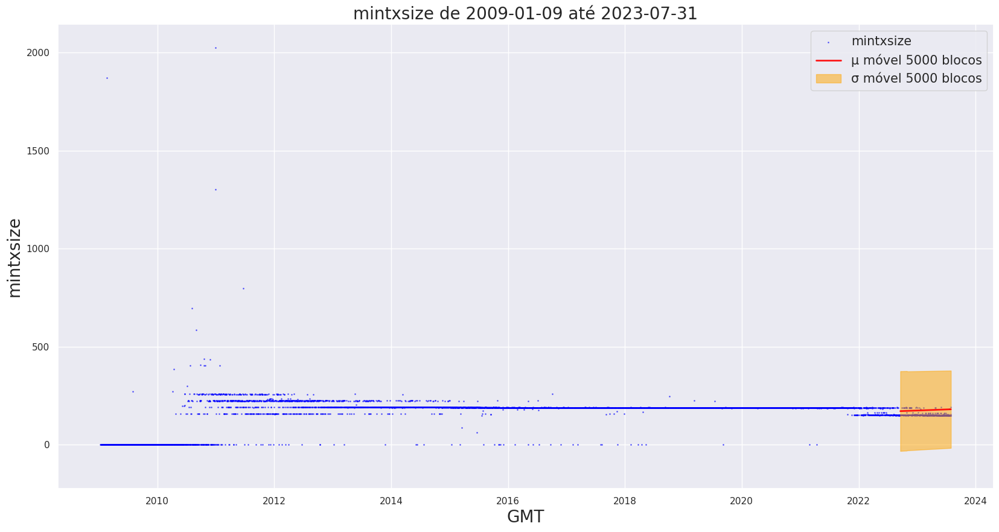

(numeric) The number of outputs


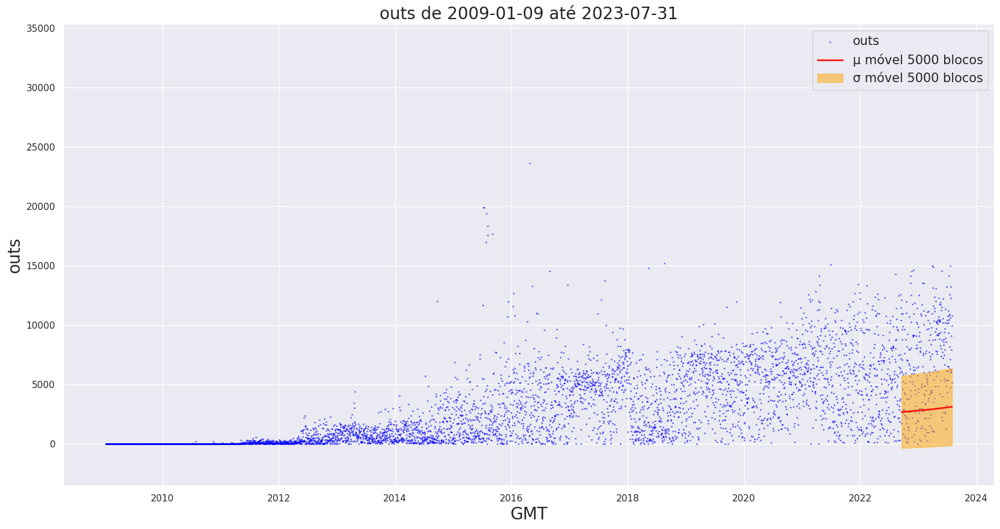

 (numeric) The block subsidy


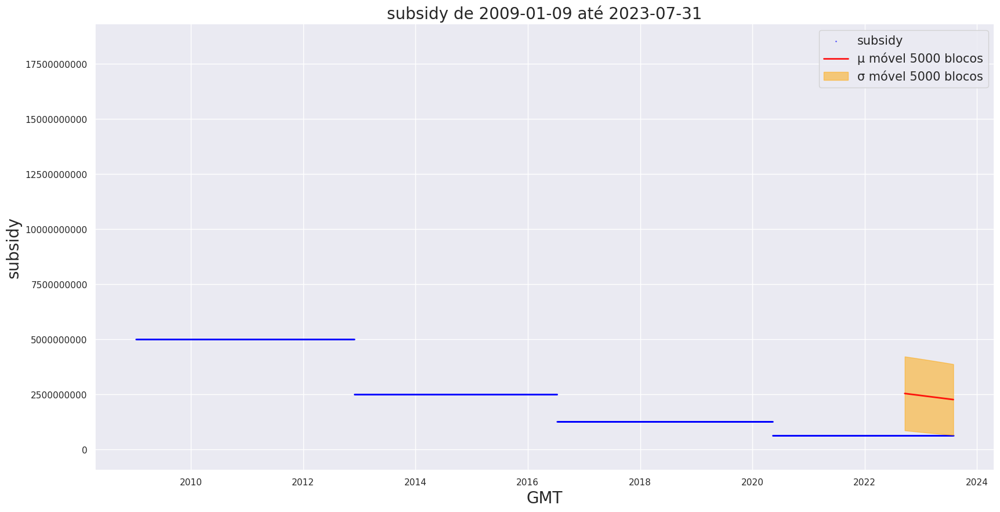

(numeric) Total size of all segwit transactions


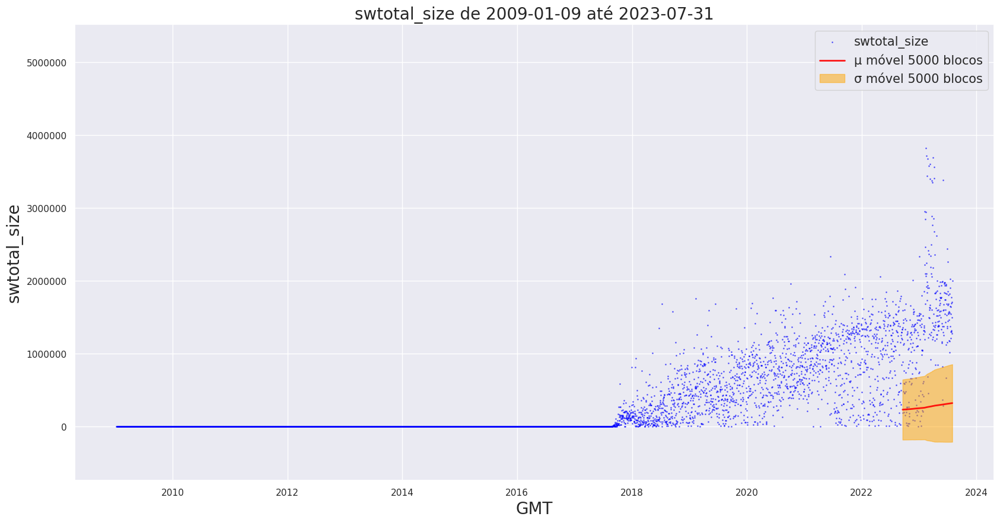

(numeric) Total weight of all segwit transactions


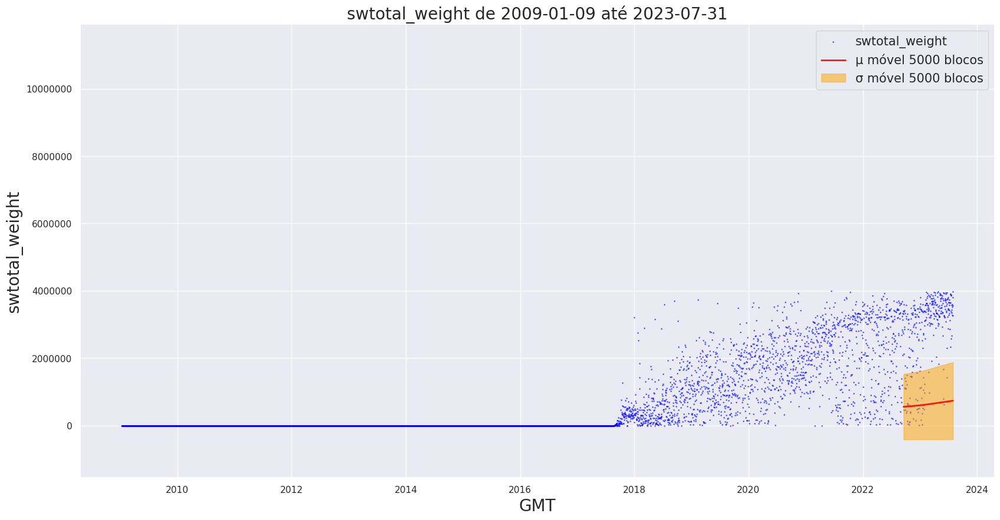

 (numeric) The number of segwit transactions


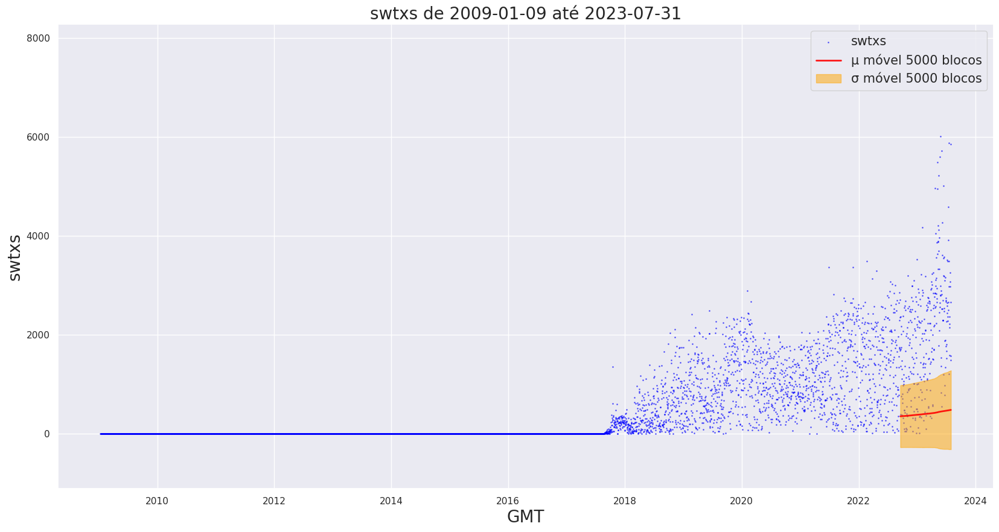

(numeric) The block time


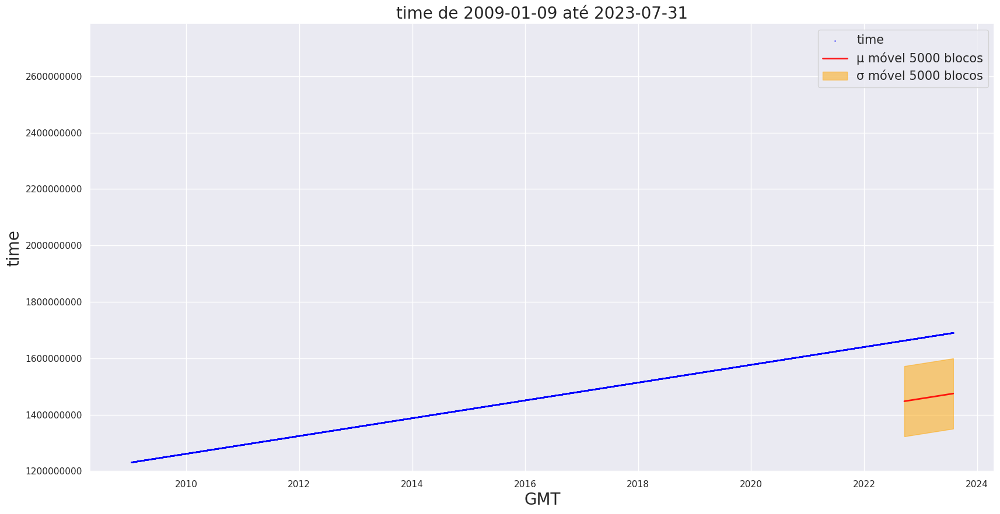

 (numeric) Total amount in all outputs (excluding coinbase and thus reward [ie subsidy + totalfee])


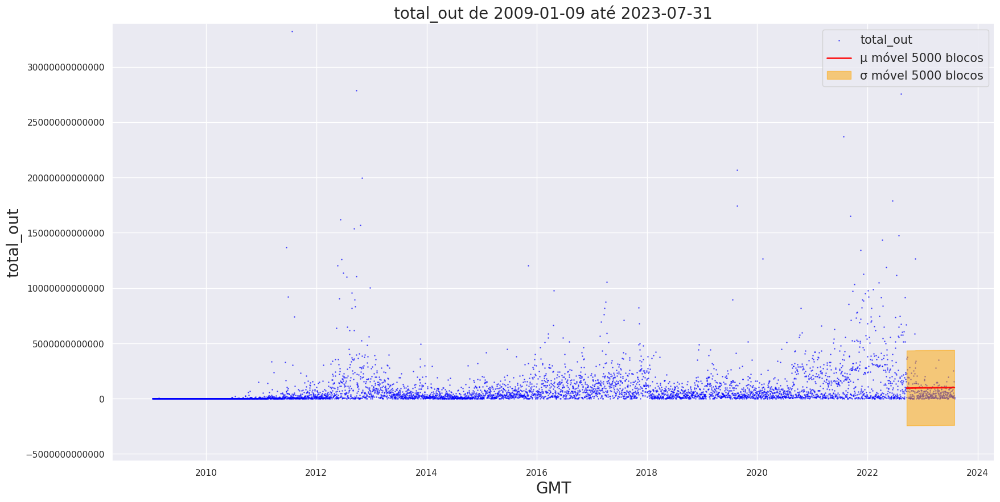

(numeric) Total size of all non-coinbase transactions


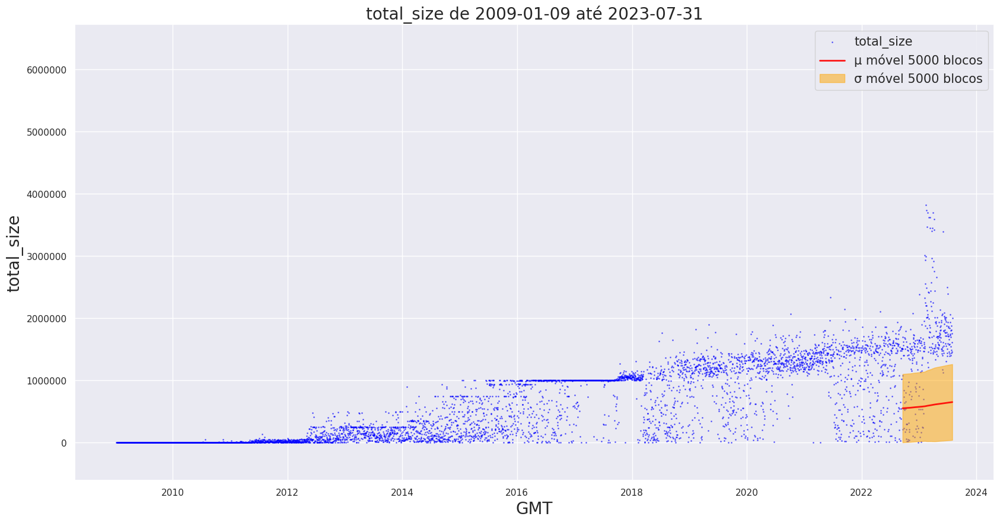

(numeric) Total weight of all non-coinbase transactions


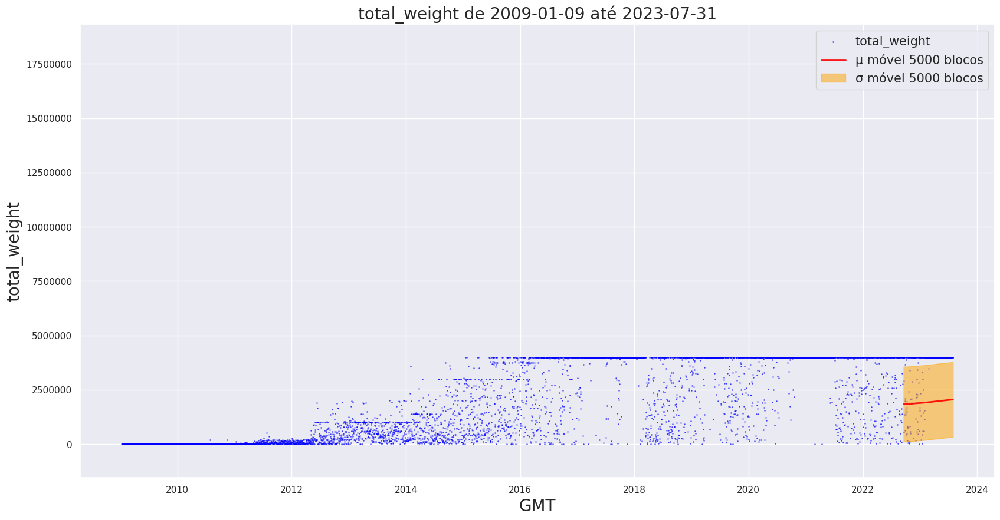

(numeric) The fee total


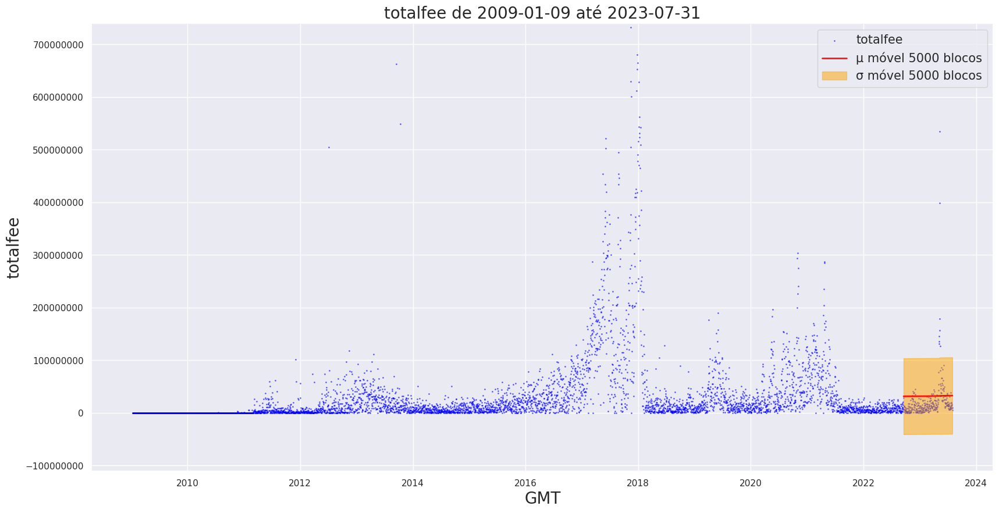

 (numeric) The number of transactions (including coinbase)


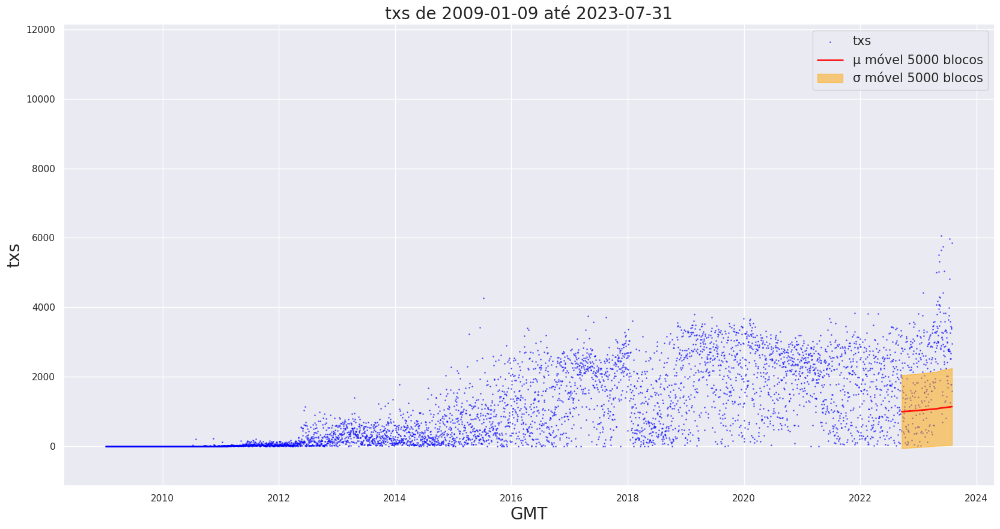

 (numeric) The increase/decrease in the number of unspent outputs


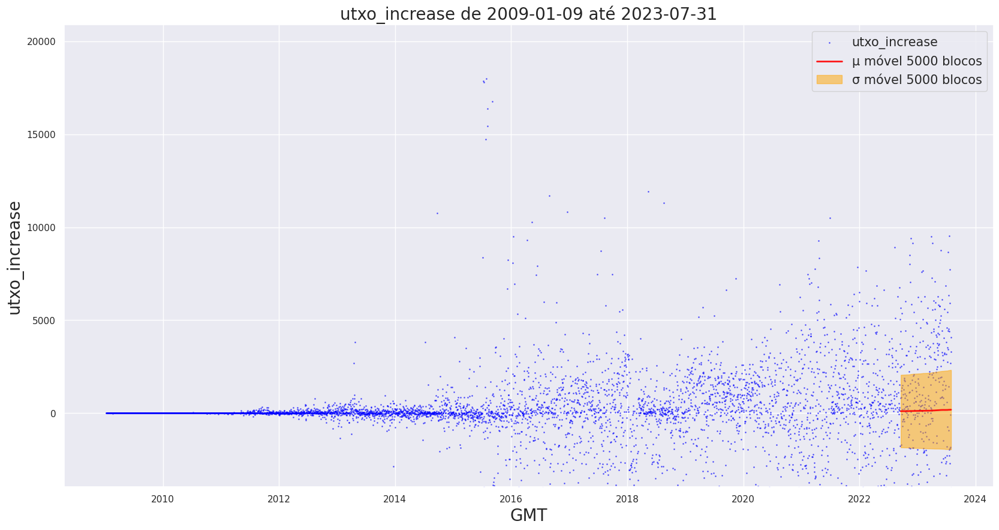

(numeric) The increase/decrease in size for the utxo index (not discounting op_return and similar)


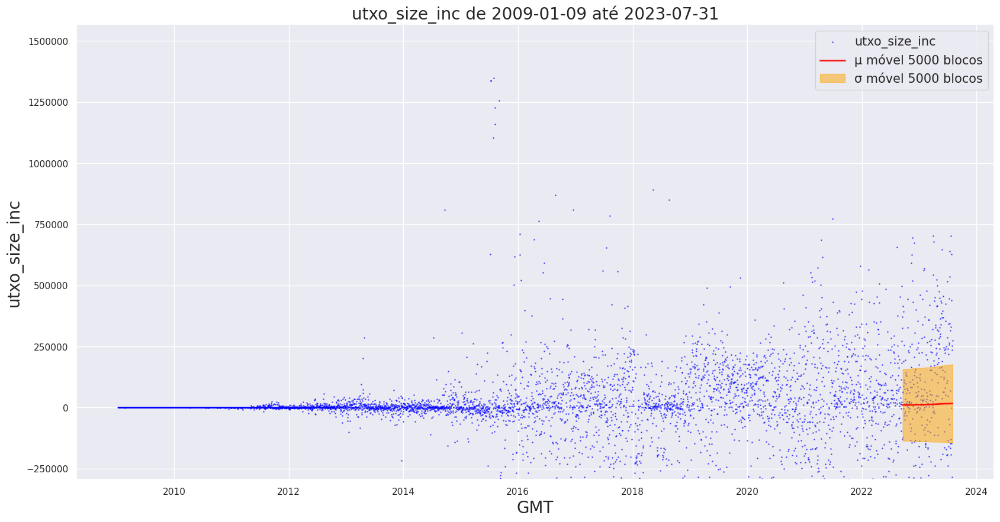

utxo_increase_actual


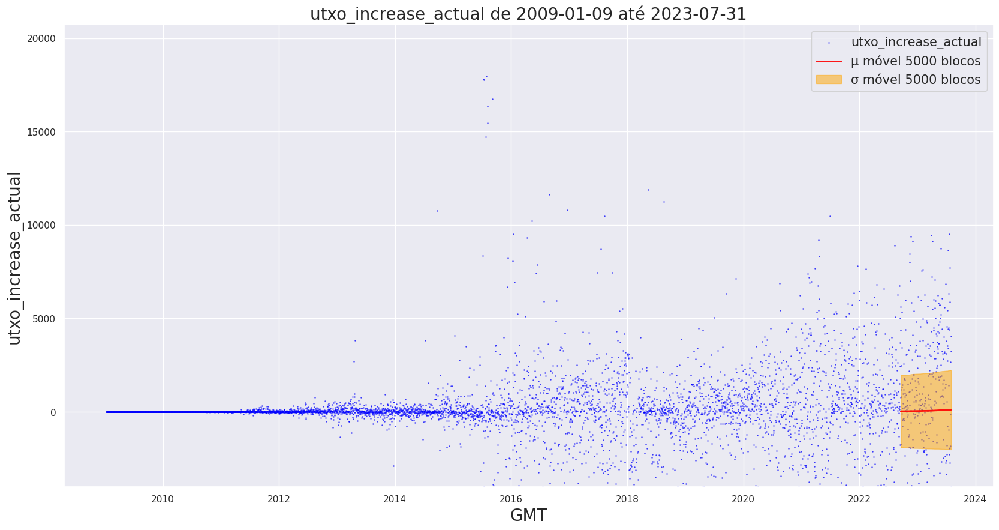

utxo_size_inc_actual


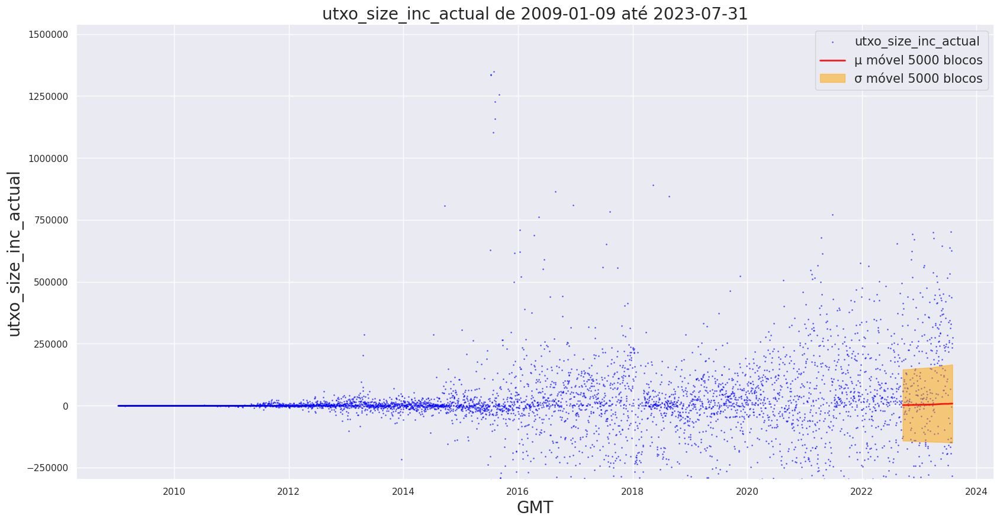

blockhash_decimal is a categorical variable
GMT is a categorical variable
year


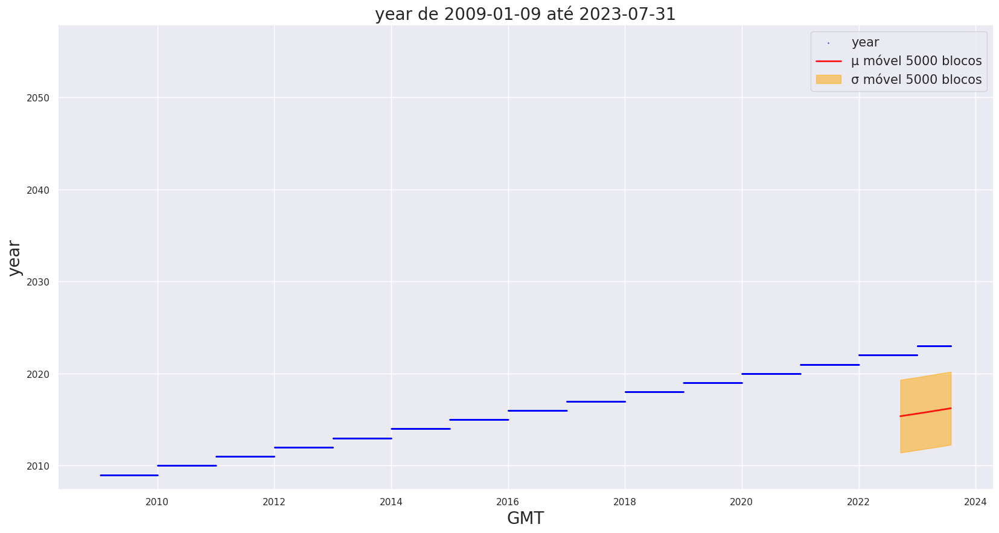

avgfee_btc


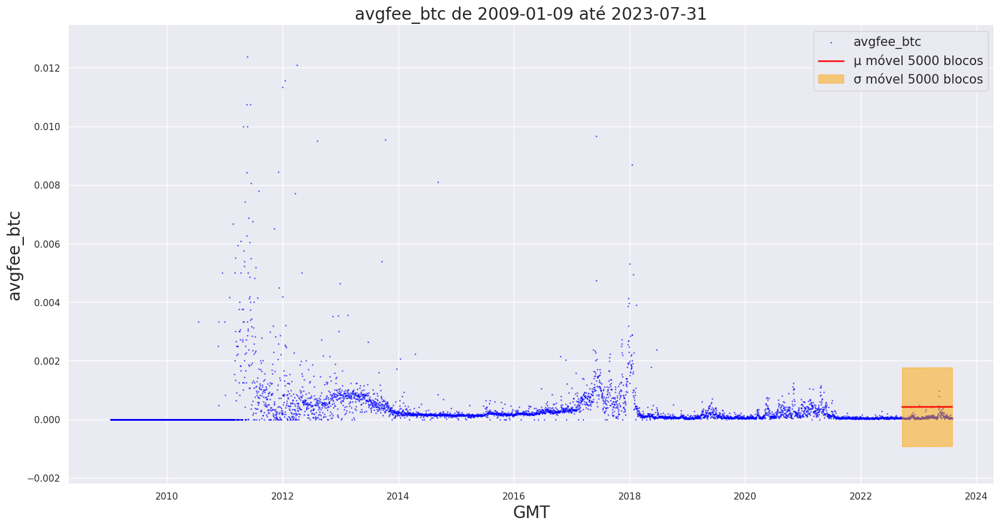

subsidy_btc


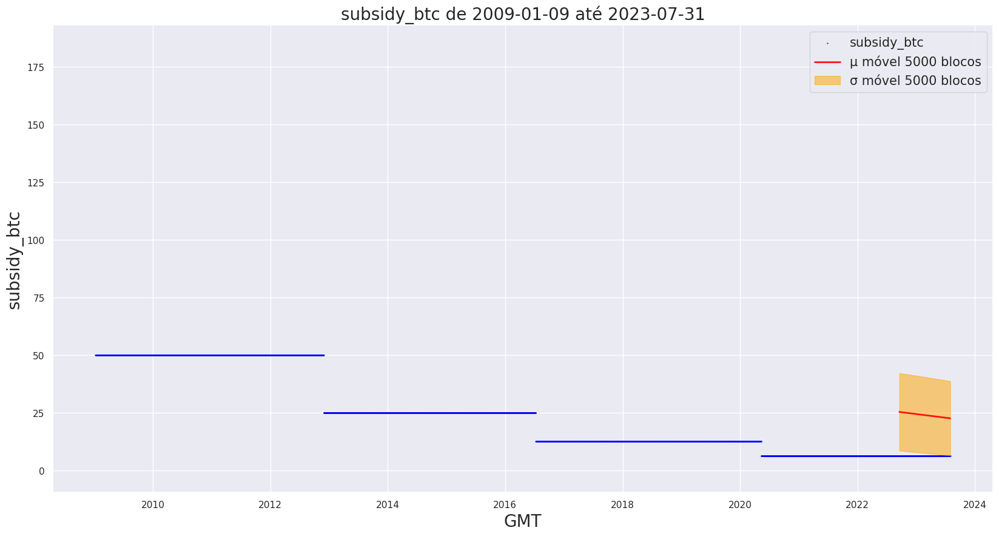

In [56]:
# Plots with the mean of the values of the blocks in one day
for i,col in enumerate(df_blockstats.columns):
    # find the data type of each column
    if df_blockstats[col].dtype == "object" :
        print(f"{col} is a categorical variable")
    elif col not in ["GMT", "index"]:
        # tenta printar a descrição de cada coluna
        try:
            print(f"{desc[col]}")
        except:
            print(f"{col}")
        cria_scatterplot(data=df_blockstats, titulo=f"{col}", x="GMT", y=col, precisao=0)


In [137]:
def plot_taxas(data, titulo):

    # plot the average fee in USD using sns.lineplot
    sns.set(font_scale=1)
    plt.figure(figsize=(20,10))
    plt.title(f"Taxa média de transação por bloco em USD. {titulo}", fontsize=20)
    plt.xlabel("Data", fontsize=20)
    plt.ylabel("Taxa média de transação por bloco em USD", fontsize=20)
    sns.lineplot(data=data, x="GMT", y="avgfee_USD", color="blue", alpha=0.5)
    # plot  fill betwin max and min fee
    plt.fill_between(data["GMT"],data["minfee_USD"], data["maxfee_USD"],color = "orange",alpha=0.5)
    plt.ylim(0, data["avgfee_USD"].mean() + 50*data["avgfee_USD"].std())
    ax = plt.gca()
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(currency_formatter))

    plt.show()

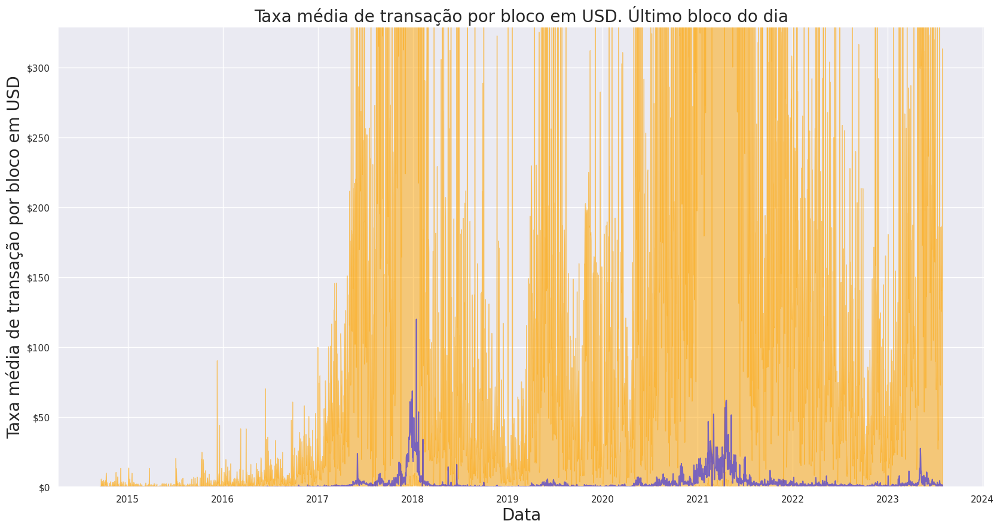

In [138]:
plot_taxas(df_blockstats_daily_last_one , titulo="Último bloco do dia")

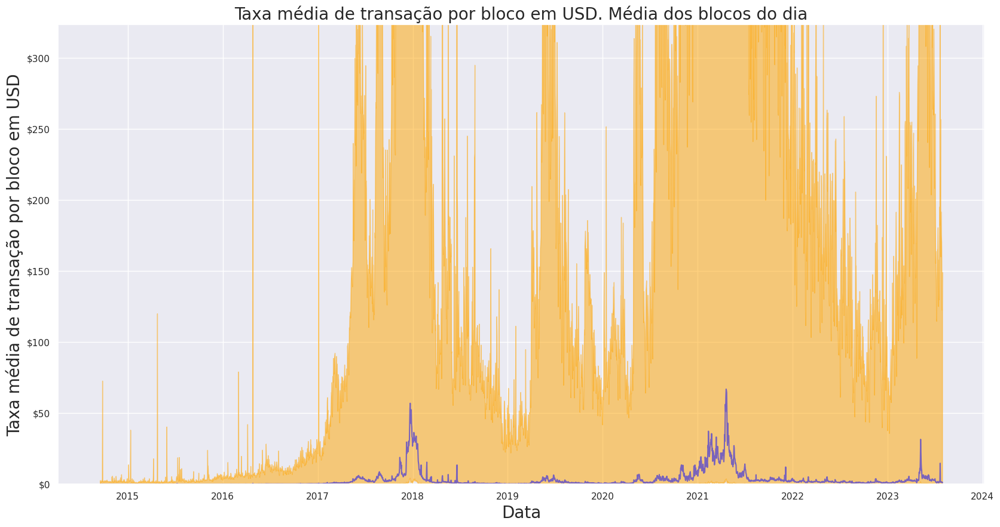

In [139]:
plot_taxas(df_blockstats_daily_mean, titulo= "Média dos blocos do dia")

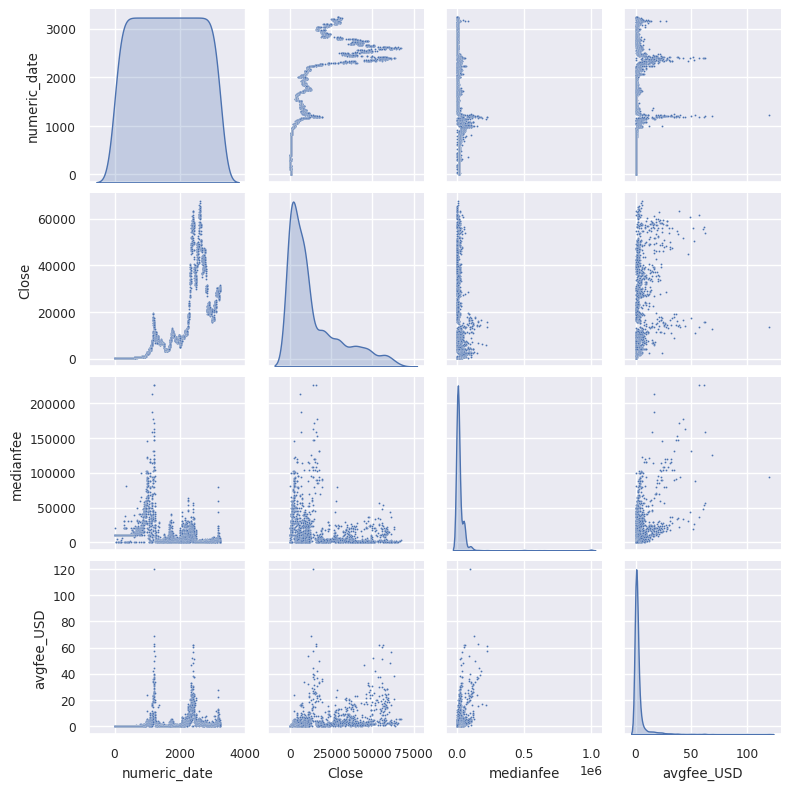

In [198]:
sns.set(font_scale=0.8)
sns.pairplot(df_blockstats_daily_mean[["numeric_date", "Close", "medianfee","avgfee_USD"]], diag_kind="kde", markers="o", height=2, aspect=1, plot_kws=dict(s=2, alpha=1))
plt.show()

#### Feerate_percentiles

In [141]:
feerate_percentiles = df_blockstats["feerate_percentiles"]

# Convert Series to DataFrame
feerate_percentiles = pd.DataFrame(feerate_percentiles.tolist(), columns=['p10', 'p25', 'p50', 'p75', 'p90'])

# Reduce the dataframe to daily values
feerate_percentiles["GMT"] = df_blockstats["GMT"]
feerate_percentiles["GMT"] = pd.to_datetime(feerate_percentiles["GMT"], unit="s")
feerate_percentiles["GMT"] = feerate_percentiles["GMT"].dt.date

feerate_percentiles= feerate_percentiles.groupby("GMT").mean()
feerate_percentiles = feerate_percentiles.reset_index()


In [144]:
def plot_feerate_percentiles(feerate_percentiles, dolar = False):
    # plot p50 of df with sns 
    # diminish point size from plot sns

    moving_average = 1
    plt.figure(figsize=(20,10)) 
    sns.set(font_scale=1)
    plt.scatter(data=feerate_percentiles,x="GMT", y="p50", s=3)
    plt.ticklabel_format(style='plain', axis='y')
    plt.ylim(0,feerate_percentiles["p50"].mean() + 5*feerate_percentiles["p50"].std())
    plt.fill_between(feerate_percentiles["GMT"], feerate_percentiles["p25"].rolling(moving_average).mean(), feerate_percentiles["p75"].rolling(moving_average).mean(), alpha=0.5, color="orange")
    plt.fill_between(feerate_percentiles["GMT"], feerate_percentiles["p10"].rolling(moving_average).mean(), feerate_percentiles["p90"].rolling(moving_average).mean(), alpha=0.1, color="red")
    
    unitis = "satoshis per virtual byte"
    if dolar:
        ax = plt.gca()
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(currency_formatter))
        unitis = "USD"  
        

    plt.title(f" Feerates at the 10th, 25th, 50th, 75th, and 90th percentile weight unit ({unitis})", fontsize=20)
    plt.legend(["p50", "p25-p75", "p10-p90"],loc='upper right', fontsize=20)

    plt.show()

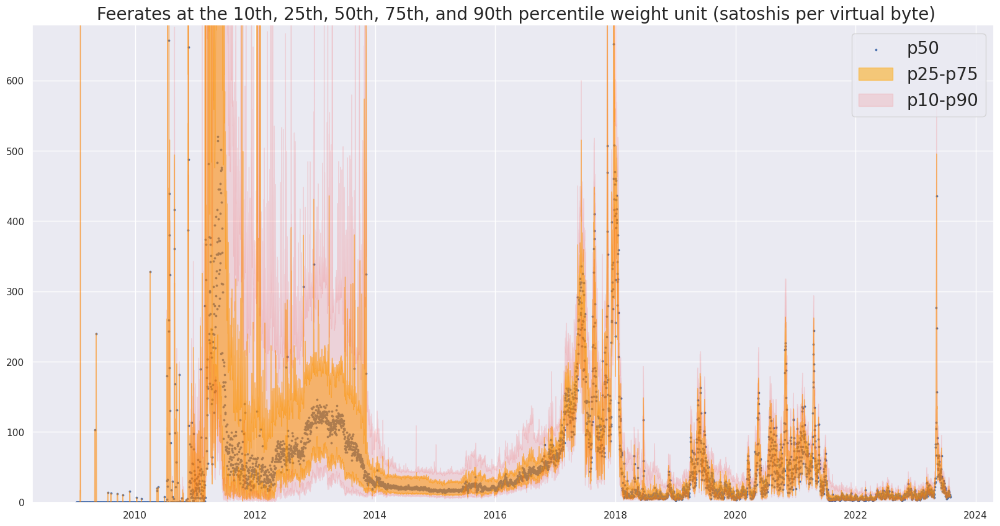

In [145]:
plot_feerate_percentiles(feerate_percentiles)

In [114]:
feerate_percentiles_usd = feerate_percentiles.merge(btc_price_data[["Close", "Date", "Volume"]], left_on="GMT", right_on="Date", how="left")


In [119]:
feerate_percentiles_usd["p10"] = feerate_percentiles_usd["p10"] * feerate_percentiles_usd["Close"]/100_000_000
feerate_percentiles_usd["p25"] = feerate_percentiles_usd["p25"] * feerate_percentiles_usd["Close"]/100_000_000
feerate_percentiles_usd["p50"] = feerate_percentiles_usd["p50"] * feerate_percentiles_usd["Close"]/100_000_000
feerate_percentiles_usd["p75"] = feerate_percentiles_usd["p75"] * feerate_percentiles_usd["Close"]/100_000_000
feerate_percentiles_usd["p90"] = feerate_percentiles_usd["p90"] * feerate_percentiles_usd["Close"]/100_000_000


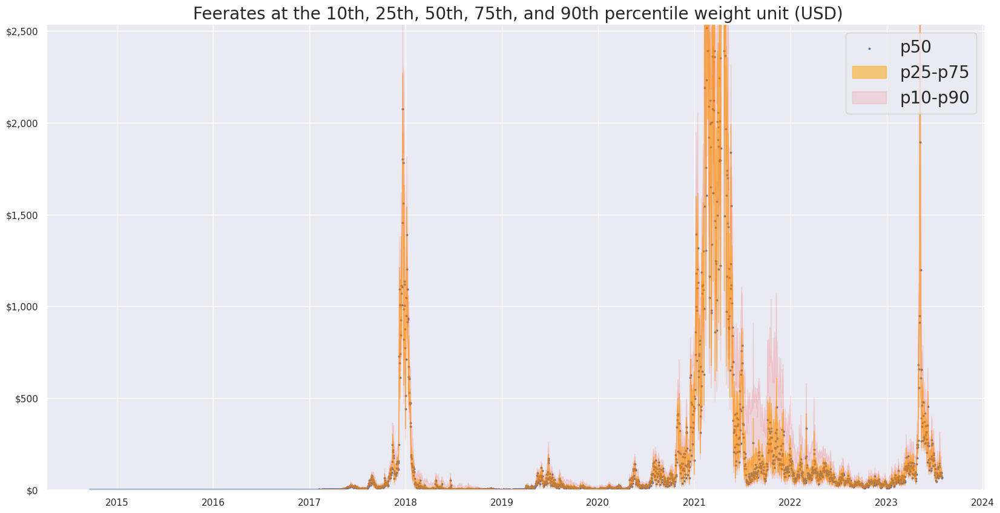

In [146]:
plot_feerate_percentiles(feerate_percentiles_usd, dolar=True)

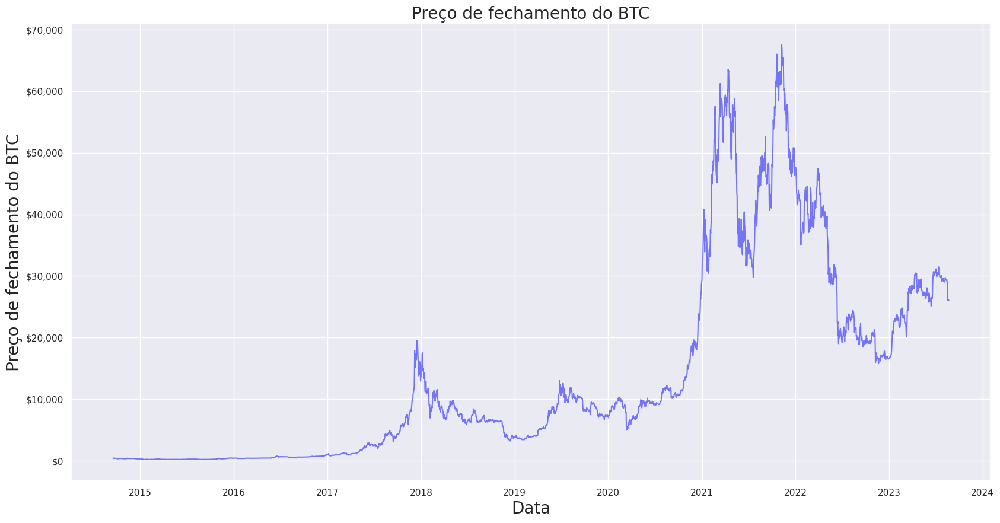

In [125]:
#plot the close price from btc_price_data
sns.set(font_scale=1)
plt.figure(figsize=(20,10))
plt.title(f"Preço de fechamento do BTC", fontsize=20)
plt.xlabel("Data", fontsize=20)
plt.ylabel("Preço de fechamento do BTC", fontsize=20)
sns.lineplot(data=btc_price_data, x="Date", y="Close", color="blue", alpha=0.5)
# put U$ in the y axis
ax = plt.gca()
ax.yaxis.set_major_formatter(ticker.FuncFormatter(currency_formatter))
plt.show()

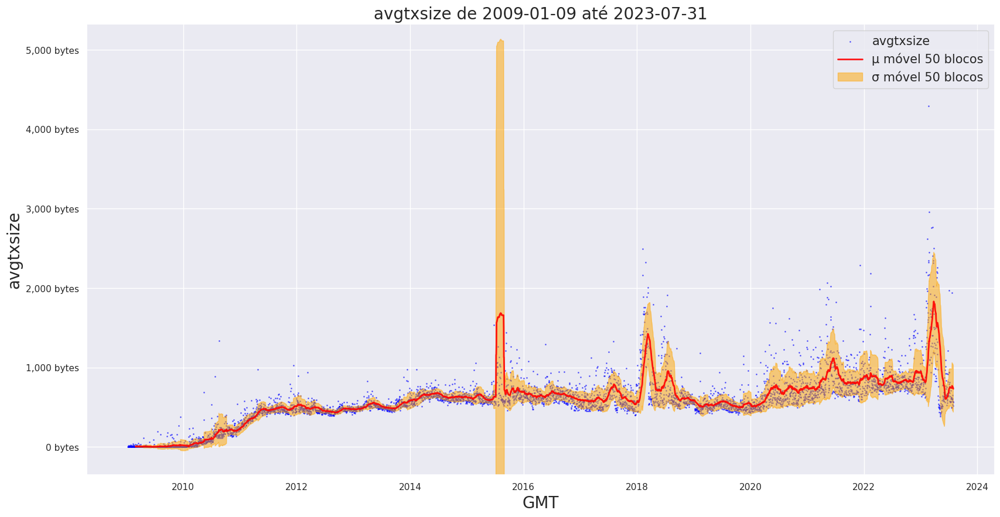

In [175]:
cria_scatterplot(data=df_blockstats_daily_mean, titulo="avgtxsize", x="GMT", y="avgtxsize", cor = "blue", ylabel="bytes")

# por que existem esses picos?

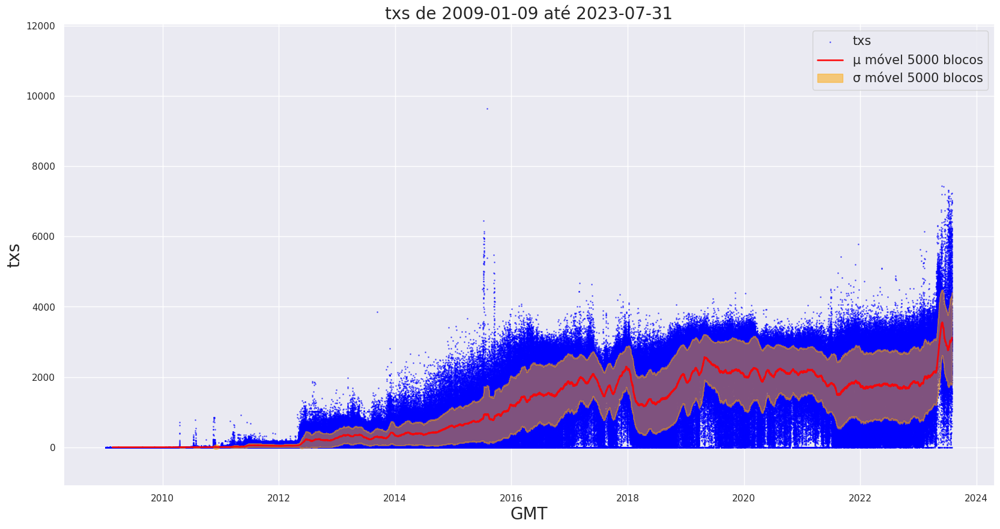

In [166]:
cria_scatterplot(data=df_blockstats_daily_mean, titulo="txs", x="GMT", y="txs", cor = "blue")

# por que existem esses picos?

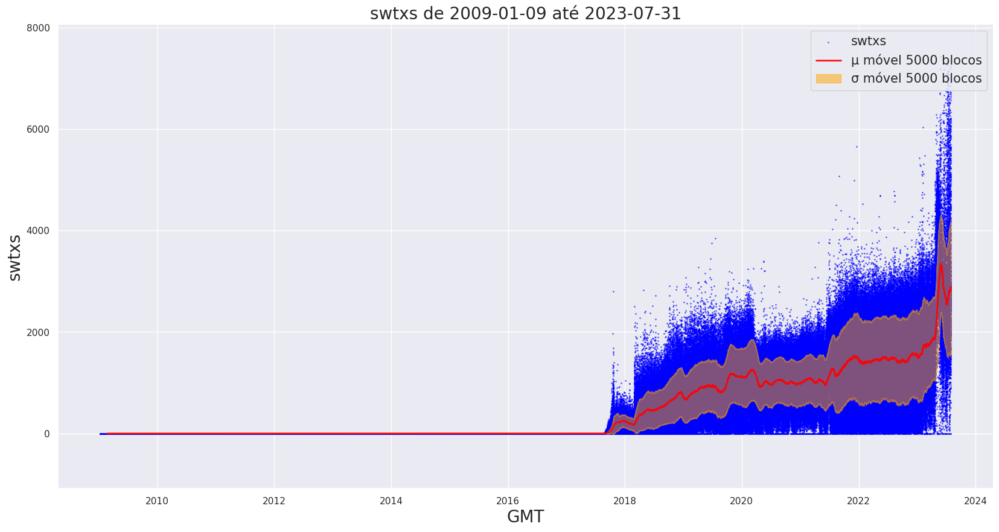

In [167]:
cria_scatterplot(data=df_blockstats_daily_mean, titulo="swtxs", x="GMT", y="swtxs", cor = "blue")

# por que existem esses picos?

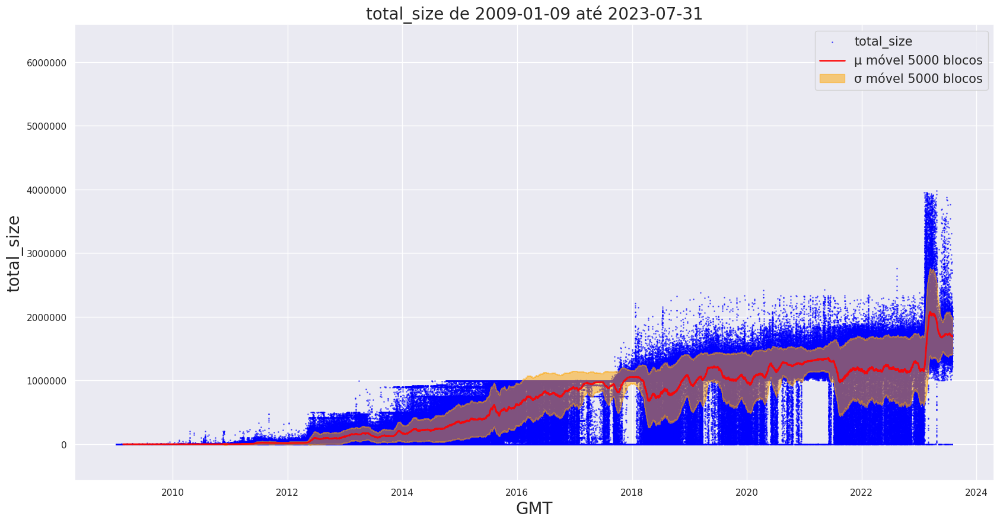

In [171]:
cria_scatterplot(data=df_blockstats_daily_mean, titulo="total_size", x="GMT", y="total_size", cor = "blue")

# por que existem esses picos?

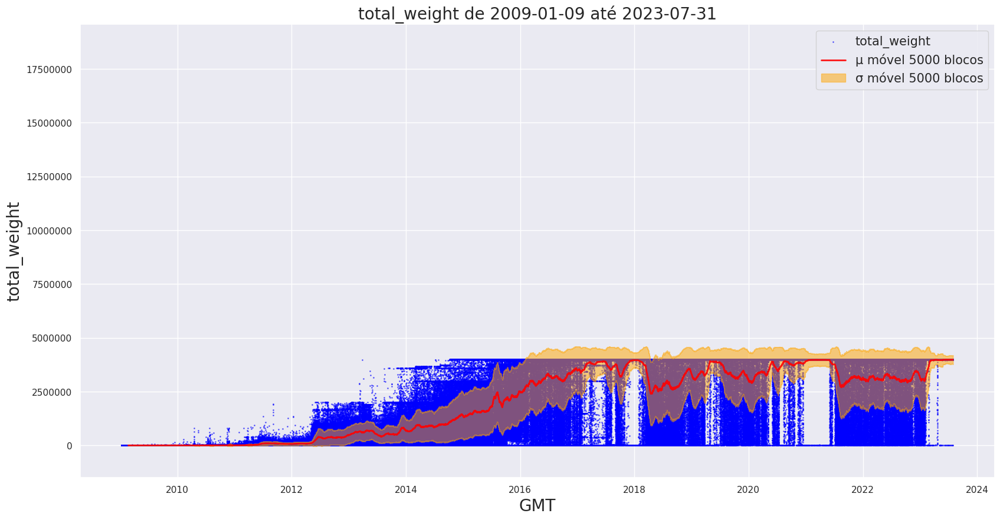

In [169]:
cria_scatterplot(data=df_blockstats_daily_mean, titulo="total_weight", x="GMT", y="total_weight", cor = "blue")

# por que existem esses picos?

In [182]:
df_blockstats_daily_mean["total_out_usd"] =(df_blockstats_daily_mean["total_out"] + df_blockstats_daily_mean["totalfee"] + df_blockstats_daily_mean["subsidy"])*df_blockstats_daily_mean["Close"]/100_000_000

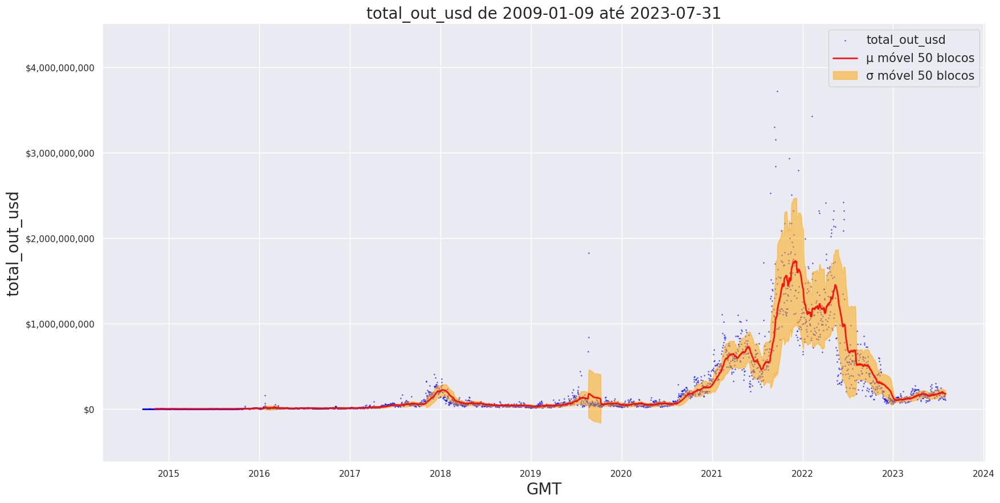

In [185]:
cria_scatterplot(data=df_blockstats_daily_mean, titulo="total_out_usd", x="GMT", y="total_out_usd", cor = "blue", ylabel="USD")

# por que existem esses picos?

In [ ]:
#teste novo clone

# Transactions
#### Transactions hashs

In [ ]:
# Get all transactions hashs
#útil no começo
rpc_connection = AuthServiceProxy("http://%s:%s@127.0.0.1:8332" % ("moises", "moises123"), timeout=100000)
    latest_block_hash = rpc_connection.getbestblockhash() # Replace with actual hash
    block = rpc_connection.getblock(latest_block_hash)
    latest_block_hash = block["previousblockhash"]
    

import pandas as pd
import sqlite3
from bitcoinrpc.authproxy import AuthServiceProxy

def initial_load(latest_block_hash):
    
    with sqlite3.connect('bitcoin_blockchain_transactions_hashs.db') as conn:
        iteration_count = 0
        while latest_block_hash != "0000000000000000000000000000000000000000000000000000000000000000":
            rpc_connection = AuthServiceProxy("http://%s:%s@127.0.0.1:8332" % ("moises", "moises123"), timeout=100000)
            block = rpc_connection.getblock(latest_block_hash)
            df = pd.DataFrame([block])
            df['tx'] = df['tx'].astype(str)
            df["difficulty"] = df["difficulty"].astype(str)

            df.to_sql('transactions', conn, if_exists='append')
            print("Saved block", block["height"])
            
            latest_block_hash = block["previousblockhash"]
            iteration_count += 1


rpc_connection = AuthServiceProxy("http://%s:%s@127.0.0.1:8332" % ("moises", "moises123"), timeout=100000)
block = rpc_connection.getblockhash(395921)
latest_block_hash = block
initial_load(latest_block_hash)


conn = sqlite3.connect("bitcoin_blockchain_transactions_hashs.db")
df = pd.read_sql("select * from transactions", conn)






In [2]:
conn = sqlite3.connect("/home/moises/Data_BTC_thesis/bitcoin_blockchain_transactions_hashs.db")
df_transactions_hashs = pd.read_sql("select * from transactions", conn) #should rename it to Blocks instead of transactions


# Tenho que apagar os blocos duplicados no db bitcoin_blockchain_transactions_hashs.db

In [14]:

df_transactions_hashs.drop_duplicates(subset=['height'], inplace=True)
df_transactions_hashs = df_transactions_hashs.reset_index(drop=True)

In [22]:
# find height duplicated and show the index where they are
df_transactions_hashs

,index,hash,confirmations,height,version,versionHex,merkleroot,time,mediantime,nonce,bits,difficulty,chainwork,nTx,previousblockhash,nextblockhash,strippedsize,size,weight,tx
0,0,0000000000000000000358f55c0dede49635e100b3930f...,2,803658,536870912,20000000,48d85f3f195462cabfdc28ba82db0ad7a40351781d85ff...,1692300703,1692296979,304100948,17055f5b,52391178981379.36,00000000000000000000000000000000000000005272ad...,2229,0000000000000000000275fbaed892593771d3e09557b0...,00000000000000000003806d93ab8542ee22f2fbf63354...,847732,1449856,3993052,['717722008a4e134f78910b37e12dd2cf6301cb8bd2d6...
1,0,0000000000000000000275fbaed892593771d3e09557b0...,3,803657,650207232,26c16000,208c255e479a443b8167f3594486632a0470459319d545...,1692300440,1692295705,378507314,17055f5b,52391178981379.36,000000000000000000000000000000000000000052727d...,2909,00000000000000000005277f3b946d7f557435ebe53112...,0000000000000000000358f55c0dede49635e100b3930f...,831664,1497837,3992829,['07b55323168caeb1eb1d10d49f60fb8beec39ea94328...
2,0,00000000000000000005277f3b946d7f557435ebe53112...,4,803656,662274048,27798000,8ace95275204727408b20dc0ab62bcec1ea217e545a2da...,1692299874,1692294161,3813089281,17055f5b,52391178981379.36,000000000000000000000000000000000000000052724d...,2532,0000000000000000000398937020453601806e9d26cb33...,0000000000000000000275fbaed892593771d3e09557b0...,801457,1588571,3992942,['414999d8a93c351a9fb96aa5b17f3818d82212a1c456...
3,0,0000000000000000000398937020453601806e9d26cb33...,5,803655,536911872,2000a000,dd6475b201c88ac3368da7ce512d47e8d80e7119d3f89d...,1692298699,1692291597,1741089996,17055f5b,52391178981379.36,000000000000000000000000000000000000000052721e...,2318,00000000000000000000d673eb91e6224f6a34ca53ed87...,00000000000000000005277f3b946d7f557435ebe53112...,796480,1603967,3993407,['954fb32f85ab367aa04b454f1880d61b55d7ddf1f02d...
4,0,00000000000000000000d673eb91e6224f6a34ca53ed87...,6,803654,810663936,3051c000,8ab669ce12e11e9e3db4d09ee24619ab11184002c62922...,1692298194,1692291072,2092245520,17055f5b,52391178981379.36,00000000000000000000000000000000000000005271ee...,2981,00000000000000000001afc40a7efbe87d22c5fc6d11fd...,0000000000000000000398937020453601806e9d26cb33...,811572,1558361,3993077,['6782164dcfa09d420dcb5082b04dda4858633a51d0ab...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
803666,0,000000004ebadb55ee9096c9a2f8880e09da59c0d68b1c...,805247,4,1,00000001,df2b060fa2e5e9c8ed5eaf6a45c13753ec8c63282b2688...,1231470988,1231469744,2850094635,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,0000000082b5015589a3fdf2d4baff403e6f0be035a5d9...,000000009b7262315dbf071787ad3656097b892abffd1f...,215,215,860,['df2b060fa2e5e9c8ed5eaf6a45c13753ec8c63282b26...
803667,0,0000000082b5015589a3fdf2d4baff403e6f0be035a5d9...,805248,3,1,00000001,999e1c837c76a1b7fbb7e57baf87b309960f5ffefbf2a9...,1231470173,1231469744,1844305925,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,000000006a625f06636b8bb6ac7b960a8d03705d1ace08...,000000004ebadb55ee9096c9a2f8880e09da59c0d68b1c...,215,215,860,['999e1c837c76a1b7fbb7e57baf87b309960f5ffefbf2...
803668,0,000000006a625f06636b8bb6ac7b960a8d03705d1ace08...,805249,2,1,00000001,9b0fc92260312ce44e74ef369f5c66bbb85848f2eddd5a...,1231469744,1231469665,1639830024,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,00000000839a8e6886ab5951d76f411475428afc90947e...,0000000082b5015589a3fdf2d4baff403e6f0be035a5d9...,215,215,860,['9b0fc92260312ce44e74ef369f5c66bbb85848f2eddd...
803669,0,00000000839a8e6886ab5951d76f411475428afc90947e...,805250,1,1,00000001,0e3e2357e806b6cdb1f70b54c3a3a17b6714ee1f0e68be...,1231469665,1231469665,2573394689,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,000000000019d6689c085ae165831e934ff763ae46a2a6...,000000006a625f06636b8bb6ac7b960a8d03705d1ace08...,215,215,860,['0e3e2357e806b6cdb1f70b54c3a3a17b6714ee1f0e68...


In [3]:
lista = df_transactions_hashs["tx"][0]
lista = lista.replace("[", "") 
lista = lista.replace("]", "")
lista = lista.replace("'", "")
lista = lista.split(", ")
lista

['717722008a4e134f78910b37e12dd2cf6301cb8bd2d6278d3086035bfafd4e80',
 'e54d82a63e58c19b3ded3f32075cc2ec0138de2b7ec30d6cae93102b44e7dd8e',
 '7586827fbb1576641be581afad78d62a5618df4af99da8f312d18de63932aea9',
 '0c6f379bf6bca3b615a411f6d776117f3fc7a84a0566c3b2526ecfaee4d0ed12',
 'e6247c4d9da41b6f048d01705f0ecd9b4ad45f8ea13633b3471a47750acc14fe',
 '85a9265adbbfa972bda2fc3839123ac33d4f2db672069ed184612ee062be1f0d',
 'f991b13e6633a77c07128d8b0e72957224c1fd91f0386f5c4191b251566bbccc',
 '4cee9aa3d0eda67f93dc704d19f04bb36a4be4a1764fa76f36f59b02a60d5070',
 'a862b6918e78691fe908b163de073451c3201cc198f0ffb6681b696a028bdaa7',
 '2301a53188af87a37304029113287c72e06a791b7a1aec2653616d01ba96ccb2',
 'eca37593130aaa046f97e2e82e5b96a46723db5bb3d40999eb76d2401102b14e',
 '336fe95aaa2ee00d9b055a6be7a6f414e896861b2b8822eb29cc8704ebd9b82d',
 'd596999842af516a5fb18da7e35d5b50acd000a4543206c3ad14dc2ee224d133',
 '2c09a1943b628e5bb3aa297873a267b8887b169d3730f433b0b064a459f8d60f',
 '92cad0448df62bceaaddf443102eb761

In [25]:
#loop through the df and get the transactions loop and get all the raw transaction data

#create a db file of the raw transaction data to store in it via sql
conn = sqlite3.connect("/home/moises/Data_BTC_thesis/bitcoin_blockchain_transactions_raw.db")
for i in range(len(df)):
    tx_list = df["tx"][i]
    tx_list = tx_list.replace("[", "").replace("]", "").replace("'", "")
    tx_list = tx_list.split(", ")
    
    rpc_connection = AuthServiceProxy("http://%s:%s@127.0.0.1:8332" % ("moises", "moises123"), timeout=100000)
    commands = [ [ "getrawtransaction", transaction,2] for transaction in tx_list ]
    tx_list_raw = rpc_connection.batch_(commands)

    df_tx_list_raw = pd.DataFrame(tx_list_raw)
    df_tx_list_raw["fee"] = df_tx_list_raw["fee"].astype(str)
    df_tx_list_raw["vin"] = df_tx_list_raw["vin"].astype(str)
    df_tx_list_raw["vout"] = df_tx_list_raw["vout"].astype(str)

    df_tx_list_raw.to_sql('raw_transactions', conn, if_exists='append', index=False)
    print("Saved block", df["height"][i])

Saved block 803658
Saved block 803657
Saved block 803656
Saved block 803655
Saved block 803654
Saved block 803653
Saved block 803652
Saved block 803651
Saved block 803650
Saved block 803649
Saved block 803670
Saved block 803669
Saved block 803668
Saved block 803667
Saved block 803666
Saved block 803665
Saved block 803664
Saved block 803663
Saved block 803662
Saved block 803661
Saved block 803660
Saved block 803659
Saved block 803648
Saved block 803647
Saved block 803646
Saved block 803645
Saved block 803644
Saved block 803643
Saved block 803642
Saved block 803641
Saved block 803640


KeyboardInterrupt: 

In [26]:
#retrive the data raw from the db
conn = sqlite3.connect("/home/moises/Data_BTC_thesis/bitcoin_blockchain_transactions_raw.db")
df_raw = pd.read_sql("select * from raw_transactions", conn)
df_raw

,txid,hash,version,size,vsize,weight,locktime,vin,vout,hex,blockhash,confirmations,time,blocktime,fee
0,717722008a4e134f78910b37e12dd2cf6301cb8bd2d627...,df2000ca38f673874956698d242f0013578e438b63a304...,1,222,195,780,0,[{'coinbase': '034a430cf6578ce209cc2a010000000...,"[{'value': Decimal('6.32362371'), 'n': 0, 'scr...",0100000000010100000000000000000000000000000000...,0000000000000000000358f55c0dede49635e100b3930f...,1726,1692300703,1692300703,nan
1,e54d82a63e58c19b3ded3f32075cc2ec0138de2b7ec30d...,cbd2a08b1a1b6257ac4377d613954d689ae8ae07bd0b0a...,1,380,190,758,0,[{'txid': '5307c740531b53aec005687972c69e1a70b...,"[{'value': Decimal('0.66600000'), 'n': 0, 'scr...",010000000001017af1865688c98a379f99b815d17fb270...,0000000000000000000358f55c0dede49635e100b3930f...,1726,1692300703,1692300703,0.00090000
2,7586827fbb1576641be581afad78d62a5618df4af99da8...,e58dd7042d2946ca57b99a5b4e0dd493a8326e225086c2...,2,557,315,1259,803657,[{'txid': '304f73da24bef39949c0381bec2fe6d00ed...,"[{'value': Decimal('0.07344310'), 'n': 0, 'scr...",02000000000103efba5609530e051962245d8aef4dd50e...,0000000000000000000358f55c0dede49635e100b3930f...,1726,1692300703,1692300703,0.00095561
3,0c6f379bf6bca3b615a411f6d776117f3fc7a84a0566c3...,0c6f379bf6bca3b615a411f6d776117f3fc7a84a0566c3...,1,223,223,892,0,[{'txid': '61f9d688ba98771daa12277c880be6e3fcd...,"[{'value': Decimal('0.59701608'), 'n': 0, 'scr...",010000000172af9ee4a53706f1a3d05dbb058ad5fce3e6...,0000000000000000000358f55c0dede49635e100b3930f...,1726,1692300703,1692300703,0.00050000
4,e6247c4d9da41b6f048d01705f0ecd9b4ad45f8ea13633...,7fdbb6e552a811d05754f7c8fbc03043b57ca3b2109342...,2,226,144,574,0,[{'txid': '1ad37d1ed5cb80ddc615c28acd824bf128e...,"[{'value': Decimal('0.27207486'), 'n': 0, 'scr...",020000000001011052974a6a06cf602b2ff67da367ee28...,0000000000000000000358f55c0dede49635e100b3930f...,1726,1692300703,1692300703,0.00028800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79435,46181b085028d2e7a2daa00da9d7e7921acee9b82895a9...,e1c53b1238704d74c6462b555c6bc23c33ec2a77d70e90...,1,299,137,545,0,[{'txid': '0dd7a2e1f4dfd95d739ffb897213fa03814...,"[{'value': Decimal('0.00000294'), 'n': 0, 'scr...",01000000000101dff69aa9f00ef95b916dbb15be054081...,000000000000000000013c7a0e1df0913380e09f151191...,1745,1692287842,1692287842,0.00000833
79436,80b6f6c3ba2d0c54e568dba94cbafe100daaf7dba4f8c6...,c081654f803e8d75adca31dfa66256efa37fb10f828a1b...,1,299,137,545,0,[{'txid': '8981cb13b5a3febba1556bd925ea8ca0a8c...,"[{'value': Decimal('0.00000294'), 'n': 0, 'scr...",01000000000101987b016a86c5dd57987a2f7312f9cda8...,000000000000000000013c7a0e1df0913380e09f151191...,1745,1692287842,1692287842,0.00000833
79437,9b81485c994dcfcfcfc47ee5f72faf35b1dfd934523136...,cd1fa467c2257bbdd6c5c09350f26d49747241a2098f87...,1,299,137,545,0,[{'txid': 'a9e36f370f5815dc905ca694eb793a2eef0...,"[{'value': Decimal('0.00000294'), 'n': 0, 'scr...",010000000001011b6678af8bb853610cbfe4f067fa08ef...,000000000000000000013c7a0e1df0913380e09f151191...,1745,1692287842,1692287842,0.00000833
79438,d05c72a9ecc5724bcdf5780ea7853b6682382153f26a9f...,a7fafbf5cfe1b4e14a27c43c56ba5708834d6c7646174e...,1,299,137,545,0,[{'txid': '4cc56167ae6382e65d4082e03b32fc7f8c6...,"[{'value': Decimal('0.00000294'), 'n': 0, 'scr...",010000000001014e7629ddbc750408304bb67f563f6b8c...,000000000000000000013c7a0e1df0913380e09f151191...,1745,1692287842,1692287842,0.00000833


In [31]:
df_raw.columns

Index(['txid', 'hash', 'version', 'size', 'vsize', 'weight', 'locktime', 'vin',
       'vout', 'hex', 'blockhash', 'confirmations', 'time', 'blocktime',
       'fee'],
      dtype='object')

In [79]:
input_vin = df_raw["vin"][1]
input_vin = input_vin.replace("'","\"")
input_vin

'[{"txid": "5307c740531b53aec005687972c69e1a70b27fd115b8999f378ac9885686f17a", "vout": 1, "scriptSig": {"asm": "", "hex": ""}, "txinwitness": ["", "304402204fd58d5500afb44e4399f37b201e9b4fd1e02fae4ae558b37f172ff243908916022029a75e1663ac6ef02295bfb9b143cdc2213e1ab4562d2eca1236bbf446118e0501", "304402200b537bff24b8c3fd929df824aca528970a9ff527681e95b8958bf60d879c055b02206a4effcc68ff5201e3586cf0c32c29f5540beb58c3a5bf96da61326fa6334a7801", "52210375e00eb72e29da82b89367947f29ef34afb75e8654f6ea368e0acdfd92976b7c2103a1b26313f430c4b15bb1fdce663207659d8cac749a0e53d70eff01874496feff2103c96d495bfdd5ba4145e3e046fee45e84a8a48ad05bd8dbb395c011a32cf9f88053ae"], "prevout": {"generated": False, "height": 803651, "value": Decimal("0.77545000"), "scriptPubKey": {"asm": "0 701a8d401c84fb13e6baf169d59684e17abd9fa216c8cc5b9fc63d622ff8c58d", "desc": "addr(bc1qwqdg6squsna38e46795at95yu9atm8azzmyvckulcc7kytlcckxswvvzej)#ftpgzygj", "hex": "0020701a8d401c84fb13e6baf169d59684e17abd9fa216c8cc5b9fc63d622ff8c58d", "a

In [83]:
input_vin_clean = input_vin[1:-1]
input_vin_clean
#jdata = json.loads(input_vin)

'{"txid": "5307c740531b53aec005687972c69e1a70b27fd115b8999f378ac9885686f17a", "vout": 1, "scriptSig": {"asm": "", "hex": ""}, "txinwitness": ["", "304402204fd58d5500afb44e4399f37b201e9b4fd1e02fae4ae558b37f172ff243908916022029a75e1663ac6ef02295bfb9b143cdc2213e1ab4562d2eca1236bbf446118e0501", "304402200b537bff24b8c3fd929df824aca528970a9ff527681e95b8958bf60d879c055b02206a4effcc68ff5201e3586cf0c32c29f5540beb58c3a5bf96da61326fa6334a7801", "52210375e00eb72e29da82b89367947f29ef34afb75e8654f6ea368e0acdfd92976b7c2103a1b26313f430c4b15bb1fdce663207659d8cac749a0e53d70eff01874496feff2103c96d495bfdd5ba4145e3e046fee45e84a8a48ad05bd8dbb395c011a32cf9f88053ae"], "prevout": {"generated": False, "height": 803651, "value": Decimal("0.77545000"), "scriptPubKey": {"asm": "0 701a8d401c84fb13e6baf169d59684e17abd9fa216c8cc5b9fc63d622ff8c58d", "desc": "addr(bc1qwqdg6squsna38e46795at95yu9atm8azzmyvckulcc7kytlcckxswvvzej)#ftpgzygj", "hex": "0020701a8d401c84fb13e6baf169d59684e17abd9fa216c8cc5b9fc63d622ff8c58d", "ad

In [87]:
print(pd.json_normalize(input_vin_clean))

NotImplementedError: 

In [84]:
jdata = json.loads(input_vin_clean)

JSONDecodeError: Expecting value: line 1 column 678 (char 677)

In [86]:
jsondata = '{"0001":{"FirstName":"John","LastName":"Mark","MiddleName":"Lewis","username":"johnlewis2","password":"2910"}}'
import json
import pandas as pd
jdata = json.loads(jsondata)
df_test = pd.DataFrame(jdata)
#print(df_test)
jsondata

'{"0001":{"FirstName":"John","LastName":"Mark","MiddleName":"Lewis","username":"johnlewis2","password":"2910"}}'

In [75]:
df

,index,hash,confirmations,height,version,versionHex,merkleroot,time,mediantime,nonce,bits,difficulty,chainwork,nTx,previousblockhash,nextblockhash,strippedsize,size,weight,tx
0,0,0000000000000000000358f55c0dede49635e100b3930f...,2,803658,536870912,20000000,48d85f3f195462cabfdc28ba82db0ad7a40351781d85ff...,1692300703,1692296979,304100948,17055f5b,52391178981379.36,00000000000000000000000000000000000000005272ad...,2229,0000000000000000000275fbaed892593771d3e09557b0...,00000000000000000003806d93ab8542ee22f2fbf63354...,847732,1449856,3993052,['717722008a4e134f78910b37e12dd2cf6301cb8bd2d6...
1,0,0000000000000000000275fbaed892593771d3e09557b0...,3,803657,650207232,26c16000,208c255e479a443b8167f3594486632a0470459319d545...,1692300440,1692295705,378507314,17055f5b,52391178981379.36,000000000000000000000000000000000000000052727d...,2909,00000000000000000005277f3b946d7f557435ebe53112...,0000000000000000000358f55c0dede49635e100b3930f...,831664,1497837,3992829,['07b55323168caeb1eb1d10d49f60fb8beec39ea94328...
2,0,00000000000000000005277f3b946d7f557435ebe53112...,4,803656,662274048,27798000,8ace95275204727408b20dc0ab62bcec1ea217e545a2da...,1692299874,1692294161,3813089281,17055f5b,52391178981379.36,000000000000000000000000000000000000000052724d...,2532,0000000000000000000398937020453601806e9d26cb33...,0000000000000000000275fbaed892593771d3e09557b0...,801457,1588571,3992942,['414999d8a93c351a9fb96aa5b17f3818d82212a1c456...
3,0,0000000000000000000398937020453601806e9d26cb33...,5,803655,536911872,2000a000,dd6475b201c88ac3368da7ce512d47e8d80e7119d3f89d...,1692298699,1692291597,1741089996,17055f5b,52391178981379.36,000000000000000000000000000000000000000052721e...,2318,00000000000000000000d673eb91e6224f6a34ca53ed87...,00000000000000000005277f3b946d7f557435ebe53112...,796480,1603967,3993407,['954fb32f85ab367aa04b454f1880d61b55d7ddf1f02d...
4,0,00000000000000000000d673eb91e6224f6a34ca53ed87...,6,803654,810663936,3051c000,8ab669ce12e11e9e3db4d09ee24619ab11184002c62922...,1692298194,1692291072,2092245520,17055f5b,52391178981379.36,00000000000000000000000000000000000000005271ee...,2981,00000000000000000001afc40a7efbe87d22c5fc6d11fd...,0000000000000000000398937020453601806e9d26cb33...,811572,1558361,3993077,['6782164dcfa09d420dcb5082b04dda4858633a51d0ab...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
803666,0,000000004ebadb55ee9096c9a2f8880e09da59c0d68b1c...,805247,4,1,00000001,df2b060fa2e5e9c8ed5eaf6a45c13753ec8c63282b2688...,1231470988,1231469744,2850094635,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,0000000082b5015589a3fdf2d4baff403e6f0be035a5d9...,000000009b7262315dbf071787ad3656097b892abffd1f...,215,215,860,['df2b060fa2e5e9c8ed5eaf6a45c13753ec8c63282b26...
803667,0,0000000082b5015589a3fdf2d4baff403e6f0be035a5d9...,805248,3,1,00000001,999e1c837c76a1b7fbb7e57baf87b309960f5ffefbf2a9...,1231470173,1231469744,1844305925,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,000000006a625f06636b8bb6ac7b960a8d03705d1ace08...,000000004ebadb55ee9096c9a2f8880e09da59c0d68b1c...,215,215,860,['999e1c837c76a1b7fbb7e57baf87b309960f5ffefbf2...
803668,0,000000006a625f06636b8bb6ac7b960a8d03705d1ace08...,805249,2,1,00000001,9b0fc92260312ce44e74ef369f5c66bbb85848f2eddd5a...,1231469744,1231469665,1639830024,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,00000000839a8e6886ab5951d76f411475428afc90947e...,0000000082b5015589a3fdf2d4baff403e6f0be035a5d9...,215,215,860,['9b0fc92260312ce44e74ef369f5c66bbb85848f2eddd...
803669,0,00000000839a8e6886ab5951d76f411475428afc90947e...,805250,1,1,00000001,0e3e2357e806b6cdb1f70b54c3a3a17b6714ee1f0e68be...,1231469665,1231469665,2573394689,1d00ffff,1,0000000000000000000000000000000000000000000000...,1,000000000019d6689c085ae165831e934ff763ae46a2a6...,000000006a625f06636b8bb6ac7b960a8d03705d1ace08...,215,215,860,['0e3e2357e806b6cdb1f70b54c3a3a17b6714ee1f0e68...


In [69]:
df_test_dict = pd.DataFrame.from_dict(input_vin, orient='columns')

ValueError: DataFrame constructor not properly called!

In [68]:
data_dict = json.loads(input_vin)

JSONDecodeError: Expecting value: line 1 column 679 (char 678)

In [66]:
import json
from decimal import Decimal
data_dict = json.loads(input_vin)
data_dict

JSONDecodeError: Expecting value: line 1 column 678 (char 677)